#### Housekeeping

In [1]:
%reset -f

import pandas as pd
import numpy as np
# import folium   
import os
# import branca.colormap as cm
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
plt.rcParams.update({'font.size': 16})
from matplotlib.transforms import ScaledTranslation
from matplotlib.path import Path
import matplotlib.patches as patches
import seaborn as sns

import nrarfcn as nr
# https://gitlab.com/alexander_marder/earfcn
# https://pypi.org/project/earfcn/0.0.3/
from earfcn.convert import earfcn2freq

# pd.set_option('display.max_rows', None)  # Show all rows
# pd.set_option('display.max_columns', None)  # Optional: show all columns
# pd.set_option('display.width', None)  # Prevent line breaks
# pd.set_option('display.max_colwidth', None)  # Show full content in each cell

##### Bokeh plot function

In [2]:
import geopandas as gpd
from bokeh.plotting import figure, output_notebook, show
output_notebook()
from bokeh.models import ColumnDataSource, LinearColorMapper, ColorBar, HoverTool, WheelZoomTool, WMTSTileSource
from bokeh.palettes import Viridis256

def plot_geo_scatter_map(df, value_col, title="Geo Map", colorbar_title="Value", unit=""):
    # Create GeoDataFrame and project to Web Mercator
    gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df['Longitude'], df['Latitude']), crs="EPSG:4326").to_crs("EPSG:3857")
    gdf['x'], gdf['y'] = gdf.geometry.x, gdf.geometry.y

    # Setup Bokeh figure
    p = figure(
        title=title, width=800, height=500,
        x_axis_type="mercator", y_axis_type="mercator",
        tools="pan,reset,save",
        x_range=(gdf['x'].min()-300, gdf['x'].max()+300),
        y_range=(gdf['y'].min()-300, gdf['y'].max()+300)
    )
    p.add_tools(WheelZoomTool(zoom_on_axis=False))
    p.add_tile(WMTSTileSource(
        url='https://cartodb-basemaps-4.global.ssl.fastly.net/light_all/{Z}/{X}/{Y}.png',
        attribution="© CartoDB contributors")
    )

    # Color mapping and data source
    color_mapper = LinearColorMapper(palette=Viridis256, low=gdf[value_col].min(), high=gdf[value_col].max())
    source = ColumnDataSource(gdf[['x', 'y', value_col, 'Latitude', 'Longitude']])

    # Scatter points
    p.scatter(
        x='x', y='y', size=5, source=source,
        fill_color={'field': value_col, 'transform': color_mapper},
        line_color=None, fill_alpha=0.7
    )

    # Color bar and hover
    p.add_layout(ColorBar(color_mapper=color_mapper, label_standoff=12, location=(0,0), title=colorbar_title), 'right')
    p.add_tools(HoverTool(tooltips=[
        ("Lat/Lon", "@{Latitude}, @{Longitude}"),
        (value_col, f"@{{{value_col}}} {unit}")
    ]))

    p.toolbar.active_drag = None
    p.toolbar.active_inspect = None

    show(p)

Loading BokehJS ...

##### Read Data

In [4]:
df_5g_radio = pd.read_csv('../_data/Spring2025_ArkansasNH/5g_radio.csv', sep=';')
df_5g_pdsch = pd.read_csv('../_data/Spring2025_ArkansasNH/5g_pdsch.csv', sep=';')
df_5g_pdsch = df_5g_pdsch[(df_5g_pdsch['Test Status']=='Completed') & (df_5g_pdsch['Direction']=='Downlink')]
df_5g_pusch = pd.read_csv('../_data/Spring2025_ArkansasNH/5g_pusch.csv', sep=';')
df_5g_pusch = df_5g_pusch[(df_5g_pusch['Test Status']=='Completed') & (df_5g_pusch['Direction']=='Uplink')]

df_lte_radio = pd.read_csv('../_data/Spring2025_ArkansasNH/lte_radio.csv', sep=';')
df_lte_pdsch = pd.read_csv('../_data/Spring2025_ArkansasNH/lte_pdsch.csv', sep=';')
df_lte_pdsch = df_lte_pdsch[(df_lte_pdsch['Test Status']=='Completed') & (df_lte_pdsch['Direction']=='Downlink')]
df_lte_pusch = pd.read_csv('../_data/Spring2025_ArkansasNH/lte_pusch.csv', sep=';')
df_lte_pusch = df_lte_pusch[(df_lte_pusch['Test Status']=='Completed') & (df_lte_pusch['Direction']=='Uplink')]

# df_wifi_scan = pd.read_csv('../_data/Spring2025_ArkansasNH/wifi_scan.csv', sep=';')
# df_wifi_connected = pd.read_csv('../_data/Spring2025_ArkansasNH/wifi_connected.csv', sep=';')

df_app_capacity = pd.read_csv('../_data/Spring2025_ArkansasNH/app_capacity.csv', sep=';')
df_app_ping = pd.read_csv('../_data/Spring2025_ArkansasNH/app_ping.csv', sep=';')
df_app_ping_int = pd.read_csv('../_data/Spring2025_ArkansasNH/app_ping_int.csv', sep=';')

#### 5G-LTE Combining Shared Channel

In [7]:
# Frequency calculation processing

df_5g_radio['DL Freq'] = df_5g_radio['DL NR-ARFCN'].apply(nr.get_frequency)
df_5g_radio['DL Freq'] = df_5g_radio['DL Freq'].round(-1)

df_lte_radio['DL Freq'] = df_lte_radio['DL EARFCN'].apply(earfcn2freq)
df_lte_radio['DL Freq'] = df_lte_radio['DL Freq'].round(-1)


df_5g_pdsch = df_5g_pdsch.dropna(subset=['DL NR-ARFCN'])
df_5g_pdsch['DL NR-ARFCN'] = df_5g_pdsch['DL NR-ARFCN'].astype(int)
df_5g_pdsch['DL Freq'] = df_5g_pdsch['DL NR-ARFCN'].apply(nr.get_frequency)
df_5g_pdsch['DL Freq'] = df_5g_pdsch['DL Freq'].round(-1)

df_lte_pdsch = df_lte_pdsch.dropna(subset=['DL EARFCN'])
df_lte_pdsch['DL Freq'] = df_lte_pdsch['DL EARFCN'].apply(earfcn2freq)
df_lte_pdsch['DL Freq'] = df_lte_pdsch['DL Freq'].round(-1)


# df_5g_pusch = df_5g_pusch.dropna(subset=['UL NR-ARFCN'])
# df_5g_pusch['UL NR-ARFCN'] = df_5g_pusch['UL NR-ARFCN'].astype(int)
# df_5g_pusch['UL Freq'] = df_5g_pusch['UL NR-ARFCN'].apply(nr.get_frequency)
# df_5g_pusch['UL Freq'] = df_5g_pusch['UL Freq'].round(-1)

# df_lte_pusch = df_lte_pusch.dropna(subset=['UL EARFCN'])
# df_lte_pusch['UL Freq'] = df_lte_pusch['UL EARFCN'].apply(earfcn2freq)
# df_lte_pusch['UL Freq'] = df_lte_pusch['UL Freq'].round(-1)

In [8]:
### Renaming LTE & 5G PDSCH Columns
df_lte_pdsch.rename(columns={'RB per Subframe': 'RB per Subframe-Slot'}, inplace=True)
df_5g_pdsch.rename(columns={'Avg Num PDSCH RBs per Slot': 'RB per Subframe-Slot'}, inplace=True)
df_5g_pdsch.rename(columns={'Num PDSCH RBs': 'RBs'}, inplace=True)
df_5g_pdsch.rename(columns={'PDSCH BLER': 'BLER'}, inplace=True)
df_lte_pdsch.rename(columns={'LTE Net PDSCH Throughput': 'Net PDSCH Throughput'}, inplace=True)
df_5g_pdsch.rename(columns={'5G NR Net PDSCH Throughput': 'Net PDSCH Throughput'}, inplace=True)
df_lte_pdsch.rename(columns={'PCI LTE': 'PCI'}, inplace=True)
df_5g_pdsch.rename(columns={'PCI 5G NR': 'PCI'}, inplace=True)

### PDSCH Norm TP Calculation
df_lte_pdsch['Normalized Throughput'] = (df_lte_pdsch['Net PDSCH Throughput'] * 1e3) / (df_lte_pdsch['RB per Subframe-Slot'] * 15e3 * 12 * df_lte_pdsch['Avg PDSCH Layers'])
df_5g_pdsch['Normalized Throughput'] = (df_5g_pdsch['Net PDSCH Throughput'] * 1e3) / (df_5g_pdsch['RB per Subframe-Slot'] * df_5g_pdsch['PDSCH SCS'] * 1e3 * 12 * df_5g_pdsch['Avg PDSCH Layers'])
df_lte_pdsch.dropna(subset=['Normalized Throughput'], inplace=True)
df_5g_pdsch.dropna(subset=['Normalized Throughput'], inplace=True)

In [9]:
### Renaming LTE & 5G PUSCH Columns
df_lte_pusch.rename(columns={'RB per Subframe': 'RB per Subframe-Slot'}, inplace=True)
df_5g_pusch.rename(columns={'Avg Num PUSCH RBs per Slot': 'RB per Subframe-Slot'}, inplace=True)
df_5g_pusch.rename(columns={'Num PUSCH RBs': 'RBs'}, inplace=True)
df_5g_pusch.rename(columns={'PUSCH BLER': 'BLER'}, inplace=True)
df_lte_pusch.rename(columns={'LTE Net PUSCH Throughput': 'Net PUSCH Throughput'}, inplace=True)
df_5g_pusch.rename(columns={'5G NR Net PUSCH Throughput': 'Net PUSCH Throughput'}, inplace=True)
df_lte_pusch.rename(columns={'PCI LTE': 'PCI'}, inplace=True)
df_5g_pusch.rename(columns={'PCI 5G NR': 'PCI'}, inplace=True)

### PUSCH Norm TP Calculation
df_lte_pusch['Normalized Throughput'] = (df_lte_pusch['Net PUSCH Throughput'] * 1e3) / (df_lte_pusch['RB per Subframe-Slot'] * 15e3 * 12 * 1) # df_lte_pusch['Avg PUSCH Layers'])=1 for all measurements from UL Layer Summary in SmartAnalytics 
df_5g_pusch['Normalized Throughput'] = (df_5g_pusch['Net PUSCH Throughput'] * 1e3) / (df_5g_pusch['RB per Subframe-Slot'] * df_5g_pusch['PUSCH SCS'] * 1e3 * 12 * df_5g_pusch['Avg PUSCH Layers'])
df_lte_pusch.dropna(subset=['Normalized Throughput'], inplace=True)
df_5g_pusch.dropna(subset=['Normalized Throughput'], inplace=True)

#### Radio

##### Data cleaning & map plotting

In [10]:
print(df_lte_radio['Collection'].value_counts().sort_index())

Collection
Day1-ATT-MNO-DEF-IN       2393
Day1-ATT-MNO-DEF-OUT      3344
Day1-ATT-NH-IN            1714
Day1-ATT-NH-OUT            524
Day1-TMO-MNO-DEF-IN       1143
Day1-TMO-NH-IN            3015
Day1-TMO-NH-OUT            469
Day2-ATT-MNO-4G-IN        2931
Day2-ATT-MNO-4G-OUT       4826
Day2-ATT-MNO-DEF-IN       3384
Day2-ATT-MNO-DEF-OUT      3198
Day2-ATT-MNO-DEF-OUTER    2820
Day2-TMO-MNO-4G-IN        2996
Day2-TMO-MNO-4G-OUT       3134
Day2-VZN-MNO-4G-IN        5507
Day2-VZN-MNO-4G-OUT       2757
Day2-VZN-MNO-DEF-IN       3671
Day2-VZN-MNO-DEF-OUT      1867
Day2-VZN-MNO-DEF-OUTER    2700
Day3_ATT-MNO-DEF-IN-L1    2590
Day3_ATT-MNO-DEF-IN-L2    2437
Day3_ATT-NH-IN-L1          822
Day3_ATT-NH-IN-L2         1436
Day3_TMO-DEF-L1-V1          84
Day3_TMO-NH-L1            1686
Day3_TMO-NH-L2             742
Day3_unnamed               283
Name: count, dtype: int64


In [11]:
df_lte_radio_att_nh_in = df_lte_radio[df_lte_radio['Collection']=='Day1-ATT-NH-IN']
df_lte_radio_att_nh_out = df_lte_radio[df_lte_radio['Collection']=='Day1-ATT-NH-OUT']

df_lte_radio_att_mno_in = pd.concat([df_lte_radio[df_lte_radio['Collection']=='Day1-ATT-MNO-DEF-IN'],
                                    df_lte_radio[df_lte_radio['Collection']=='Day2-ATT-MNO-4G-IN'],
                                    df_lte_radio[df_lte_radio['Collection']=='Day2-ATT-MNO-DEF-IN']],
                                    ignore_index=True)
df_lte_radio_att_mno_out = pd.concat([df_lte_radio[df_lte_radio['Collection']=='Day1-ATT-MNO-DEF-OUT'],
                                    df_lte_radio[df_lte_radio['Collection']=='Day2-ATT-MNO-4G-OUT'],
                                    df_lte_radio[df_lte_radio['Collection']=='Day2-ATT-MNO-DEF-OUT']],
                                    # df_lte_radio[df_lte_radio['Collection']=='Day2-ATT-MNO-DEF-OUTER']],
                                    ignore_index=True)

df_lte_radio_tmo_nh_in = df_lte_radio[df_lte_radio['Collection']=='Day1-TMO-NH-IN']
df_lte_radio_tmo_nh_out = df_lte_radio[df_lte_radio['Collection']=='Day1-TMO-NH-OUT']

df_lte_radio_tmo_mno_in = pd.concat([df_lte_radio[df_lte_radio['Collection']=='Day1-TMO-MNO-DEF-IN'],
                                    df_lte_radio[df_lte_radio['Collection']=='Day2-TMO-MNO-4G-IN']],
                                    ignore_index=True)
df_lte_radio_tmo_mno_out = df_lte_radio[df_lte_radio['Collection']=='Day2-TMO-MNO-4G-OUT']

df_lte_radio_vzn_mno_in = pd.concat([df_lte_radio[df_lte_radio['Collection']=='Day2-VZN-MNO-4G-IN'],
                                    df_lte_radio[df_lte_radio['Collection']=='Day2-VZN-MNO-DEF-IN']],
                                    ignore_index=True)
df_lte_radio_vzn_mno_out = pd.concat([df_lte_radio[df_lte_radio['Collection']=='Day2-VZN-MNO-4G-OUT'],
                                    df_lte_radio[df_lte_radio['Collection']=='Day2-VZN-MNO-DEF-OUT']],
                                    # df_lte_radio[df_lte_radio['Collection']=='Day2-VZN-MNO-DEF-OUTER']],
                                    ignore_index=True)

In [12]:
plot_geo_scatter_map(df_lte_radio_att_nh_in, value_col="RSRP", title="LTE ATT NH IN", colorbar_title="RSRP (dBm)", unit="dBm")
plot_geo_scatter_map(df_lte_radio_att_nh_out, value_col="RSRP", title="LTE ATT NH OUT", colorbar_title="RSRP (dBm)", unit="dBm")
plot_geo_scatter_map(df_lte_radio_att_mno_in, value_col="RSRP", title="LTE ATT MNO IN", colorbar_title="RSRP (dBm)", unit="dBm")
plot_geo_scatter_map(df_lte_radio_att_mno_out, value_col="RSRP", title="LTE ATT MNO OUT", colorbar_title="RSRP (dBm)", unit="dBm")

plot_geo_scatter_map(df_lte_radio_tmo_nh_in, value_col="RSRP", title="LTE TMO NH IN", colorbar_title="RSRP (dBm)", unit="dBm")
plot_geo_scatter_map(df_lte_radio_tmo_nh_out, value_col="RSRP", title="LTE TMO NH OUT", colorbar_title="RSRP (dBm)", unit="dBm")
plot_geo_scatter_map(df_lte_radio_tmo_mno_in, value_col="RSRP", title="LTE TMO MNO IN", colorbar_title="RSRP (dBm)", unit="dBm")
plot_geo_scatter_map(df_lte_radio_tmo_mno_out, value_col="RSRP", title="LTE TMO MNO OUT", colorbar_title="RSRP (dBm)", unit="dBm")

plot_geo_scatter_map(df_lte_radio_vzn_mno_in, value_col="RSRP", title="LTE VZN MNO IN", colorbar_title="RSRP (dBm)", unit="dBm")
plot_geo_scatter_map(df_lte_radio_vzn_mno_out, value_col="RSRP", title="LTE VZN MNO OUT", colorbar_title="RSRP (dBm)", unit="dBm")

In [13]:
print(df_5g_radio['Collection'].value_counts().sort_index())

Collection
Day1-TMO-MNO-DEF-IN       36757
Day1-TMO-MNO-DEF-OUT      20564
Day2-TMO-MNO-DEF-IN       16745
Day2-TMO-MNO-DEF-OUT      19916
Day2-TMO-MNO-DEF-OUTER    16908
Day2-VZN-MNO-DEF-IN        2521
Day2-VZN-MNO-DEF-OUT       2988
Day2-VZN-MNO-DEF-OUTER     3372
Day3_TMO-DEF-IN-L2         1052
Day3_TMO-DEF-L1-V1         1486
Day3_TMO-DEF-L2             783
Name: count, dtype: int64


In [14]:
df_5g_radio_tmo_mno_in = pd.concat([df_5g_radio[df_5g_radio['Collection']=='Day1-TMO-MNO-DEF-IN'],
                                    df_5g_radio[df_5g_radio['Collection']=='Day2-TMO-MNO-DEF-IN']],
                                    ignore_index=True)
df_5g_radio_tmo_mno_out = pd.concat([df_5g_radio[df_5g_radio['Collection']=='Day1-TMO-MNO-DEF-OUT'],
                                    df_5g_radio[df_5g_radio['Collection']=='Day2-TMO-MNO-DEF-OUT']],
                                    # df_5g_radio[df_5g_radio['Collection']=='Day2-TMO-MNO-DEF-OUTER']],
                                    ignore_index=True)

df_5g_radio_vzn_mno_in = df_5g_radio[df_5g_radio['Collection']=='Day2-VZN-MNO-DEF-IN']
df_5g_radio_vzn_mno_out = pd.concat([df_5g_radio[df_5g_radio['Collection']=='Day2-VZN-MNO-DEF-OUT']],
                                    # df_5g_radio[df_5g_radio['Collection']=='Day2-VZN-MNO-DEF-OUTER']],
                                    ignore_index=True)

In [15]:
plot_geo_scatter_map(df_5g_radio_tmo_mno_in, value_col="SS-RSRP", title="5G TMO MNO IN", colorbar_title="SS-RSRP (dBm)", unit="dBm")
plot_geo_scatter_map(df_5g_radio_tmo_mno_out, value_col="SS-RSRP", title="5G TMO MNO OUT", colorbar_title="SS-RSRP (dBm)", unit="dBm")

plot_geo_scatter_map(df_5g_radio_vzn_mno_in, value_col="SS-RSRP", title="5G VZN MNO IN", colorbar_title="SS-RSRP (dBm)", unit="dBm")
plot_geo_scatter_map(df_5g_radio_vzn_mno_out, value_col="SS-RSRP", title="5G VZN MNO OUT", colorbar_title="SS-RSRP (dBm)", unit="dBm")

##### print(): Statistics summary

In [16]:
print('LTE ATT NH IN')
print(df_lte_radio_att_nh_in[['Band Number', 'DL Freq', 'DL Bandwidth']].value_counts().sort_index())
print('LTE ATT NH OUT')
print(df_lte_radio_att_nh_out[['Band Number', 'DL Freq', 'DL Bandwidth']].value_counts().sort_index())
print('LTE ATT MNO IN')
print(df_lte_radio_att_mno_in[['Band Number', 'DL Freq', 'DL Bandwidth']].value_counts().sort_index())
print('LTE ATT MNO OUT')
print(df_lte_radio_att_mno_out[['Band Number', 'DL Freq', 'DL Bandwidth']].value_counts().sort_index())

LTE ATT NH IN
Band Number  DL Freq  DL Bandwidth
48           3560.0   20.0            378
             3590.0   20.0            420
             3620.0   20.0             71
             3650.0   20.0            376
             3690.0   20.0            468
Name: count, dtype: int64
LTE ATT NH OUT
Band Number  DL Freq  DL Bandwidth
48           3560.0   20.0            228
             3590.0   20.0              3
             3620.0   20.0             27
             3650.0   20.0            236
             3690.0   20.0             30
Name: count, dtype: int64
LTE ATT MNO IN
Band Number  DL Freq  DL Bandwidth
2            1940.0   10.0            1964
                      15.0               1
             1980.0   10.0              12
                      15.0            2241
12           740.0    10.0            1327
                      15.0               1
14           760.0    10.0             609
                      15.0               1
30           2360.0   10.0         

In [17]:
print('LTE TMO NH IN')
print(df_lte_radio_tmo_nh_in[['Band Number', 'DL Freq', 'DL Bandwidth']].value_counts().sort_index())
print('LTE TMO NH OUT')
print(df_lte_radio_tmo_nh_out[['Band Number', 'DL Freq', 'DL Bandwidth']].value_counts().sort_index())
print('LTE TMO MNO IN')
print(df_lte_radio_tmo_mno_in[['Band Number', 'DL Freq', 'DL Bandwidth']].value_counts().sort_index())
print('LTE TMO MNO OUT')
print(df_lte_radio_tmo_mno_out[['Band Number', 'DL Freq', 'DL Bandwidth']].value_counts().sort_index())

LTE TMO NH IN
Band Number  DL Freq  DL Bandwidth
48           3560.0   20.0            713
             3590.0   20.0            693
             3620.0   20.0            108
             3650.0   20.0            707
             3690.0   20.0            793
Name: count, dtype: int64
LTE TMO NH OUT
Band Number  DL Freq  DL Bandwidth
48           3560.0   20.0            228
             3590.0   20.0              7
             3650.0   20.0            226
             3690.0   20.0              8
Name: count, dtype: int64
LTE TMO MNO IN
Band Number  DL Freq  DL Bandwidth
2            1930.0   5.0             1689
12           730.0    5.0              614
66           2140.0   20.0            1831
Name: count, dtype: int64
LTE TMO MNO OUT
Band Number  DL Freq  DL Bandwidth
2            1930.0   5.0              966
12           730.0    5.0              932
66           2140.0   20.0            1226
Name: count, dtype: int64


In [18]:
print('LTE VZN MNO IN')
print(df_lte_radio_vzn_mno_in[['Band Number', 'DL Freq', 'DL Bandwidth']].value_counts().sort_index())
print('LTE VZN MNO OUT')
print(df_lte_radio_vzn_mno_out[['Band Number', 'DL Freq', 'DL Bandwidth']].value_counts().sort_index())

LTE VZN MNO IN
Band Number  DL Freq  DL Bandwidth
2            1950.0   10.0            2121
5            880.0    10.0            1369
13           750.0    10.0            1348
66           2120.0   20.0            2375
             2160.0   10.0            1964
                      20.0               1
Name: count, dtype: int64
LTE VZN MNO OUT
Band Number  DL Freq  DL Bandwidth
2            1950.0   10.0             330
13           750.0    10.0            1251
66           2120.0   20.0            2030
             2160.0   10.0             598
Name: count, dtype: int64


In [19]:
print('5G TMO MNO IN')
print(df_5g_radio_tmo_mno_in[['Band Number', 'DL Freq', 'DL Subcarrier Spacing']].value_counts().sort_index())
print('5G TMO MNO OUT')
print(df_5g_radio_tmo_mno_out[['Band Number', 'DL Freq', 'DL Subcarrier Spacing']].value_counts().sort_index())
print('5G VZN MNO IN')
print(df_5g_radio_vzn_mno_in[['Band Number', 'DL Freq', 'DL Subcarrier Spacing']].value_counts().sort_index())
print('5G VZN MNO OUT')
print(df_5g_radio_vzn_mno_out[['Band Number', 'DL Freq', 'DL Subcarrier Spacing']].value_counts().sort_index())

5G TMO MNO IN
Band Number  DL Freq  DL Subcarrier Spacing
25.0         630.0    15.0                       100
             1960.0   15.0                      8130
             1990.0   15.0                      2695
41.0         630.0    30.0                        41
             1960.0   30.0                        18
             1990.0   30.0                         2
             2510.0   30.0                     17689
             2600.0   30.0                     18945
71.0         630.0    15.0                      5828
             1960.0   15.0                        10
             2510.0   15.0                        20
             2600.0   15.0                        24
Name: count, dtype: int64
5G TMO MNO OUT
Band Number  DL Freq  DL Subcarrier Spacing
25.0         1960.0   15.0                      6201
             1990.0   15.0                      1550
41.0         630.0    30.0                         2
             1960.0   30.0                         2
         

##### Plots: All Meas

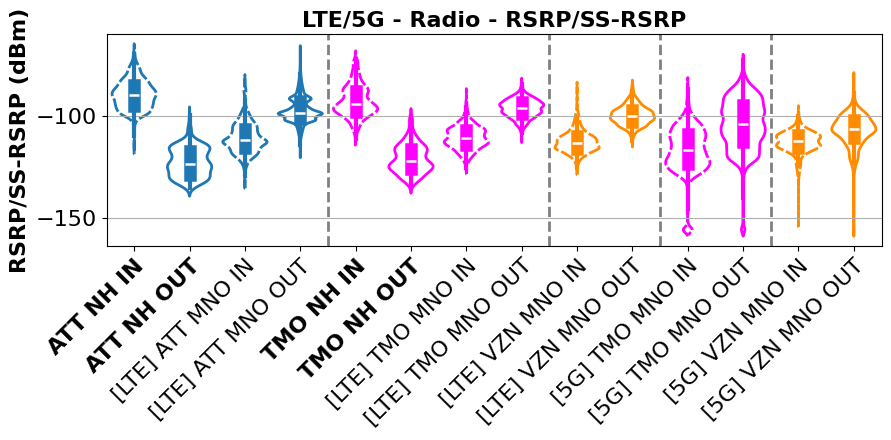

In [20]:
# LTE/5G - Radio - RSRP/SS-RSRP
fig, ax = plt.subplots(figsize=(10, 2.75))
palette = ['tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'magenta', 'magenta', 'magenta', 'magenta', 'darkorange', 'darkorange', 'magenta', 'magenta', 'darkorange', 'darkorange']
data = pd.concat([
    df_lte_radio_att_nh_in.assign(Collection_plot='ATT NH IN'),
    df_lte_radio_att_nh_out.assign(Collection_plot='ATT NH OUT'),
    df_lte_radio_att_mno_in.assign(Collection_plot='[LTE] ATT MNO IN'),
    df_lte_radio_att_mno_out.assign(Collection_plot='[LTE] ATT MNO OUT'),
    df_lte_radio_tmo_nh_in.assign(Collection_plot='TMO NH IN'),
    df_lte_radio_tmo_nh_out.assign(Collection_plot='TMO NH OUT'),
    df_lte_radio_tmo_mno_in.assign(Collection_plot='[LTE] TMO MNO IN'),
    df_lte_radio_tmo_mno_out.assign(Collection_plot='[LTE] TMO MNO OUT'),
    df_lte_radio_vzn_mno_in.assign(Collection_plot='[LTE] VZN MNO IN'),
    df_lte_radio_vzn_mno_out.assign(Collection_plot='[LTE] VZN MNO OUT'),
    df_5g_radio_tmo_mno_in.rename(columns={'SS-RSRP': 'RSRP'}).assign(Collection_plot='[5G] TMO MNO IN'),
    df_5g_radio_tmo_mno_out.rename(columns={'SS-RSRP': 'RSRP'}).assign(Collection_plot='[5G] TMO MNO OUT'),
    df_5g_radio_vzn_mno_in.rename(columns={'SS-RSRP': 'RSRP'}).assign(Collection_plot='[5G] VZN MNO IN'),
    df_5g_radio_vzn_mno_out.rename(columns={'SS-RSRP': 'RSRP'}).assign(Collection_plot='[5G] VZN MNO OUT')
])
sns.violinplot(data=data, x='Collection_plot', y='RSRP', hue='Collection_plot', palette=palette, fill=False, linewidth=2, ax=ax)
for i in range(0, 14, 2):
    ax.collections[i].set_linestyle((0,(5,1))) # for densly dashed lines
plt.axvline(x=3.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=7.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=9.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=11.5, color='gray', linestyle='--', linewidth=2)
plt.xticks(rotation=45, ha='right')
dx = 10 / 72
dy = 0 / 72
offset = ScaledTranslation(dx, dy, fig.dpi_scale_trans)
for label in ax.xaxis.get_majorticklabels():
    label.set_transform(label.get_transform() + offset)
labels = plt.gca().get_xticklabels()
for label in labels:
    if label.get_text() in ['ATT NH IN', 'ATT NH OUT', 'TMO NH IN', 'TMO NH OUT']:
        label.set_fontweight('bold')
plt.xlabel('')
plt.ylabel('RSRP/SS-RSRP (dBm)', fontsize=16, fontweight='bold')
plt.title('LTE/5G - Radio - RSRP/SS-RSRP', fontsize=16, fontweight='bold')
plt.grid(True, axis='y')
# plt.savefig('figs/josh_dl_tput_all_plot.png', bbox_inches='tight', dpi=300)
# plt.savefig('figs/josh_dl_tput_all_plot.pdf', bbox_inches='tight')
plt.show()
del fig, ax, dx, dy, offset, label, data, palette, labels

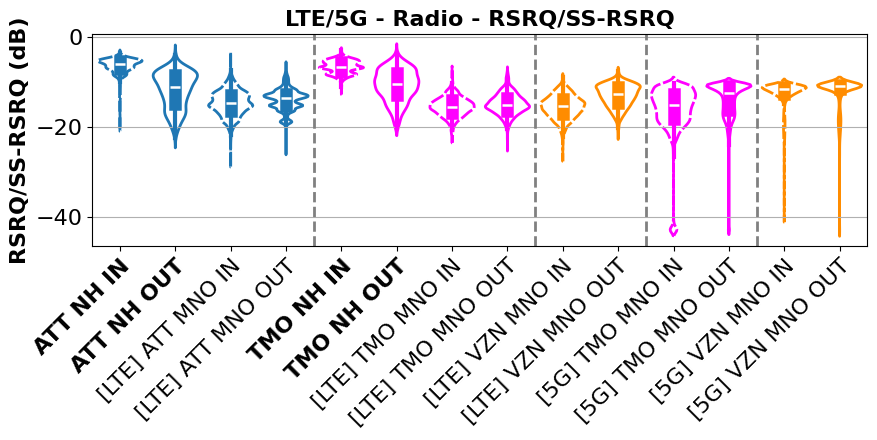

In [21]:
# LTE/5G - Radio - RSRQ/SS-RSRQ
fig, ax = plt.subplots(figsize=(10, 2.75))
palette = ['tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'magenta', 'magenta', 'magenta', 'magenta', 'darkorange', 'darkorange', 'magenta', 'magenta', 'darkorange', 'darkorange']
data = pd.concat([
    df_lte_radio_att_nh_in.assign(Collection_plot='ATT NH IN'),
    df_lte_radio_att_nh_out.assign(Collection_plot='ATT NH OUT'),
    df_lte_radio_att_mno_in.assign(Collection_plot='[LTE] ATT MNO IN'),
    df_lte_radio_att_mno_out.assign(Collection_plot='[LTE] ATT MNO OUT'),
    df_lte_radio_tmo_nh_in.assign(Collection_plot='TMO NH IN'),
    df_lte_radio_tmo_nh_out.assign(Collection_plot='TMO NH OUT'),
    df_lte_radio_tmo_mno_in.assign(Collection_plot='[LTE] TMO MNO IN'),
    df_lte_radio_tmo_mno_out.assign(Collection_plot='[LTE] TMO MNO OUT'),
    df_lte_radio_vzn_mno_in.assign(Collection_plot='[LTE] VZN MNO IN'),
    df_lte_radio_vzn_mno_out.assign(Collection_plot='[LTE] VZN MNO OUT'),
    df_5g_radio_tmo_mno_in.rename(columns={'SS-RSRQ': 'RSRQ'}).assign(Collection_plot='[5G] TMO MNO IN'),
    df_5g_radio_tmo_mno_out.rename(columns={'SS-RSRQ': 'RSRQ'}).assign(Collection_plot='[5G] TMO MNO OUT'),
    df_5g_radio_vzn_mno_in.rename(columns={'SS-RSRQ': 'RSRQ'}).assign(Collection_plot='[5G] VZN MNO IN'),
    df_5g_radio_vzn_mno_out.rename(columns={'SS-RSRQ': 'RSRQ'}).assign(Collection_plot='[5G] VZN MNO OUT')
])
sns.violinplot(data=data.dropna(subset=['RSRQ']), x='Collection_plot', y='RSRQ', hue='Collection_plot', palette=palette, fill=False, linewidth=2, ax=ax)
for i in range(0, 14, 2):
    ax.collections[i].set_linestyle((0,(5,1))) # for densly dashed lines
plt.axvline(x=3.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=7.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=9.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=11.5, color='gray', linestyle='--', linewidth=2)
plt.xticks(rotation=45, ha='right')
dx = 10 / 72
dy = 0 / 72
offset = ScaledTranslation(dx, dy, fig.dpi_scale_trans)
for label in ax.xaxis.get_majorticklabels():
    label.set_transform(label.get_transform() + offset)
labels = plt.gca().get_xticklabels()
for label in labels:
    if label.get_text() in ['ATT NH IN', 'ATT NH OUT', 'TMO NH IN', 'TMO NH OUT']:
        label.set_fontweight('bold')
plt.xlabel('')
plt.ylabel('RSRQ/SS-RSRQ (dB)', fontsize=16, fontweight='bold')
plt.title('LTE/5G - Radio - RSRQ/SS-RSRQ', fontsize=16, fontweight='bold')
plt.grid(True, axis='y')
# plt.savefig('figs/josh_dl_tput_all_plot.png', bbox_inches='tight', dpi=300)
# plt.savefig('figs/josh_dl_tput_all_plot.pdf', bbox_inches='tight')
plt.show()
del fig, ax, dx, dy, offset, label, data, palette, labels

##### Plots: NH - In vs Out

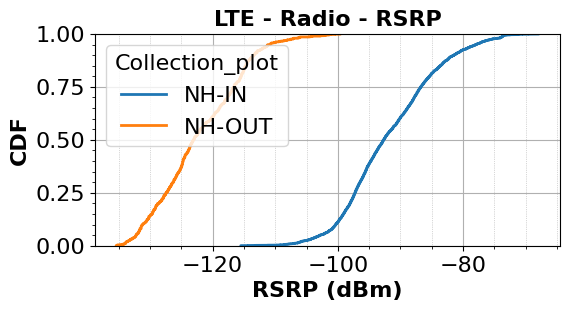

In [22]:
# LTE - Radio - RSRP
fig, ax = plt.subplots(figsize=(6, 2.75))
data = pd.concat([
    df_lte_radio_att_nh_in.assign(Collection_plot='NH-IN'),
    df_lte_radio_att_nh_out.assign(Collection_plot='NH-OUT'),
    df_lte_radio_tmo_nh_in.assign(Collection_plot='NH-IN'),
    df_lte_radio_tmo_nh_out.assign(Collection_plot='NH-OUT'),
])
sns.ecdfplot(data=data, x='RSRP', hue='Collection_plot', ax=ax, linewidth=2)
plt.ylabel('CDF', fontsize=16, fontweight='bold')
plt.xlabel('RSRP (dBm)', fontsize=16, fontweight='bold')
plt.title('LTE - Radio - RSRP', fontsize=16, fontweight='bold')
plt.grid(True)
ax.minorticks_on()
ax.xaxis.grid(True, which='minor', linestyle=':', linewidth=0.5)
# plt.savefig('figs/josh_dl_tput_all_plot.png', bbox_inches='tight', dpi=300)
plt.savefig('figs/plot_radio_in_vs_out.pdf', bbox_inches='tight')
# plt.show()
del fig, ax, data

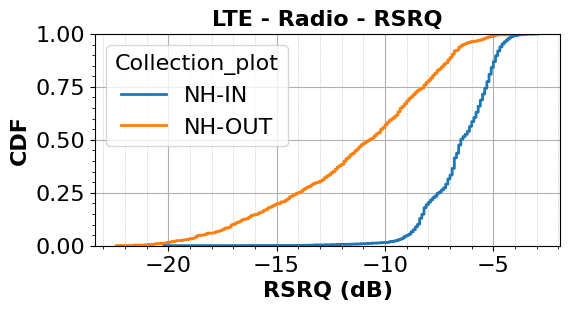

In [23]:
# LTE - Radio - RSRQ
fig, ax = plt.subplots(figsize=(6, 2.75))
data = pd.concat([
    df_lte_radio_att_nh_in.assign(Collection_plot='NH-IN'),
    df_lte_radio_att_nh_out.assign(Collection_plot='NH-OUT'),
    df_lte_radio_tmo_nh_in.assign(Collection_plot='NH-IN'),
    df_lte_radio_tmo_nh_out.assign(Collection_plot='NH-OUT'),
])
sns.ecdfplot(data=data, x='RSRQ', hue='Collection_plot', ax=ax, linewidth=2)
plt.ylabel('CDF', fontsize=16, fontweight='bold')
plt.xlabel('RSRQ (dB)', fontsize=16, fontweight='bold')
plt.title('LTE - Radio - RSRQ', fontsize=16, fontweight='bold')
plt.grid(True)
ax.minorticks_on()
ax.xaxis.grid(True, which='minor', linestyle=':', linewidth=0.5)
# plt.savefig('figs/josh_dl_tput_all_plot.png', bbox_inches='tight', dpi=300)
# plt.savefig('figs/josh_dl_tput_all_plot.pdf', bbox_inches='tight')
plt.show()
del fig, ax, data

##### Plots: Band specific

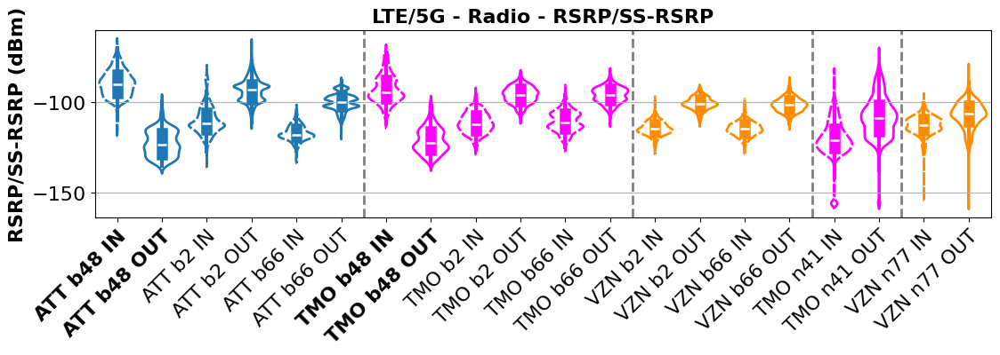

In [24]:
# LTE/5G - Radio - RSRP/SS-RSRP
fig, ax = plt.subplots(figsize=(13, 2.75))
palette = ['tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'magenta', 'magenta', 'magenta', 'magenta', 'magenta', 'magenta', 'darkorange', 'darkorange', 'darkorange', 'darkorange', 'magenta', 'magenta', 'darkorange', 'darkorange']
data = pd.concat([
    df_lte_radio_att_nh_in.assign(Collection_plot='ATT b48 IN'),
    df_lte_radio_att_nh_out.assign(Collection_plot='ATT b48 OUT'),
    df_lte_radio_att_mno_in[df_lte_radio_att_mno_in['Band Number']==2].assign(Collection_plot='ATT b2 IN'),
    df_lte_radio_att_mno_out[df_lte_radio_att_mno_out['Band Number']==2].assign(Collection_plot='ATT b2 OUT'),
    df_lte_radio_att_mno_in[df_lte_radio_att_mno_in['Band Number']==66].assign(Collection_plot='ATT b66 IN'),
    df_lte_radio_att_mno_out[df_lte_radio_att_mno_out['Band Number']==66].assign(Collection_plot='ATT b66 OUT'),
    df_lte_radio_tmo_nh_in.assign(Collection_plot='TMO b48 IN'),
    df_lte_radio_tmo_nh_out.assign(Collection_plot='TMO b48 OUT'),
    df_lte_radio_tmo_mno_in[df_lte_radio_tmo_mno_in['Band Number']==2].assign(Collection_plot='TMO b2 IN'),
    df_lte_radio_tmo_mno_out[df_lte_radio_tmo_mno_out['Band Number']==2].assign(Collection_plot='TMO b2 OUT'),
    df_lte_radio_tmo_mno_in[df_lte_radio_tmo_mno_in['Band Number']==66].assign(Collection_plot='TMO b66 IN'),
    df_lte_radio_tmo_mno_out[df_lte_radio_tmo_mno_out['Band Number']==66].assign(Collection_plot='TMO b66 OUT'),
    df_lte_radio_vzn_mno_in[df_lte_radio_vzn_mno_in['Band Number']==2].assign(Collection_plot='VZN b2 IN'),
    df_lte_radio_vzn_mno_out[df_lte_radio_vzn_mno_out['Band Number']==2].assign(Collection_plot='VZN b2 OUT'),
    df_lte_radio_vzn_mno_in[df_lte_radio_vzn_mno_in['Band Number']==66].assign(Collection_plot='VZN b66 IN'),
    df_lte_radio_vzn_mno_out[df_lte_radio_vzn_mno_out['Band Number']==66].assign(Collection_plot='VZN b66 OUT'),
    df_5g_radio_tmo_mno_in[df_5g_radio_tmo_mno_in['Band Number']==41].rename(columns={'SS-RSRP': 'RSRP'}).assign(Collection_plot='TMO n41 IN'),
    df_5g_radio_tmo_mno_out[df_5g_radio_tmo_mno_out['Band Number']==41].rename(columns={'SS-RSRP': 'RSRP'}).assign(Collection_plot='TMO n41 OUT'),
    df_5g_radio_vzn_mno_in[df_5g_radio_vzn_mno_in['Band Number']==77].rename(columns={'SS-RSRP': 'RSRP'}).assign(Collection_plot='VZN n77 IN'),
    df_5g_radio_vzn_mno_out[df_5g_radio_vzn_mno_out['Band Number']==77].rename(columns={'SS-RSRP': 'RSRP'}).assign(Collection_plot='VZN n77 OUT'),
])
sns.violinplot(data=data, x='Collection_plot', y='RSRP', hue='Collection_plot', palette=palette, fill=False, linewidth=2, ax=ax)
for i in range(0, 20, 2):
    ax.collections[i].set_linestyle((0,(5,1))) # for densly dashed lines
plt.axvline(x=5.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=11.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=15.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=17.5, color='gray', linestyle='--', linewidth=2)
plt.xticks(rotation=45, ha='right')
dx = 10 / 72
dy = 0 / 72
offset = ScaledTranslation(dx, dy, fig.dpi_scale_trans)
for label in ax.xaxis.get_majorticklabels():
    label.set_transform(label.get_transform() + offset)
labels = plt.gca().get_xticklabels()
for label in labels:
    if label.get_text() in ['ATT b48 IN', 'ATT b48 OUT', 'TMO b48 IN', 'TMO b48 OUT']:
        label.set_fontweight('bold')
plt.xlabel('')
plt.ylabel('RSRP/SS-RSRP (dBm)', fontsize=16, fontweight='bold')
plt.title('LTE/5G - Radio - RSRP/SS-RSRP', fontsize=16, fontweight='bold')
plt.grid(True, axis='y')
# plt.savefig('figs/josh_dl_tput_all_plot.png', bbox_inches='tight', dpi=300)
# plt.savefig('figs/josh_dl_tput_all_plot.pdf', bbox_inches='tight')
plt.show()
del fig, ax, dx, dy, offset, label, data, palette, labels

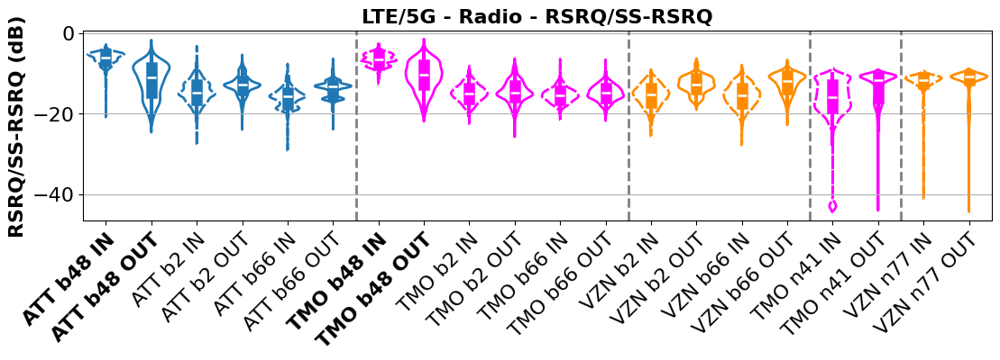

In [25]:
# LTE/5G - Radio - RSRQ/SS-RSRQ
fig, ax = plt.subplots(figsize=(13, 2.75))
palette = ['tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'magenta', 'magenta', 'magenta', 'magenta', 'magenta', 'magenta', 'darkorange', 'darkorange', 'darkorange', 'darkorange', 'magenta', 'magenta', 'darkorange', 'darkorange']
data = pd.concat([
    df_lte_radio_att_nh_in.assign(Collection_plot='ATT b48 IN'),
    df_lte_radio_att_nh_out.assign(Collection_plot='ATT b48 OUT'),
    df_lte_radio_att_mno_in[df_lte_radio_att_mno_in['Band Number']==2].assign(Collection_plot='ATT b2 IN'),
    df_lte_radio_att_mno_out[df_lte_radio_att_mno_out['Band Number']==2].assign(Collection_plot='ATT b2 OUT'),
    df_lte_radio_att_mno_in[df_lte_radio_att_mno_in['Band Number']==66].assign(Collection_plot='ATT b66 IN'),
    df_lte_radio_att_mno_out[df_lte_radio_att_mno_out['Band Number']==66].assign(Collection_plot='ATT b66 OUT'),
    df_lte_radio_tmo_nh_in.assign(Collection_plot='TMO b48 IN'),
    df_lte_radio_tmo_nh_out.assign(Collection_plot='TMO b48 OUT'),
    df_lte_radio_tmo_mno_in[df_lte_radio_tmo_mno_in['Band Number']==2].assign(Collection_plot='TMO b2 IN'),
    df_lte_radio_tmo_mno_out[df_lte_radio_tmo_mno_out['Band Number']==2].assign(Collection_plot='TMO b2 OUT'),
    df_lte_radio_tmo_mno_in[df_lte_radio_tmo_mno_in['Band Number']==66].assign(Collection_plot='TMO b66 IN'),
    df_lte_radio_tmo_mno_out[df_lte_radio_tmo_mno_out['Band Number']==66].assign(Collection_plot='TMO b66 OUT'),
    df_lte_radio_vzn_mno_in[df_lte_radio_vzn_mno_in['Band Number']==2].assign(Collection_plot='VZN b2 IN'),
    df_lte_radio_vzn_mno_out[df_lte_radio_vzn_mno_out['Band Number']==2].assign(Collection_plot='VZN b2 OUT'),
    df_lte_radio_vzn_mno_in[df_lte_radio_vzn_mno_in['Band Number']==66].assign(Collection_plot='VZN b66 IN'),
    df_lte_radio_vzn_mno_out[df_lte_radio_vzn_mno_out['Band Number']==66].assign(Collection_plot='VZN b66 OUT'),
    df_5g_radio_tmo_mno_in[df_5g_radio_tmo_mno_in['Band Number']==41].rename(columns={'SS-RSRQ': 'RSRQ'}).assign(Collection_plot='TMO n41 IN'),
    df_5g_radio_tmo_mno_out[df_5g_radio_tmo_mno_out['Band Number']==41].rename(columns={'SS-RSRQ': 'RSRQ'}).assign(Collection_plot='TMO n41 OUT'),
    df_5g_radio_vzn_mno_in[df_5g_radio_vzn_mno_in['Band Number']==77].rename(columns={'SS-RSRQ': 'RSRQ'}).assign(Collection_plot='VZN n77 IN'),
    df_5g_radio_vzn_mno_out[df_5g_radio_vzn_mno_out['Band Number']==77].rename(columns={'SS-RSRQ': 'RSRQ'}).assign(Collection_plot='VZN n77 OUT'),
])
sns.violinplot(data=data.dropna(subset=['RSRQ']), x='Collection_plot', y='RSRQ', hue='Collection_plot', palette=palette, fill=False, linewidth=2, ax=ax)
for i in range(0, 20, 2):
    ax.collections[i].set_linestyle((0,(5,1))) # for densly dashed lines
plt.axvline(x=5.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=11.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=15.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=17.5, color='gray', linestyle='--', linewidth=2)
plt.xticks(rotation=45, ha='right')
dx = 10 / 72
dy = 0 / 72
offset = ScaledTranslation(dx, dy, fig.dpi_scale_trans)
for label in ax.xaxis.get_majorticklabels():
    label.set_transform(label.get_transform() + offset)
labels = plt.gca().get_xticklabels()
for label in labels:
    if label.get_text() in ['ATT b48 IN', 'ATT b48 OUT', 'TMO b48 IN', 'TMO b48 OUT']:
        label.set_fontweight('bold')
plt.xlabel('')
plt.ylabel('RSRQ/SS-RSRQ (dB)', fontsize=16, fontweight='bold')
plt.title('LTE/5G - Radio - RSRQ/SS-RSRQ', fontsize=16, fontweight='bold')
plt.grid(True, axis='y')
# plt.savefig('figs/josh_dl_tput_all_plot.png', bbox_inches='tight', dpi=300)
# plt.savefig('figs/josh_dl_tput_all_plot.pdf', bbox_inches='tight')
plt.show()
del fig, ax, dx, dy, offset, label, data, palette, labels

##### print(): PCI statistics

Summary of Representative PCIs:

NH IN - AP 1 - PCI 4,7

NH OUT - AP 6 - PCI 8,15

ATT b2,66 - PCI 77

TMO b2 - PCI 231

TMO b66 - PCI 294

VZN b2,66 - PCI 357

TMO n41 - PCI 681

VZN n77 - PCI 357

In [26]:
print('LTE ATT NH IN')
print(df_lte_radio_att_nh_in[['Band Number', 'PCI LTE']].value_counts().sort_index())
print('LTE ATT NH OUT')
print(df_lte_radio_att_nh_out[['Band Number', 'PCI LTE']].value_counts().sort_index())
print('LTE ATT MNO IN')
print(df_lte_radio_att_mno_in[['Band Number', 'PCI LTE']].value_counts().sort_index())
print('LTE ATT MNO OUT')
print(df_lte_radio_att_mno_out[['Band Number', 'PCI LTE']].value_counts().sort_index())

LTE ATT NH IN
Band Number  PCI LTE
48           4          198
             5          171
             7          193
             8          135
             9           45
             13         238
             15         133
             16         231
             20          51
             21          66
             23         182
             25          71
Name: count, dtype: int64
LTE ATT NH OUT
Band Number  PCI LTE
48           4          149
             7          156
             8           79
             13           3
             15          80
             16           3
             21          27
             25          27
Name: count, dtype: int64
LTE ATT MNO IN
Band Number  PCI LTE
2            77         2614
             80          332
             149          11
             422         379
             430        1097
12           77         1091
             80           26
             81          162
             149           9
             422    

In [27]:
print('LTE TMO NH IN')
print(df_lte_radio_tmo_nh_in[['Band Number', 'PCI LTE']].value_counts().sort_index())
print('LTE TMO NH OUT')
print(df_lte_radio_tmo_nh_out[['Band Number', 'PCI LTE']].value_counts().sort_index())
print('LTE TMO MNO IN')
print(df_lte_radio_tmo_mno_in[['Band Number', 'PCI LTE']].value_counts().sort_index())
print('LTE TMO MNO OUT')
print(df_lte_radio_tmo_mno_out[['Band Number', 'PCI LTE']].value_counts().sort_index())

LTE TMO NH IN
Band Number  PCI LTE
48           4          514
             5          318
             7          512
             8          142
             9           57
             13         373
             15         141
             16         370
             20          55
             21         105
             23         320
             25         108
Name: count, dtype: int64
LTE TMO NH OUT
Band Number  PCI LTE
48           4          129
             5            8
             7          129
             8           99
             15          97
             23           7
Name: count, dtype: int64
LTE TMO MNO IN
Band Number  PCI LTE
2            231         916
             462         774
12           252         419
             306         195
66           294         790
             330        1045
Name: count, dtype: int64
LTE TMO MNO OUT
Band Number  PCI LTE
2            231        374
             462        584
             494          9
12           252

In [28]:
print('LTE VZN MNO IN')
print(df_lte_radio_vzn_mno_in[['Band Number', 'PCI LTE']].value_counts().sort_index())
print('LTE VZN MNO OUT')
print(df_lte_radio_vzn_mno_out[['Band Number', 'PCI LTE']].value_counts().sort_index())

LTE VZN MNO IN
Band Number  PCI LTE
2            155          36
             318          19
             357        2066
5            357        1359
             389          10
13           125         407
             155         144
             318          80
             357         717
66           125         132
             155          10
             318         155
             357        4043
Name: count, dtype: int64
LTE VZN MNO OUT
Band Number  PCI LTE
2            357         333
13           125        1073
             357         331
66           125        1554
             357        1333
Name: count, dtype: int64


In [29]:
print('5G TMO MNO IN')
print(df_5g_radio_tmo_mno_in[['Band Number', 'PCI 5G NR']].value_counts().sort_index())
print('5G TMO MNO OUT')
print(df_5g_radio_tmo_mno_out[['Band Number', 'PCI 5G NR']].value_counts().sort_index())
print('5G VZN MNO IN')
print(df_5g_radio_vzn_mno_in[['Band Number', 'PCI 5G NR']].value_counts().sort_index())
print('5G VZN MNO OUT')
print(df_5g_radio_vzn_mno_out[['Band Number', 'PCI 5G NR']].value_counts().sort_index())

5G TMO MNO IN
Band Number  PCI 5G NR
25.0         16            256
             24             36
             137           534
             257            20
             286             7
                          ... 
71.0         771          2057
             808             2
             817             3
             852           152
             860             1
Name: count, Length: 62, dtype: int64
5G TMO MNO OUT
Band Number  PCI 5G NR
25.0         16               4
             137            729
             447           3500
             585           3518
41.0         87             334
             150              1
             188            864
             211             72
             228              5
             257              1
             302            193
             328           1146
             353             42
             381              4
             422              3
             447              1
             530             77
  

##### Plots: PCI specific

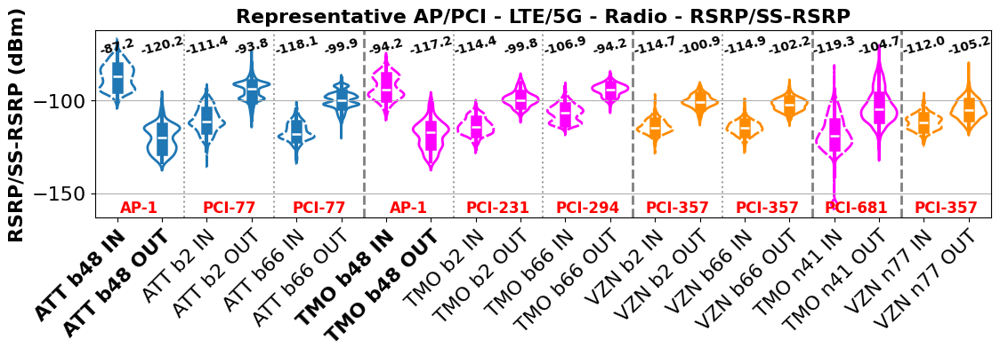

In [30]:
# LTE/5G - Radio - RSRP/SS-RSRP
fig, ax = plt.subplots(figsize=(13, 2.75))
palette = ['tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'magenta', 'magenta', 'magenta', 'magenta', 'magenta', 'magenta', 'darkorange', 'darkorange', 'darkorange', 'darkorange', 'magenta', 'magenta', 'darkorange', 'darkorange']
data = pd.concat([
    df_lte_radio_att_nh_in[df_lte_radio_att_nh_in['PCI LTE'].isin([4, 7])].assign(Collection_plot='ATT b48 IN'),
    df_lte_radio_att_nh_out[df_lte_radio_att_nh_out['PCI LTE'].isin([4, 7])].assign(Collection_plot='ATT b48 OUT'),
    df_lte_radio_att_mno_in[(df_lte_radio_att_mno_in['Band Number'] == 2) & (df_lte_radio_att_mno_in['PCI LTE'] == 77)].assign(Collection_plot='ATT b2 IN'),
    df_lte_radio_att_mno_out[(df_lte_radio_att_mno_out['Band Number'] == 2) & (df_lte_radio_att_mno_out['PCI LTE'] == 77)].assign(Collection_plot='ATT b2 OUT'),
    df_lte_radio_att_mno_in[(df_lte_radio_att_mno_in['Band Number'] == 66) & (df_lte_radio_att_mno_in['PCI LTE'] == 77)].assign(Collection_plot='ATT b66 IN'),
    df_lte_radio_att_mno_out[(df_lte_radio_att_mno_out['Band Number'] == 66) & (df_lte_radio_att_mno_out['PCI LTE'] == 77)].assign(Collection_plot='ATT b66 OUT'),
    df_lte_radio_tmo_nh_in[df_lte_radio_tmo_nh_in['PCI LTE'].isin([4, 7])].assign(Collection_plot='TMO b48 IN'),
    df_lte_radio_tmo_nh_out[df_lte_radio_tmo_nh_out['PCI LTE'].isin([4, 7])].assign(Collection_plot='TMO b48 OUT'),
    df_lte_radio_tmo_mno_in[(df_lte_radio_tmo_mno_in['Band Number']==2) & (df_lte_radio_tmo_mno_in['PCI LTE'] == 231)].assign(Collection_plot='TMO b2 IN'),
    df_lte_radio_tmo_mno_out[(df_lte_radio_tmo_mno_out['Band Number']==2) & (df_lte_radio_tmo_mno_out['PCI LTE'] == 231)].assign(Collection_plot='TMO b2 OUT'),
    df_lte_radio_tmo_mno_in[(df_lte_radio_tmo_mno_in['Band Number']==66) & (df_lte_radio_tmo_mno_in['PCI LTE'] == 294)].assign(Collection_plot='TMO b66 IN'),
    df_lte_radio_tmo_mno_out[(df_lte_radio_tmo_mno_out['Band Number']==66) & (df_lte_radio_tmo_mno_out['PCI LTE'] == 294)].assign(Collection_plot='TMO b66 OUT'),
    df_lte_radio_vzn_mno_in[(df_lte_radio_vzn_mno_in['Band Number'] == 2) & (df_lte_radio_vzn_mno_in['PCI LTE'] == 357)].assign(Collection_plot='VZN b2 IN'),
    df_lte_radio_vzn_mno_out[(df_lte_radio_vzn_mno_out['Band Number'] == 2) & (df_lte_radio_vzn_mno_out['PCI LTE'] == 357)].assign(Collection_plot='VZN b2 OUT'),
    df_lte_radio_vzn_mno_in[(df_lte_radio_vzn_mno_in['Band Number'] == 66) & (df_lte_radio_vzn_mno_in['PCI LTE'] == 357)].assign(Collection_plot='VZN b66 IN'),
    df_lte_radio_vzn_mno_out[(df_lte_radio_vzn_mno_out['Band Number'] == 66) & (df_lte_radio_vzn_mno_out['PCI LTE'] == 357)].assign(Collection_plot='VZN b66 OUT'),
    df_5g_radio_tmo_mno_in[(df_5g_radio_tmo_mno_in['Band Number']==41) & (df_5g_radio_tmo_mno_in['PCI 5G NR']==681)].rename(columns={'SS-RSRP': 'RSRP'}).assign(Collection_plot='TMO n41 IN'),
    df_5g_radio_tmo_mno_out[(df_5g_radio_tmo_mno_out['Band Number']==41) & (df_5g_radio_tmo_mno_out['PCI 5G NR']==681)].rename(columns={'SS-RSRP': 'RSRP'}).assign(Collection_plot='TMO n41 OUT'),
    df_5g_radio_vzn_mno_in[(df_5g_radio_vzn_mno_in['Band Number']==77) & (df_5g_radio_vzn_mno_in['PCI 5G NR']==357)].rename(columns={'SS-RSRP': 'RSRP'}).assign(Collection_plot='VZN n77 IN'),
    df_5g_radio_vzn_mno_out[(df_5g_radio_vzn_mno_out['Band Number']==77) & (df_5g_radio_vzn_mno_out['PCI 5G NR']==357)].rename(columns={'SS-RSRP': 'RSRP'}).assign(Collection_plot='VZN n77 OUT')
])
sns.violinplot(data=data, x='Collection_plot', y='RSRP', hue='Collection_plot', palette=palette, fill=False, linewidth=2, ax=ax)
for i in range(0, 20, 2):
    ax.collections[i].set_linestyle((0,(5,1))) # for densly dashed lines
plt.axvline(x=5.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=11.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=15.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=17.5, color='gray', linestyle='--', linewidth=2)

plt.axvline(x=1.5, color='gray', linestyle=':', linewidth=1.5, alpha=0.75)
plt.axvline(x=3.5, color='gray', linestyle=':', linewidth=1.5, alpha=0.75)
plt.axvline(x=7.5, color='gray', linestyle=':', linewidth=1.5, alpha=0.75)
plt.axvline(x=9.5, color='gray', linestyle=':', linewidth=1.5, alpha=0.75)
plt.axvline(x=13.5, color='gray', linestyle=':', linewidth=1.5, alpha=0.75)
ax.text(0.05, 0.05, 'AP-1', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(0.15, 0.05, 'PCI-77', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(0.25, 0.05, 'PCI-77', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(0.35, 0.05, 'AP-1', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(0.45, 0.05, 'PCI-231', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(0.55, 0.05, 'PCI-294', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(0.65, 0.05, 'PCI-357', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(0.75, 0.05, 'PCI-357', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(0.85, 0.05, 'PCI-681', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(0.95, 0.05, 'PCI-357', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
medians = data.groupby('Collection_plot')['RSRP'].median()
for i, collection in enumerate(data['Collection_plot'].unique()):
    median_value = medians[collection]
    ax.text(i, -75, f'{median_value:.1f}', horizontalalignment='center', color='black', fontsize=10, fontweight='bold', rotation=15)

plt.xticks(rotation=45, ha='right')
dx = 10 / 72
dy = 0 / 72
offset = ScaledTranslation(dx, dy, fig.dpi_scale_trans)
for label in ax.xaxis.get_majorticklabels():
    label.set_transform(label.get_transform() + offset)
labels = plt.gca().get_xticklabels()
for label in labels:
    if label.get_text() in ['ATT b48 IN', 'ATT b48 OUT', 'TMO b48 IN', 'TMO b48 OUT']:
        label.set_fontweight('bold')
plt.xlabel('')
plt.ylabel('RSRP/SS-RSRP (dBm)', fontsize=16, fontweight='bold')
plt.title('Representative AP/PCI - LTE/5G - Radio - RSRP/SS-RSRP', fontsize=16, fontweight='bold')
plt.grid(True, axis='y')
# plt.savefig('figs/josh_dl_tput_all_plot.png', bbox_inches='tight', dpi=300)
# plt.savefig('figs/josh_dl_tput_all_plot.pdf', bbox_inches='tight')
plt.show()
del fig, ax, dx, dy, offset, label, data, palette, labels

/var/folders/j_/lbf42_q147v8jdwz_w2my7_c0000gn/T/ipykernel_82759/3886934542.py:27: UserWarning: The palette list has more values (20) than needed (19), which may not be intended.
  sns.violinplot(data=data.dropna(subset='RSRQ'), x='Collection_plot', y='RSRQ', hue='Collection_plot', palette=palette, fill=False, linewidth=2, ax=ax)


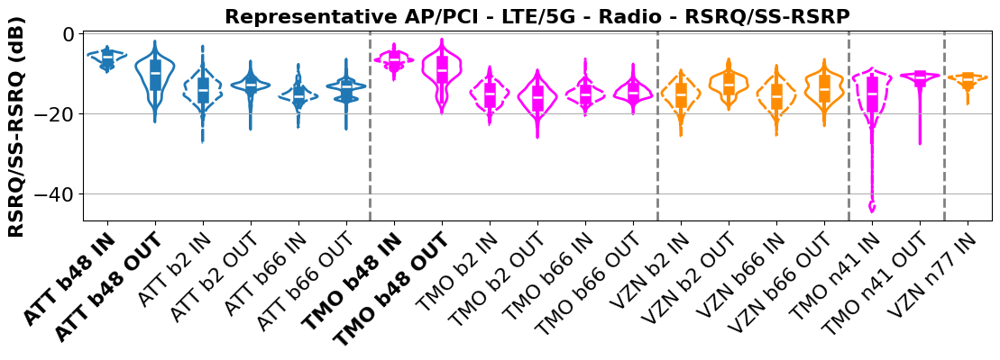

In [31]:
# LTE/5G - Radio - RSRQ/SS-RSRQ
fig, ax = plt.subplots(figsize=(13, 2.75))
palette = ['tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'magenta', 'magenta', 'magenta', 'magenta', 'magenta', 'magenta', 'darkorange', 'darkorange', 'darkorange', 'darkorange', 'magenta', 'magenta', 'darkorange', 'darkorange']
data = pd.concat([
    df_lte_radio_att_nh_in[df_lte_radio_att_nh_in['PCI LTE'].isin([4, 7])].assign(Collection_plot='ATT b48 IN'),
    df_lte_radio_att_nh_out[df_lte_radio_att_nh_out['PCI LTE'].isin([4, 7])].assign(Collection_plot='ATT b48 OUT'),
    df_lte_radio_att_mno_in[(df_lte_radio_att_mno_in['Band Number'] == 2) & (df_lte_radio_att_mno_in['PCI LTE'] == 77)].assign(Collection_plot='ATT b2 IN'),
    df_lte_radio_att_mno_out[(df_lte_radio_att_mno_out['Band Number'] == 2) & (df_lte_radio_att_mno_out['PCI LTE'] == 77)].assign(Collection_plot='ATT b2 OUT'),
    df_lte_radio_att_mno_in[(df_lte_radio_att_mno_in['Band Number'] == 66) & (df_lte_radio_att_mno_in['PCI LTE'] == 77)].assign(Collection_plot='ATT b66 IN'),
    df_lte_radio_att_mno_out[(df_lte_radio_att_mno_out['Band Number'] == 66) & (df_lte_radio_att_mno_out['PCI LTE'] == 77)].assign(Collection_plot='ATT b66 OUT'),
    df_lte_radio_tmo_nh_in[df_lte_radio_tmo_nh_in['PCI LTE'].isin([4, 7])].assign(Collection_plot='TMO b48 IN'),
    df_lte_radio_tmo_nh_out[df_lte_radio_tmo_nh_out['PCI LTE'].isin([4, 7])].assign(Collection_plot='TMO b48 OUT'),
    df_lte_radio_tmo_mno_in[(df_lte_radio_tmo_mno_in['Band Number']==2) & (df_lte_radio_tmo_mno_in['PCI LTE'] == 231)].assign(Collection_plot='TMO b2 IN'),
    df_lte_radio_tmo_mno_out[(df_lte_radio_tmo_mno_out['Band Number']==2) & (df_lte_radio_tmo_mno_out['PCI LTE'] == 231)].assign(Collection_plot='TMO b2 OUT'),
    df_lte_radio_tmo_mno_in[(df_lte_radio_tmo_mno_in['Band Number']==66) & (df_lte_radio_tmo_mno_in['PCI LTE'] == 294)].assign(Collection_plot='TMO b66 IN'),
    df_lte_radio_tmo_mno_out[(df_lte_radio_tmo_mno_out['Band Number']==66) & (df_lte_radio_tmo_mno_out['PCI LTE'] == 294)].assign(Collection_plot='TMO b66 OUT'),
    df_lte_radio_vzn_mno_in[(df_lte_radio_vzn_mno_in['Band Number'] == 2) & (df_lte_radio_vzn_mno_in['PCI LTE'] == 357)].assign(Collection_plot='VZN b2 IN'),
    df_lte_radio_vzn_mno_out[(df_lte_radio_vzn_mno_out['Band Number'] == 2) & (df_lte_radio_vzn_mno_out['PCI LTE'] == 357)].assign(Collection_plot='VZN b2 OUT'),
    df_lte_radio_vzn_mno_in[(df_lte_radio_vzn_mno_in['Band Number'] == 66) & (df_lte_radio_vzn_mno_in['PCI LTE'] == 357)].assign(Collection_plot='VZN b66 IN'),
    df_lte_radio_vzn_mno_out[(df_lte_radio_vzn_mno_out['Band Number'] == 66) & (df_lte_radio_vzn_mno_out['PCI LTE'] == 357)].assign(Collection_plot='VZN b66 OUT'),
    df_5g_radio_tmo_mno_in[(df_5g_radio_tmo_mno_in['Band Number']==41) & (df_5g_radio_tmo_mno_in['PCI 5G NR']==681)].rename(columns={'SS-RSRQ': 'RSRQ'}).assign(Collection_plot='TMO n41 IN'),
    df_5g_radio_tmo_mno_out[(df_5g_radio_tmo_mno_out['Band Number']==41) & (df_5g_radio_tmo_mno_out['PCI 5G NR']==681)].rename(columns={'SS-RSRQ': 'RSRQ'}).assign(Collection_plot='TMO n41 OUT'),
    df_5g_radio_vzn_mno_in[(df_5g_radio_vzn_mno_in['Band Number']==77) & (df_5g_radio_vzn_mno_in['PCI 5G NR']==357)].rename(columns={'SS-RSRQ': 'RSRQ'}).assign(Collection_plot='VZN n77 IN'),
    df_5g_radio_vzn_mno_out[(df_5g_radio_vzn_mno_out['Band Number']==77) & (df_5g_radio_vzn_mno_out['PCI 5G NR']==357)].rename(columns={'SS-RSRQ': 'RSRP'}).assign(Collection_plot='VZN n77 OUT')
])
data = data.dropna(subset=['RSRQ'])
sns.violinplot(data=data.dropna(subset='RSRQ'), x='Collection_plot', y='RSRQ', hue='Collection_plot', palette=palette, fill=False, linewidth=2, ax=ax)
for i in range(0, 20, 2):
    ax.collections[i].set_linestyle((0,(5,1))) # for densly dashed lines
plt.axvline(x=5.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=11.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=15.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=17.5, color='gray', linestyle='--', linewidth=2)
plt.xticks(rotation=45, ha='right')
dx = 10 / 72
dy = 0 / 72
offset = ScaledTranslation(dx, dy, fig.dpi_scale_trans)
for label in ax.xaxis.get_majorticklabels():
    label.set_transform(label.get_transform() + offset)
labels = plt.gca().get_xticklabels()
for label in labels:
    if label.get_text() in ['ATT b48 IN', 'ATT b48 OUT', 'TMO b48 IN', 'TMO b48 OUT']:
        label.set_fontweight('bold')
plt.xlabel('')
plt.ylabel('RSRQ/SS-RSRQ (dB)', fontsize=16, fontweight='bold')
plt.title('Representative AP/PCI - LTE/5G - Radio - RSRQ/SS-RSRP', fontsize=16, fontweight='bold')
plt.grid(True, axis='y')
# plt.savefig('figs/josh_dl_tput_all_plot.png', bbox_inches='tight', dpi=300)
# plt.savefig('figs/josh_dl_tput_all_plot.pdf', bbox_inches='tight')
plt.show()
del fig, ax, dx, dy, offset, label, data, palette, labels

#### PDSCH

##### Data cleaning & map plotting

In [32]:
print(df_lte_pdsch['Collection'].value_counts().sort_index())

Collection
Day1-ATT-MNO-DEF-IN        693
Day1-ATT-MNO-DEF-OUT       518
Day1-ATT-NH-IN             529
Day1-ATT-NH-OUT             78
Day1-TMO-MNO-DEF-IN        222
Day1-TMO-NH-IN             802
Day1-TMO-NH-OUT             39
Day2-ATT-MNO-4G-IN         769
Day2-ATT-MNO-4G-OUT        607
Day2-ATT-MNO-DEF-IN        737
Day2-ATT-MNO-DEF-OUT       763
Day2-ATT-MNO-DEF-OUTER     668
Day2-TMO-MNO-4G-IN         715
Day2-TMO-MNO-4G-OUT       1038
Day2-VZN-MNO-4G-IN         862
Day2-VZN-MNO-4G-OUT        704
Day2-VZN-MNO-DEF-IN        767
Day2-VZN-MNO-DEF-OUT       319
Day2-VZN-MNO-DEF-OUTER     287
Day3_ATT-MNO-DEF-IN-L1     758
Day3_ATT-MNO-DEF-IN-L2     566
Day3_ATT-NH-IN-L1          294
Day3_ATT-NH-IN-L2          457
Day3_TMO-DEF-L1-V1           9
Day3_TMO-NH-L1             526
Day3_TMO-NH-L2             249
Day3_unnamed                82
Name: count, dtype: int64


In [33]:
df_lte_pdsch_att_nh_in = df_lte_pdsch[df_lte_pdsch['Collection']=='Day1-ATT-NH-IN']
df_lte_pdsch_att_nh_out = df_lte_pdsch[df_lte_pdsch['Collection']=='Day1-ATT-NH-OUT']

df_lte_pdsch_att_mno_in = pd.concat([df_lte_pdsch[df_lte_pdsch['Collection']=='Day1-ATT-MNO-DEF-IN'],
                                    df_lte_pdsch[df_lte_pdsch['Collection']=='Day2-ATT-MNO-4G-IN'],
                                    df_lte_pdsch[df_lte_pdsch['Collection']=='Day2-ATT-MNO-DEF-IN']],
                                    ignore_index=True)
df_lte_pdsch_att_mno_out = pd.concat([df_lte_pdsch[df_lte_pdsch['Collection']=='Day1-ATT-MNO-DEF-OUT'],
                                    df_lte_pdsch[df_lte_pdsch['Collection']=='Day2-ATT-MNO-4G-OUT'],
                                    df_lte_pdsch[df_lte_pdsch['Collection']=='Day2-ATT-MNO-DEF-OUT']],
                                    # df_lte_pdsch[df_lte_pdsch['Collection']=='Day2-ATT-MNO-DEF-OUTER']],
                                    ignore_index=True)

df_lte_pdsch_tmo_nh_in = df_lte_pdsch[df_lte_pdsch['Collection']=='Day1-TMO-NH-IN']
df_lte_pdsch_tmo_nh_out = df_lte_pdsch[df_lte_pdsch['Collection']=='Day1-TMO-NH-OUT']

df_lte_pdsch_tmo_mno_in = pd.concat([df_lte_pdsch[df_lte_pdsch['Collection']=='Day1-TMO-MNO-DEF-IN'],
                                    df_lte_pdsch[df_lte_pdsch['Collection']=='Day2-TMO-MNO-4G-IN']],
                                    ignore_index=True)
df_lte_pdsch_tmo_mno_out = df_lte_pdsch[df_lte_pdsch['Collection']=='Day2-TMO-MNO-4G-OUT']

df_lte_pdsch_vzn_mno_in = pd.concat([df_lte_pdsch[df_lte_pdsch['Collection']=='Day2-VZN-MNO-4G-IN'],
                                    df_lte_pdsch[df_lte_pdsch['Collection']=='Day2-VZN-MNO-DEF-IN']],
                                    ignore_index=True)
df_lte_pdsch_vzn_mno_out = pd.concat([df_lte_pdsch[df_lte_pdsch['Collection']=='Day2-VZN-MNO-4G-OUT'],
                                    df_lte_pdsch[df_lte_pdsch['Collection']=='Day2-VZN-MNO-DEF-OUT']],
                                    # df_lte_pdsch[df_lte_pdsch['Collection']=='Day2-VZN-MNO-DEF-OUTER']],
                                    ignore_index=True)

In [34]:
plot_geo_scatter_map(df_lte_pdsch_att_nh_in, value_col="Normalized Throughput", title="LTE ATT NH IN", colorbar_title="Norm Tput", unit="")
plot_geo_scatter_map(df_lte_pdsch_att_nh_out, value_col="Normalized Throughput", title="LTE ATT NH OUT", colorbar_title="Norm Tput", unit="")
plot_geo_scatter_map(df_lte_pdsch_att_mno_in, value_col="Normalized Throughput", title="LTE ATT MNO IN", colorbar_title="Norm Tput", unit="")
plot_geo_scatter_map(df_lte_pdsch_att_mno_out, value_col="Normalized Throughput", title="LTE ATT MNO OUT", colorbar_title="Norm Tput", unit="")

plot_geo_scatter_map(df_lte_pdsch_tmo_nh_in, value_col="Normalized Throughput", title="LTE TMO NH IN", colorbar_title="Norm Tput", unit="")
plot_geo_scatter_map(df_lte_pdsch_tmo_nh_out, value_col="Normalized Throughput", title="LTE TMO NH OUT", colorbar_title="Norm Tput", unit="")
plot_geo_scatter_map(df_lte_pdsch_tmo_mno_in, value_col="Normalized Throughput", title="LTE TMO MNO IN", colorbar_title="Norm Tput", unit="")
plot_geo_scatter_map(df_lte_pdsch_tmo_mno_out, value_col="Normalized Throughput", title="LTE TMO MNO OUT", colorbar_title="Norm Tput", unit="")

plot_geo_scatter_map(df_lte_pdsch_vzn_mno_in, value_col="Normalized Throughput", title="LTE VZN MNO IN", colorbar_title="Norm Tput", unit="")
plot_geo_scatter_map(df_lte_pdsch_vzn_mno_out, value_col="Normalized Throughput", title="LTE VZN MNO OUT", colorbar_title="Norm Tput", unit="")

In [35]:
print(df_5g_pdsch['Collection'].value_counts().sort_index())

Collection
Day1-TMO-MNO-DEF-IN       1747
Day1-TMO-MNO-DEF-OUT      1579
Day2-TMO-MNO-DEF-IN        853
Day2-TMO-MNO-DEF-OUT      1283
Day2-TMO-MNO-DEF-OUTER     990
Day2-VZN-MNO-DEF-IN        460
Day2-VZN-MNO-DEF-OUT       631
Day2-VZN-MNO-DEF-OUTER     638
Day3_TMO-DEF-IN-L2         149
Day3_TMO-DEF-L1-V1         215
Day3_TMO-DEF-L2            113
Name: count, dtype: int64


In [36]:
df_5g_pdsch_tmo_mno_in = pd.concat([df_5g_pdsch[df_5g_pdsch['Collection']=='Day1-TMO-MNO-DEF-IN'],
                                    df_5g_pdsch[df_5g_pdsch['Collection']=='Day2-TMO-MNO-DEF-IN']],
                                    ignore_index=True)
df_5g_pdsch_tmo_mno_out = pd.concat([df_5g_pdsch[df_5g_pdsch['Collection']=='Day1-TMO-MNO-DEF-OUT'],
                                    df_5g_pdsch[df_5g_pdsch['Collection']=='Day2-TMO-MNO-DEF-OUT']],
                                    # df_5g_pdsch[df_5g_pdsch['Collection']=='Day2-TMO-MNO-DEF-OUTER']],
                                    ignore_index=True)

df_5g_pdsch_vzn_mno_in = df_5g_pdsch[df_5g_pdsch['Collection']=='Day2-VZN-MNO-DEF-IN']
df_5g_pdsch_vzn_mno_out = pd.concat([df_5g_pdsch[df_5g_pdsch['Collection']=='Day2-VZN-MNO-DEF-OUT']],
                                    # df_5g_pdsch[df_5g_pdsch['Collection']=='Day2-VZN-MNO-DEF-OUTER']],
                                    ignore_index=True)

In [37]:
plot_geo_scatter_map(df_5g_pdsch_tmo_mno_in, value_col="Normalized Throughput", title="5G TMO MNO IN", colorbar_title="Norm Tput", unit="")
plot_geo_scatter_map(df_5g_pdsch_tmo_mno_out, value_col="Normalized Throughput", title="5G TMO MNO OUT", colorbar_title="Norm Tput", unit="")

plot_geo_scatter_map(df_5g_pdsch_vzn_mno_in, value_col="Normalized Throughput", title="5G VZN MNO IN", colorbar_title="Norm Tput", unit="")
plot_geo_scatter_map(df_5g_pdsch_vzn_mno_out, value_col="Normalized Throughput", title="5G VZN MNO OUT", colorbar_title="Norm Tput", unit="")

##### print(): Statistics summary

In [38]:
print('LTE ATT NH IN')
print(df_lte_pdsch_att_nh_in[['Band Number', 'DL Freq', 'DL Bandwidth']].value_counts().sort_index())
print('LTE ATT NH OUT')
print(df_lte_pdsch_att_nh_out[['Band Number', 'DL Freq', 'DL Bandwidth']].value_counts().sort_index())
print('LTE ATT MNO IN')
print(df_lte_pdsch_att_mno_in[['Band Number', 'DL Freq', 'DL Bandwidth']].value_counts().sort_index())
print('LTE ATT MNO OUT')
print(df_lte_pdsch_att_mno_out[['Band Number', 'DL Freq', 'DL Bandwidth']].value_counts().sort_index())

LTE ATT NH IN
Band Number  DL Freq  DL Bandwidth
48.0         3560.0   20.0            127
             3590.0   20.0            133
             3620.0   20.0             22
             3650.0   20.0            118
             3690.0   20.0            129
Name: count, dtype: int64
LTE ATT NH OUT
Band Number  DL Freq  DL Bandwidth
48.0         3560.0   20.0            34
             3650.0   20.0            44
Name: count, dtype: int64
LTE ATT MNO IN
Band Number  DL Freq  DL Bandwidth
2.0          1940.0   10.0            337
             1980.0   15.0            788
12.0         740.0    10.0            367
14.0         760.0    10.0            163
30.0         2360.0   10.0            384
66.0         2180.0   10.0            160
Name: count, dtype: int64
LTE ATT MNO OUT
Band Number  DL Freq  DL Bandwidth
2.0          1940.0   10.0            347
             1980.0   15.0            903
14.0         760.0    10.0            162
30.0         2360.0   10.0            232
66.0      

In [39]:
print('LTE TMO NH IN')
print(df_lte_pdsch_tmo_nh_in[['Band Number', 'DL Freq', 'DL Bandwidth']].value_counts().sort_index())
print('LTE TMO NH OUT')
print(df_lte_pdsch_tmo_nh_out[['Band Number', 'DL Freq', 'DL Bandwidth']].value_counts().sort_index())
print('LTE TMO MNO IN')
print(df_lte_pdsch_tmo_mno_in[['Band Number', 'DL Freq', 'DL Bandwidth']].value_counts().sort_index())
print('LTE TMO MNO OUT')
print(df_lte_pdsch_tmo_mno_out[['Band Number', 'DL Freq', 'DL Bandwidth']].value_counts().sort_index())

LTE TMO NH IN
Band Number  DL Freq  DL Bandwidth
48.0         3560.0   20.0            220
             3590.0   20.0            206
             3620.0   20.0             21
             3650.0   20.0            180
             3690.0   20.0            175
Name: count, dtype: int64
LTE TMO NH OUT
Band Number  DL Freq  DL Bandwidth
48.0         3560.0   20.0            22
             3650.0   20.0            17
Name: count, dtype: int64
LTE TMO MNO IN
Band Number  DL Freq  DL Bandwidth
2.0          1930.0   5.0             217
12.0         730.0    5.0             182
66.0         2140.0   20.0            538
Name: count, dtype: int64
LTE TMO MNO OUT
Band Number  DL Freq  DL Bandwidth
2.0          1930.0   5.0             344
12.0         730.0    5.0             325
66.0         2140.0   20.0            369
Name: count, dtype: int64


In [40]:
print('LTE VZN MNO IN')
print(df_lte_pdsch_vzn_mno_in[['Band Number', 'DL Freq', 'DL Bandwidth']].value_counts().sort_index())
print('LTE VZN MNO OUT')
print(df_lte_pdsch_vzn_mno_out[['Band Number', 'DL Freq', 'DL Bandwidth']].value_counts().sort_index())

LTE VZN MNO IN
Band Number  DL Freq  DL Bandwidth
2.0          1950.0   10.0            343
5.0          880.0    10.0            222
13.0         750.0    10.0            339
66.0         2120.0   20.0            377
             2160.0   10.0            348
Name: count, dtype: int64
LTE VZN MNO OUT
Band Number  DL Freq  DL Bandwidth
2.0          1950.0   10.0             58
13.0         750.0    10.0            266
66.0         2120.0   20.0            635
             2160.0   10.0             64
Name: count, dtype: int64


In [41]:
print('5G TMO MNO IN')
print(df_5g_pdsch_tmo_mno_in[['Band Number', 'DL Freq', 'DL Bandwidth']].value_counts().sort_index())
print('5G TMO MNO OUT')
print(df_5g_pdsch_tmo_mno_out[['Band Number', 'DL Freq', 'DL Bandwidth']].value_counts().sort_index())
print('5G VZN MNO IN')
print(df_5g_pdsch_vzn_mno_in[['Band Number', 'DL Freq', 'DL Bandwidth']].value_counts().sort_index())
print('5G VZN MNO OUT')
print(df_5g_pdsch_vzn_mno_out[['Band Number', 'DL Freq', 'DL Bandwidth']].value_counts().sort_index())

5G TMO MNO IN
Band Number  DL Freq  DL Bandwidth
25.0         1960.0   14.0            739
             1990.0   9.0             266
41.0         2510.0   88.0            624
             2600.0   98.0            735
71.0         630.0    19.0            236
Name: count, dtype: int64
5G TMO MNO OUT
Band Number  DL Freq  DL Bandwidth
25.0         1960.0   14.0            831
             1990.0   9.0             214
41.0         2510.0   88.0            633
             2600.0   98.0            739
71.0         630.0    19.0            445
Name: count, dtype: int64
5G VZN MNO IN
Band Number  DL Freq  DL Bandwidth
77.0         3730.0   98.0            300
             3810.0   98.0            160
Name: count, dtype: int64
5G VZN MNO OUT
Band Number  DL Freq  DL Bandwidth
77.0         3730.0   98.0            353
             3810.0   98.0            278
Name: count, dtype: int64


##### Plots: All Meas

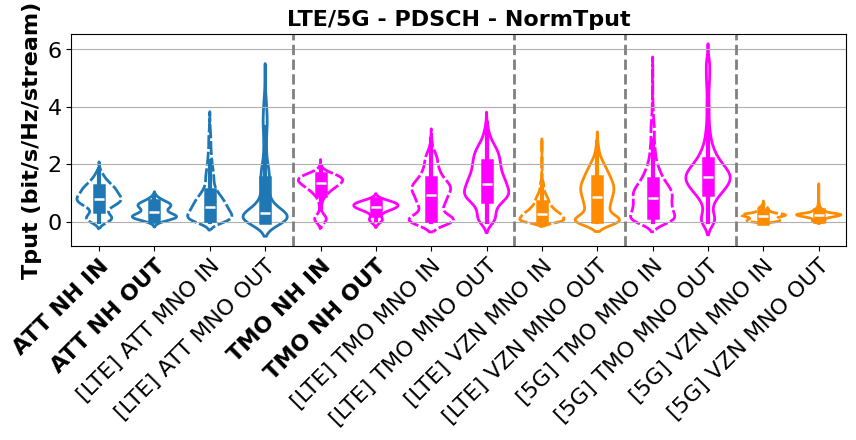

In [42]:
# LTE/5G - PDSCH - NormTput
fig, ax = plt.subplots(figsize=(10, 2.75))
palette = ['tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'magenta', 'magenta', 'magenta', 'magenta', 'darkorange', 'darkorange', 'magenta', 'magenta', 'darkorange', 'darkorange']
data = pd.concat([
    df_lte_pdsch_att_nh_in.assign(Collection_plot='ATT NH IN'),
    df_lte_pdsch_att_nh_out.assign(Collection_plot='ATT NH OUT'),
    df_lte_pdsch_att_mno_in.assign(Collection_plot='[LTE] ATT MNO IN'),
    df_lte_pdsch_att_mno_out.assign(Collection_plot='[LTE] ATT MNO OUT'),
    df_lte_pdsch_tmo_nh_in.assign(Collection_plot='TMO NH IN'),
    df_lte_pdsch_tmo_nh_out.assign(Collection_plot='TMO NH OUT'),
    df_lte_pdsch_tmo_mno_in.assign(Collection_plot='[LTE] TMO MNO IN'),
    df_lte_pdsch_tmo_mno_out.assign(Collection_plot='[LTE] TMO MNO OUT'),
    df_lte_pdsch_vzn_mno_in.assign(Collection_plot='[LTE] VZN MNO IN'),
    df_lte_pdsch_vzn_mno_out.assign(Collection_plot='[LTE] VZN MNO OUT'),
    df_5g_pdsch_tmo_mno_in.assign(Collection_plot='[5G] TMO MNO IN'),
    df_5g_pdsch_tmo_mno_out.assign(Collection_plot='[5G] TMO MNO OUT'),
    df_5g_pdsch_vzn_mno_in.assign(Collection_plot='[5G] VZN MNO IN'),
    df_5g_pdsch_vzn_mno_out.assign(Collection_plot='[5G] VZN MNO OUT')
])
sns.violinplot(data=data, x='Collection_plot', y='Normalized Throughput', hue='Collection_plot', palette=palette, fill=False, linewidth=2, ax=ax)
for i in range(0, 14, 2):
    ax.collections[i].set_linestyle((0,(5,1))) # for densly dashed lines
plt.axvline(x=3.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=7.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=9.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=11.5, color='gray', linestyle='--', linewidth=2)
plt.xticks(rotation=45, ha='right')
dx = 10 / 72
dy = 0 / 72
offset = ScaledTranslation(dx, dy, fig.dpi_scale_trans)
for label in ax.xaxis.get_majorticklabels():
    label.set_transform(label.get_transform() + offset)
labels = plt.gca().get_xticklabels()
for label in labels:
    if label.get_text() in ['ATT NH IN', 'ATT NH OUT', 'TMO NH IN', 'TMO NH OUT']:
        label.set_fontweight('bold')
plt.xlabel('')
plt.ylabel('Tput (bit/s/Hz/stream)', fontsize=16, fontweight='bold')
plt.title('LTE/5G - PDSCH - NormTput', fontsize=16, fontweight='bold')
plt.grid(True, axis='y')
# plt.savefig('figs/josh_dl_tput_all_plot.png', bbox_inches='tight', dpi=300)
# plt.savefig('figs/josh_dl_tput_all_plot.pdf', bbox_inches='tight')
plt.show()
del fig, ax, dx, dy, offset, label, data, labels

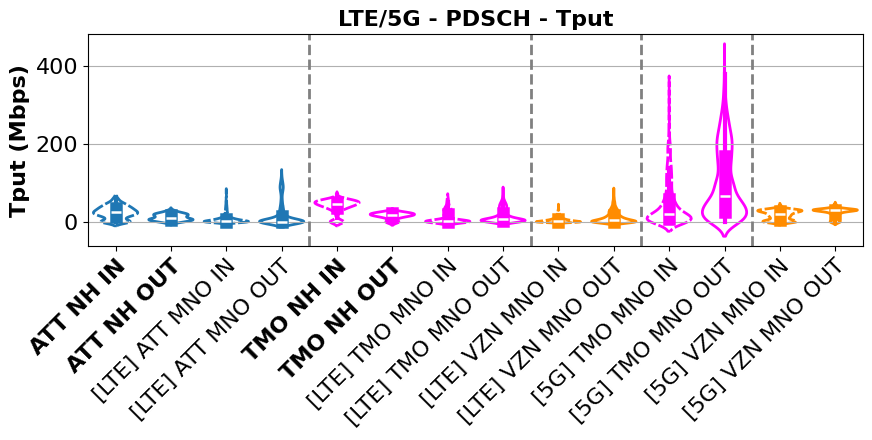

In [43]:
# LTE/5G - PDSCH - Tput
fig, ax = plt.subplots(figsize=(10, 2.75))
palette = ['tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'magenta', 'magenta', 'magenta', 'magenta', 'darkorange', 'darkorange', 'magenta', 'magenta', 'darkorange', 'darkorange']
data = pd.concat([
    df_lte_pdsch_att_nh_in.assign(Collection_plot='ATT NH IN'),
    df_lte_pdsch_att_nh_out.assign(Collection_plot='ATT NH OUT'),
    df_lte_pdsch_att_mno_in.assign(Collection_plot='[LTE] ATT MNO IN'),
    df_lte_pdsch_att_mno_out.assign(Collection_plot='[LTE] ATT MNO OUT'),
    df_lte_pdsch_tmo_nh_in.assign(Collection_plot='TMO NH IN'),
    df_lte_pdsch_tmo_nh_out.assign(Collection_plot='TMO NH OUT'),
    df_lte_pdsch_tmo_mno_in.assign(Collection_plot='[LTE] TMO MNO IN'),
    df_lte_pdsch_tmo_mno_out.assign(Collection_plot='[LTE] TMO MNO OUT'),
    df_lte_pdsch_vzn_mno_in.assign(Collection_plot='[LTE] VZN MNO IN'),
    df_lte_pdsch_vzn_mno_out.assign(Collection_plot='[LTE] VZN MNO OUT'),
    df_5g_pdsch_tmo_mno_in.assign(Collection_plot='[5G] TMO MNO IN'),
    df_5g_pdsch_tmo_mno_out.assign(Collection_plot='[5G] TMO MNO OUT'),
    df_5g_pdsch_vzn_mno_in.assign(Collection_plot='[5G] VZN MNO IN'),
    df_5g_pdsch_vzn_mno_out.assign(Collection_plot='[5G] VZN MNO OUT')
])
sns.violinplot(data=data, x='Collection_plot', y='Net PDSCH Throughput', hue='Collection_plot', palette=palette, fill=False, linewidth=2, ax=ax)
for i in range(0, 14, 2):
    ax.collections[i].set_linestyle((0,(5,1))) # for densly dashed lines
plt.axvline(x=3.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=7.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=9.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=11.5, color='gray', linestyle='--', linewidth=2)
plt.xticks(rotation=45, ha='right')
dx = 10 / 72
dy = 0 / 72
offset = ScaledTranslation(dx, dy, fig.dpi_scale_trans)
for label in ax.xaxis.get_majorticklabels():
    label.set_transform(label.get_transform() + offset)
labels = plt.gca().get_xticklabels()
for label in labels:
    if label.get_text() in ['ATT NH IN', 'ATT NH OUT', 'TMO NH IN', 'TMO NH OUT']:
        label.set_fontweight('bold')
plt.xlabel('')
plt.ylabel('Tput (Mbps)', fontsize=16, fontweight='bold')
plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{int(y/1e3)}'))
plt.title('LTE/5G - PDSCH - Tput', fontsize=16, fontweight='bold')
plt.grid(True, axis='y')
# plt.savefig('figs/josh_dl_tput_all_plot.png', bbox_inches='tight', dpi=300)
# plt.savefig('figs/josh_dl_tput_all_plot.pdf', bbox_inches='tight')
plt.show()
del fig, ax, dx, dy, offset, label, data, labels

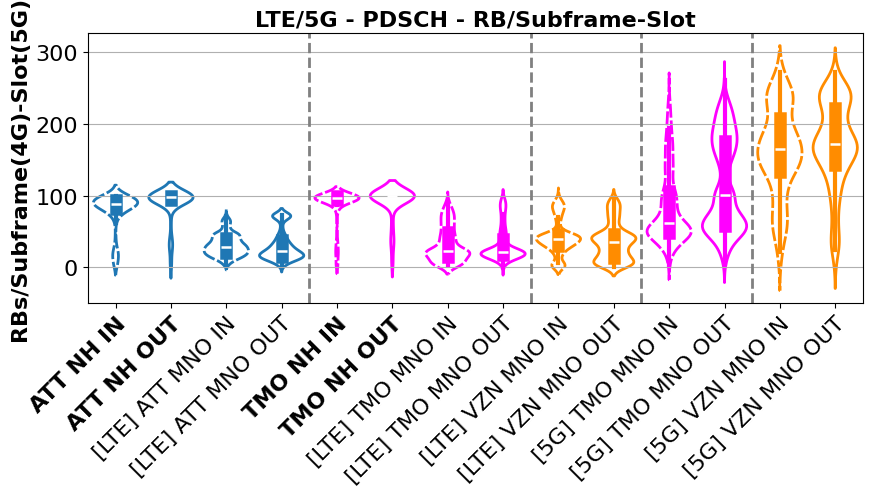

In [44]:
# LTE/5G - PDSCH - RB/Subframe-Slot
fig, ax = plt.subplots(figsize=(10, 3.5))
palette = ['tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'magenta', 'magenta', 'magenta', 'magenta', 'darkorange', 'darkorange', 'magenta', 'magenta', 'darkorange', 'darkorange']
data = pd.concat([
    df_lte_pdsch_att_nh_in.assign(Collection_plot='ATT NH IN'),
    df_lte_pdsch_att_nh_out.assign(Collection_plot='ATT NH OUT'),
    df_lte_pdsch_att_mno_in.assign(Collection_plot='[LTE] ATT MNO IN'),
    df_lte_pdsch_att_mno_out.assign(Collection_plot='[LTE] ATT MNO OUT'),
    df_lte_pdsch_tmo_nh_in.assign(Collection_plot='TMO NH IN'),
    df_lte_pdsch_tmo_nh_out.assign(Collection_plot='TMO NH OUT'),
    df_lte_pdsch_tmo_mno_in.assign(Collection_plot='[LTE] TMO MNO IN'),
    df_lte_pdsch_tmo_mno_out.assign(Collection_plot='[LTE] TMO MNO OUT'),
    df_lte_pdsch_vzn_mno_in.assign(Collection_plot='[LTE] VZN MNO IN'),
    df_lte_pdsch_vzn_mno_out.assign(Collection_plot='[LTE] VZN MNO OUT'),
    df_5g_pdsch_tmo_mno_in.assign(Collection_plot='[5G] TMO MNO IN'),
    df_5g_pdsch_tmo_mno_out.assign(Collection_plot='[5G] TMO MNO OUT'),
    df_5g_pdsch_vzn_mno_in.assign(Collection_plot='[5G] VZN MNO IN'),
    df_5g_pdsch_vzn_mno_out.assign(Collection_plot='[5G] VZN MNO OUT')
])
sns.violinplot(data=data, x='Collection_plot', y='RB per Subframe-Slot', hue='Collection_plot', palette=palette, fill=False, linewidth=2, ax=ax)
for i in range(0, 14, 2):
    ax.collections[i].set_linestyle((0,(5,1))) # for densly dashed lines
plt.axvline(x=3.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=7.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=9.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=11.5, color='gray', linestyle='--', linewidth=2)
plt.xticks(rotation=45, ha='right')
dx = 10 / 72
dy = 0 / 72
offset = ScaledTranslation(dx, dy, fig.dpi_scale_trans)
for label in ax.xaxis.get_majorticklabels():
    label.set_transform(label.get_transform() + offset)
labels = plt.gca().get_xticklabels()
for label in labels:
    if label.get_text() in ['ATT NH IN', 'ATT NH OUT', 'TMO NH IN', 'TMO NH OUT']:
        label.set_fontweight('bold')
plt.xlabel('')
plt.ylabel('RBs/Subframe(4G)-Slot(5G)', fontsize=16, fontweight='bold')
plt.title('LTE/5G - PDSCH - RB/Subframe-Slot', fontsize=16, fontweight='bold')
plt.grid(True, axis='y')
# plt.savefig('figs/josh_dl_tput_all_plot.png', bbox_inches='tight', dpi=300)
# plt.savefig('figs/josh_dl_tput_all_plot.pdf', bbox_inches='tight')
plt.show()
del fig, ax, dx, dy, offset, label, data, labels

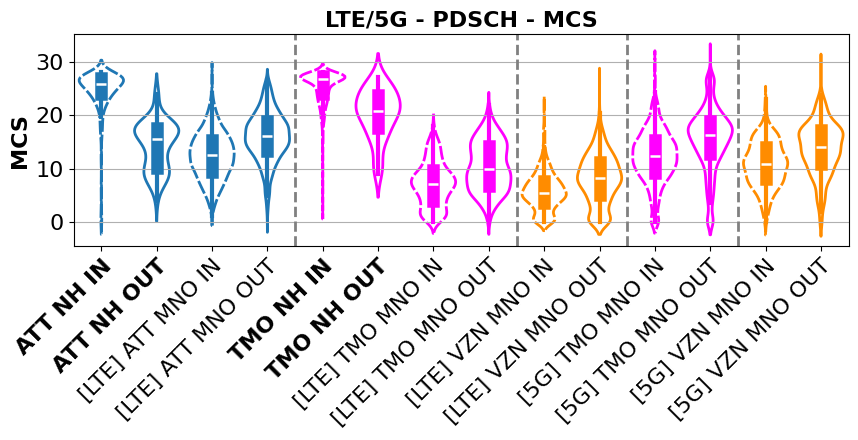

In [45]:
# LTE/5G - PDSCH - MCS
fig, ax = plt.subplots(figsize=(10, 2.75))
palette = ['tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'magenta', 'magenta', 'magenta', 'magenta', 'darkorange', 'darkorange', 'magenta', 'magenta', 'darkorange', 'darkorange']
data = pd.concat([
    df_lte_pdsch_att_nh_in.assign(Collection_plot='ATT NH IN'),
    df_lte_pdsch_att_nh_out.assign(Collection_plot='ATT NH OUT'),
    df_lte_pdsch_att_mno_in.assign(Collection_plot='[LTE] ATT MNO IN'),
    df_lte_pdsch_att_mno_out.assign(Collection_plot='[LTE] ATT MNO OUT'),
    df_lte_pdsch_tmo_nh_in.assign(Collection_plot='TMO NH IN'),
    df_lte_pdsch_tmo_nh_out.assign(Collection_plot='TMO NH OUT'),
    df_lte_pdsch_tmo_mno_in.assign(Collection_plot='[LTE] TMO MNO IN'),
    df_lte_pdsch_tmo_mno_out.assign(Collection_plot='[LTE] TMO MNO OUT'),
    df_lte_pdsch_vzn_mno_in.assign(Collection_plot='[LTE] VZN MNO IN'),
    df_lte_pdsch_vzn_mno_out.assign(Collection_plot='[LTE] VZN MNO OUT'),
    df_5g_pdsch_tmo_mno_in.assign(Collection_plot='[5G] TMO MNO IN'),
    df_5g_pdsch_tmo_mno_out.assign(Collection_plot='[5G] TMO MNO OUT'),
    df_5g_pdsch_vzn_mno_in.assign(Collection_plot='[5G] VZN MNO IN'),
    df_5g_pdsch_vzn_mno_out.assign(Collection_plot='[5G] VZN MNO OUT')
])
sns.violinplot(data=data.dropna(subset=['MCS']), x='Collection_plot', y='MCS', hue='Collection_plot', palette=palette, fill=False, linewidth=2, ax=ax)
for i in range(0, 14, 2):
    ax.collections[i].set_linestyle((0,(5,1))) # for densly dashed lines
plt.axvline(x=3.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=7.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=9.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=11.5, color='gray', linestyle='--', linewidth=2)
plt.xticks(rotation=45, ha='right')
dx = 10 / 72
dy = 0 / 72
offset = ScaledTranslation(dx, dy, fig.dpi_scale_trans)
for label in ax.xaxis.get_majorticklabels():
    label.set_transform(label.get_transform() + offset)
labels = plt.gca().get_xticklabels()
for label in labels:
    if label.get_text() in ['ATT NH IN', 'ATT NH OUT', 'TMO NH IN', 'TMO NH OUT']:
        label.set_fontweight('bold')
plt.xlabel('')
plt.ylabel('MCS', fontsize=16, fontweight='bold')
plt.title('LTE/5G - PDSCH - MCS', fontsize=16, fontweight='bold')
plt.grid(True, axis='y')
# plt.savefig('figs/josh_dl_tput_all_plot.png', bbox_inches='tight', dpi=300)
# plt.savefig('figs/josh_dl_tput_all_plot.pdf', bbox_inches='tight')
plt.show()
del fig, ax, dx, dy, offset, label, data, labels

##### Plots: NH - In vs Out

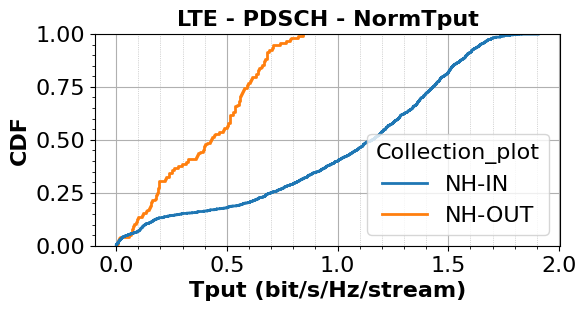

In [46]:
# LTE - PDSCH - NormTput
fig, ax = plt.subplots(figsize=(6, 2.75))
data = pd.concat([
    df_lte_pdsch_att_nh_in.assign(Collection_plot='NH-IN'),
    df_lte_pdsch_att_nh_out.assign(Collection_plot='NH-OUT'),
    df_lte_pdsch_tmo_nh_in.assign(Collection_plot='NH-IN'),
    df_lte_pdsch_tmo_nh_out.assign(Collection_plot='NH-OUT'),
])
sns.ecdfplot(data=data, x='Normalized Throughput', hue='Collection_plot', ax=ax, linewidth=2)
plt.ylabel('CDF', fontsize=16, fontweight='bold')
plt.xlabel('Tput (bit/s/Hz/stream)', fontsize=16, fontweight='bold')
plt.title('LTE - PDSCH - NormTput', fontsize=16, fontweight='bold')
plt.grid(True)
ax.minorticks_on()
ax.xaxis.grid(True, which='minor', linestyle=':', linewidth=0.5)
# plt.savefig('figs/josh_dl_tput_all_plot.png', bbox_inches='tight', dpi=300)
# plt.savefig('figs/josh_dl_tput_all_plot.pdf', bbox_inches='tight')
plt.show()
del fig, ax, data

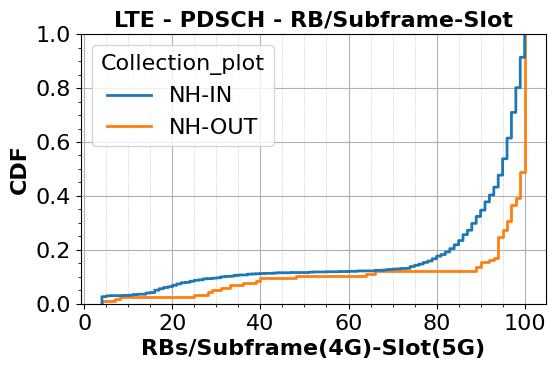

In [47]:
# LTE - PDSCH - RB/Subframe-Slot
fig, ax = plt.subplots(figsize=(6, 3.5))
data = pd.concat([
    df_lte_pdsch_att_nh_in.assign(Collection_plot='NH-IN'),
    df_lte_pdsch_att_nh_out.assign(Collection_plot='NH-OUT'),
    df_lte_pdsch_tmo_nh_in.assign(Collection_plot='NH-IN'),
    df_lte_pdsch_tmo_nh_out.assign(Collection_plot='NH-OUT'),
])
sns.ecdfplot(data=data, x='RB per Subframe-Slot', hue='Collection_plot', ax=ax, linewidth=2)
plt.ylabel('CDF', fontsize=16, fontweight='bold')
plt.xlabel('RBs/Subframe(4G)-Slot(5G)', fontsize=16, fontweight='bold')
plt.title('LTE - PDSCH - RB/Subframe-Slot', fontsize=16, fontweight='bold')
plt.grid(True)
ax.minorticks_on()
ax.xaxis.grid(True, which='minor', linestyle=':', linewidth=0.5)
# plt.savefig('figs/josh_dl_tput_all_plot.png', bbox_inches='tight', dpi=300)
# plt.savefig('figs/josh_dl_tput_all_plot.pdf', bbox_inches='tight')
plt.show()
del fig, ax, data

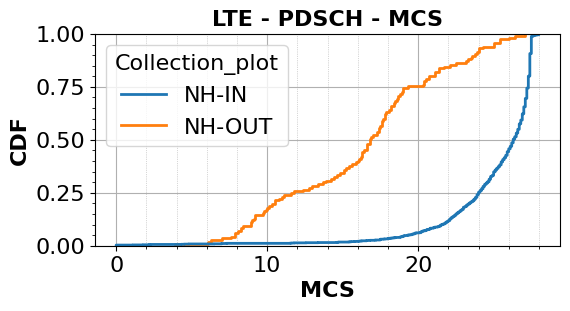

In [48]:
# LTE - PDSCH - MCS
fig, ax = plt.subplots(figsize=(6, 2.75))
data = pd.concat([
    df_lte_pdsch_att_nh_in.assign(Collection_plot='NH-IN'),
    df_lte_pdsch_att_nh_out.assign(Collection_plot='NH-OUT'),
    df_lte_pdsch_tmo_nh_in.assign(Collection_plot='NH-IN'),
    df_lte_pdsch_tmo_nh_out.assign(Collection_plot='NH-OUT'),
])
sns.ecdfplot(data=data, x='MCS', hue='Collection_plot', ax=ax, linewidth=2)
plt.ylabel('CDF', fontsize=16, fontweight='bold')
plt.xlabel('MCS', fontsize=16, fontweight='bold')
plt.title('LTE - PDSCH - MCS', fontsize=16, fontweight='bold')
plt.grid(True)
ax.minorticks_on()
ax.xaxis.grid(True, which='minor', linestyle=':', linewidth=0.5)
# plt.savefig('figs/josh_dl_tput_all_plot.png', bbox_inches='tight', dpi=300)
# plt.savefig('figs/josh_dl_tput_all_plot.pdf', bbox_inches='tight')
plt.show()
del fig, ax, data

##### Plots: Band specific

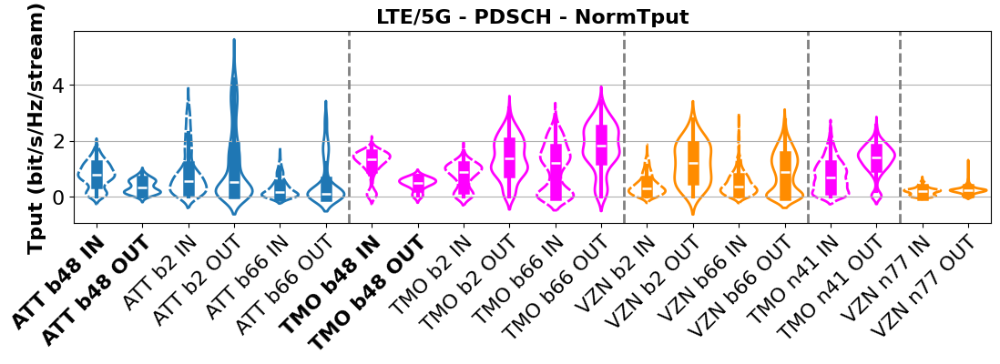

In [49]:
# LTE/5G - PDSCH - NormTput
fig, ax = plt.subplots(figsize=(13, 2.75))
palette = ['tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'magenta', 'magenta', 'magenta', 'magenta', 'magenta', 'magenta', 'darkorange', 'darkorange', 'darkorange', 'darkorange', 'magenta', 'magenta', 'darkorange', 'darkorange']
data = pd.concat([
    df_lte_pdsch_att_nh_in.assign(Collection_plot='ATT b48 IN'),
    df_lte_pdsch_att_nh_out.assign(Collection_plot='ATT b48 OUT'),
    df_lte_pdsch_att_mno_in[df_lte_pdsch_att_mno_in['Band Number']==2].assign(Collection_plot='ATT b2 IN'),
    df_lte_pdsch_att_mno_out[df_lte_pdsch_att_mno_out['Band Number']==2].assign(Collection_plot='ATT b2 OUT'),
    df_lte_pdsch_att_mno_in[df_lte_pdsch_att_mno_in['Band Number']==66].assign(Collection_plot='ATT b66 IN'),
    df_lte_pdsch_att_mno_out[df_lte_pdsch_att_mno_out['Band Number']==66].assign(Collection_plot='ATT b66 OUT'),
    df_lte_pdsch_tmo_nh_in.assign(Collection_plot='TMO b48 IN'),
    df_lte_pdsch_tmo_nh_out.assign(Collection_plot='TMO b48 OUT'),
    df_lte_pdsch_tmo_mno_in[df_lte_pdsch_tmo_mno_in['Band Number']==2].assign(Collection_plot='TMO b2 IN'),
    df_lte_pdsch_tmo_mno_out[df_lte_pdsch_tmo_mno_out['Band Number']==2].assign(Collection_plot='TMO b2 OUT'),
    df_lte_pdsch_tmo_mno_in[df_lte_pdsch_tmo_mno_in['Band Number']==66].assign(Collection_plot='TMO b66 IN'),
    df_lte_pdsch_tmo_mno_out[df_lte_pdsch_tmo_mno_out['Band Number']==66].assign(Collection_plot='TMO b66 OUT'),
    df_lte_pdsch_vzn_mno_in[df_lte_pdsch_vzn_mno_in['Band Number']==2].assign(Collection_plot='VZN b2 IN'),
    df_lte_pdsch_vzn_mno_out[df_lte_pdsch_vzn_mno_out['Band Number']==2].assign(Collection_plot='VZN b2 OUT'),
    df_lte_pdsch_vzn_mno_in[df_lte_pdsch_vzn_mno_in['Band Number']==66].assign(Collection_plot='VZN b66 IN'),
    df_lte_pdsch_vzn_mno_out[df_lte_pdsch_vzn_mno_out['Band Number']==66].assign(Collection_plot='VZN b66 OUT'),
    df_5g_pdsch_tmo_mno_in[df_5g_pdsch_tmo_mno_in['Band Number']==41].assign(Collection_plot='TMO n41 IN'),
    df_5g_pdsch_tmo_mno_out[df_5g_pdsch_tmo_mno_out['Band Number']==41].assign(Collection_plot='TMO n41 OUT'),
    df_5g_pdsch_vzn_mno_in[df_5g_pdsch_vzn_mno_in['Band Number']==77].assign(Collection_plot='VZN n77 IN'),
    df_5g_pdsch_vzn_mno_out[df_5g_pdsch_vzn_mno_out['Band Number']==77].assign(Collection_plot='VZN n77 OUT'),
])
sns.violinplot(data=data, x='Collection_plot', y='Normalized Throughput', hue='Collection_plot', palette=palette, fill=False, linewidth=2, ax=ax)
for i in range(0, 20, 2):
    ax.collections[i].set_linestyle((0,(5,1))) # for densly dashed lines
plt.axvline(x=5.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=11.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=15.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=17.5, color='gray', linestyle='--', linewidth=2)
plt.xticks(rotation=45, ha='right')
dx = 10 / 72
dy = 0 / 72
offset = ScaledTranslation(dx, dy, fig.dpi_scale_trans)
for label in ax.xaxis.get_majorticklabels():
    label.set_transform(label.get_transform() + offset)
labels = plt.gca().get_xticklabels()
for label in labels:
    if label.get_text() in ['ATT b48 IN', 'ATT b48 OUT', 'TMO b48 IN', 'TMO b48 OUT']:
        label.set_fontweight('bold')
plt.xlabel('')
plt.ylabel('Tput (bit/s/Hz/stream)', fontsize=16, fontweight='bold')
plt.title('LTE/5G - PDSCH - NormTput', fontsize=16, fontweight='bold')
plt.grid(True, axis='y')
# plt.savefig('figs/josh_dl_tput_all_plot.png', bbox_inches='tight', dpi=300)
# plt.savefig('figs/josh_dl_tput_all_plot.pdf', bbox_inches='tight')
plt.show()
del fig, ax, dx, dy, offset, label, data, palette, labels

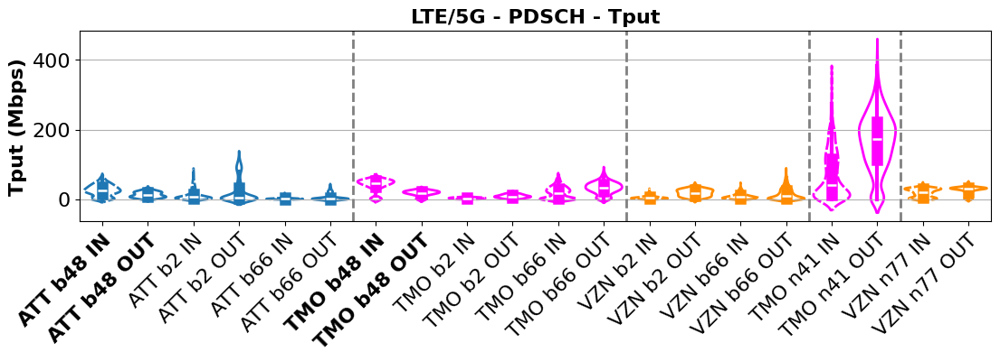

In [50]:
# LTE/5G - PDSCH - Tput
fig, ax = plt.subplots(figsize=(13, 2.75))
palette = ['tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'magenta', 'magenta', 'magenta', 'magenta', 'magenta', 'magenta', 'darkorange', 'darkorange', 'darkorange', 'darkorange', 'magenta', 'magenta', 'darkorange', 'darkorange']
data = pd.concat([
    df_lte_pdsch_att_nh_in.assign(Collection_plot='ATT b48 IN'),
    df_lte_pdsch_att_nh_out.assign(Collection_plot='ATT b48 OUT'),
    df_lte_pdsch_att_mno_in[df_lte_pdsch_att_mno_in['Band Number']==2].assign(Collection_plot='ATT b2 IN'),
    df_lte_pdsch_att_mno_out[df_lte_pdsch_att_mno_out['Band Number']==2].assign(Collection_plot='ATT b2 OUT'),
    df_lte_pdsch_att_mno_in[df_lte_pdsch_att_mno_in['Band Number']==66].assign(Collection_plot='ATT b66 IN'),
    df_lte_pdsch_att_mno_out[df_lte_pdsch_att_mno_out['Band Number']==66].assign(Collection_plot='ATT b66 OUT'),
    df_lte_pdsch_tmo_nh_in.assign(Collection_plot='TMO b48 IN'),
    df_lte_pdsch_tmo_nh_out.assign(Collection_plot='TMO b48 OUT'),
    df_lte_pdsch_tmo_mno_in[df_lte_pdsch_tmo_mno_in['Band Number']==2].assign(Collection_plot='TMO b2 IN'),
    df_lte_pdsch_tmo_mno_out[df_lte_pdsch_tmo_mno_out['Band Number']==2].assign(Collection_plot='TMO b2 OUT'),
    df_lte_pdsch_tmo_mno_in[df_lte_pdsch_tmo_mno_in['Band Number']==66].assign(Collection_plot='TMO b66 IN'),
    df_lte_pdsch_tmo_mno_out[df_lte_pdsch_tmo_mno_out['Band Number']==66].assign(Collection_plot='TMO b66 OUT'),
    df_lte_pdsch_vzn_mno_in[df_lte_pdsch_vzn_mno_in['Band Number']==2].assign(Collection_plot='VZN b2 IN'),
    df_lte_pdsch_vzn_mno_out[df_lte_pdsch_vzn_mno_out['Band Number']==2].assign(Collection_plot='VZN b2 OUT'),
    df_lte_pdsch_vzn_mno_in[df_lte_pdsch_vzn_mno_in['Band Number']==66].assign(Collection_plot='VZN b66 IN'),
    df_lte_pdsch_vzn_mno_out[df_lte_pdsch_vzn_mno_out['Band Number']==66].assign(Collection_plot='VZN b66 OUT'),
    df_5g_pdsch_tmo_mno_in[df_5g_pdsch_tmo_mno_in['Band Number']==41].assign(Collection_plot='TMO n41 IN'),
    df_5g_pdsch_tmo_mno_out[df_5g_pdsch_tmo_mno_out['Band Number']==41].assign(Collection_plot='TMO n41 OUT'),
    df_5g_pdsch_vzn_mno_in[df_5g_pdsch_vzn_mno_in['Band Number']==77].assign(Collection_plot='VZN n77 IN'),
    df_5g_pdsch_vzn_mno_out[df_5g_pdsch_vzn_mno_out['Band Number']==77].assign(Collection_plot='VZN n77 OUT'),
])
sns.violinplot(data=data, x='Collection_plot', y='Net PDSCH Throughput', hue='Collection_plot', palette=palette, fill=False, linewidth=2, ax=ax)
for i in range(0, 20, 2):
    ax.collections[i].set_linestyle((0,(5,1))) # for densly dashed lines
plt.axvline(x=5.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=11.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=15.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=17.5, color='gray', linestyle='--', linewidth=2)
plt.xticks(rotation=45, ha='right')
dx = 10 / 72
dy = 0 / 72
offset = ScaledTranslation(dx, dy, fig.dpi_scale_trans)
for label in ax.xaxis.get_majorticklabels():
    label.set_transform(label.get_transform() + offset)
labels = plt.gca().get_xticklabels()
for label in labels:
    if label.get_text() in ['ATT b48 IN', 'ATT b48 OUT', 'TMO b48 IN', 'TMO b48 OUT']:
        label.set_fontweight('bold')
plt.xlabel('')
plt.ylabel('Tput (Mbps)', fontsize=16, fontweight='bold')
plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{int(y/1e3)}'))
plt.title('LTE/5G - PDSCH - Tput', fontsize=16, fontweight='bold')
plt.grid(True, axis='y')
# plt.savefig('figs/josh_dl_tput_all_plot.png', bbox_inches='tight', dpi=300)
# plt.savefig('figs/josh_dl_tput_all_plot.pdf', bbox_inches='tight')
plt.show()
del fig, ax, dx, dy, offset, label, data, palette, labels

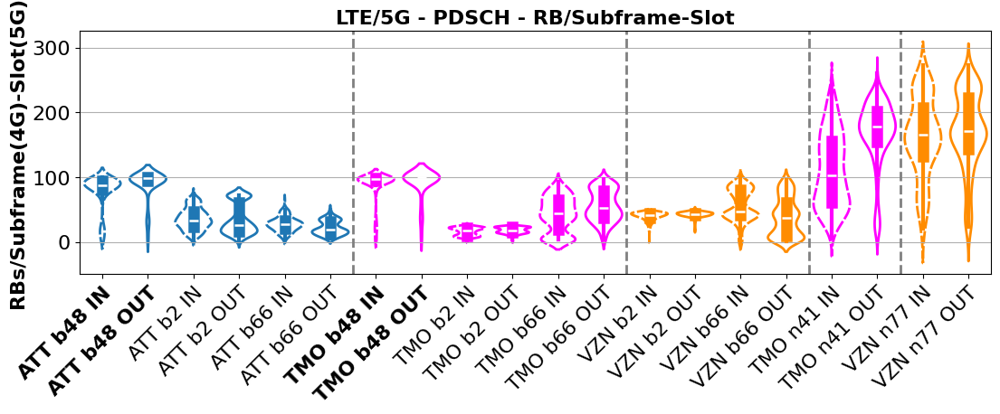

In [51]:
# LTE/5G - PDSCH - RB/Subframe-Slot
fig, ax = plt.subplots(figsize=(13, 3.5))
palette = ['tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'magenta', 'magenta', 'magenta', 'magenta', 'magenta', 'magenta', 'darkorange', 'darkorange', 'darkorange', 'darkorange', 'magenta', 'magenta', 'darkorange', 'darkorange']
data = pd.concat([
    df_lte_pdsch_att_nh_in.assign(Collection_plot='ATT b48 IN'),
    df_lte_pdsch_att_nh_out.assign(Collection_plot='ATT b48 OUT'),
    df_lte_pdsch_att_mno_in[df_lte_pdsch_att_mno_in['Band Number']==2].assign(Collection_plot='ATT b2 IN'),
    df_lte_pdsch_att_mno_out[df_lte_pdsch_att_mno_out['Band Number']==2].assign(Collection_plot='ATT b2 OUT'),
    df_lte_pdsch_att_mno_in[df_lte_pdsch_att_mno_in['Band Number']==66].assign(Collection_plot='ATT b66 IN'),
    df_lte_pdsch_att_mno_out[df_lte_pdsch_att_mno_out['Band Number']==66].assign(Collection_plot='ATT b66 OUT'),
    df_lte_pdsch_tmo_nh_in.assign(Collection_plot='TMO b48 IN'),
    df_lte_pdsch_tmo_nh_out.assign(Collection_plot='TMO b48 OUT'),
    df_lte_pdsch_tmo_mno_in[df_lte_pdsch_tmo_mno_in['Band Number']==2].assign(Collection_plot='TMO b2 IN'),
    df_lte_pdsch_tmo_mno_out[df_lte_pdsch_tmo_mno_out['Band Number']==2].assign(Collection_plot='TMO b2 OUT'),
    df_lte_pdsch_tmo_mno_in[df_lte_pdsch_tmo_mno_in['Band Number']==66].assign(Collection_plot='TMO b66 IN'),
    df_lte_pdsch_tmo_mno_out[df_lte_pdsch_tmo_mno_out['Band Number']==66].assign(Collection_plot='TMO b66 OUT'),
    df_lte_pdsch_vzn_mno_in[df_lte_pdsch_vzn_mno_in['Band Number']==2].assign(Collection_plot='VZN b2 IN'),
    df_lte_pdsch_vzn_mno_out[df_lte_pdsch_vzn_mno_out['Band Number']==2].assign(Collection_plot='VZN b2 OUT'),
    df_lte_pdsch_vzn_mno_in[df_lte_pdsch_vzn_mno_in['Band Number']==66].assign(Collection_plot='VZN b66 IN'),
    df_lte_pdsch_vzn_mno_out[df_lte_pdsch_vzn_mno_out['Band Number']==66].assign(Collection_plot='VZN b66 OUT'),
    df_5g_pdsch_tmo_mno_in[df_5g_pdsch_tmo_mno_in['Band Number']==41].assign(Collection_plot='TMO n41 IN'),
    df_5g_pdsch_tmo_mno_out[df_5g_pdsch_tmo_mno_out['Band Number']==41].assign(Collection_plot='TMO n41 OUT'),
    df_5g_pdsch_vzn_mno_in[df_5g_pdsch_vzn_mno_in['Band Number']==77].assign(Collection_plot='VZN n77 IN'),
    df_5g_pdsch_vzn_mno_out[df_5g_pdsch_vzn_mno_out['Band Number']==77].assign(Collection_plot='VZN n77 OUT'),
])
sns.violinplot(data=data, x='Collection_plot', y='RB per Subframe-Slot', hue='Collection_plot', palette=palette, fill=False, linewidth=2, ax=ax)
for i in range(0, 20, 2):
    ax.collections[i].set_linestyle((0,(5,1))) # for densly dashed lines
plt.axvline(x=5.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=11.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=15.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=17.5, color='gray', linestyle='--', linewidth=2)
plt.xticks(rotation=45, ha='right')
dx = 10 / 72
dy = 0 / 72
offset = ScaledTranslation(dx, dy, fig.dpi_scale_trans)
for label in ax.xaxis.get_majorticklabels():
    label.set_transform(label.get_transform() + offset)
labels = plt.gca().get_xticklabels()
for label in labels:
    if label.get_text() in ['ATT b48 IN', 'ATT b48 OUT', 'TMO b48 IN', 'TMO b48 OUT']:
        label.set_fontweight('bold')
plt.xlabel('')
plt.ylabel('RBs/Subframe(4G)-Slot(5G)', fontsize=16, fontweight='bold')
plt.title('LTE/5G - PDSCH - RB/Subframe-Slot', fontsize=16, fontweight='bold')
plt.grid(True, axis='y')
# plt.savefig('figs/josh_dl_tput_all_plot.png', bbox_inches='tight', dpi=300)
# plt.savefig('figs/josh_dl_tput_all_plot.pdf', bbox_inches='tight')
plt.show()
del fig, ax, dx, dy, offset, label, data, palette, labels

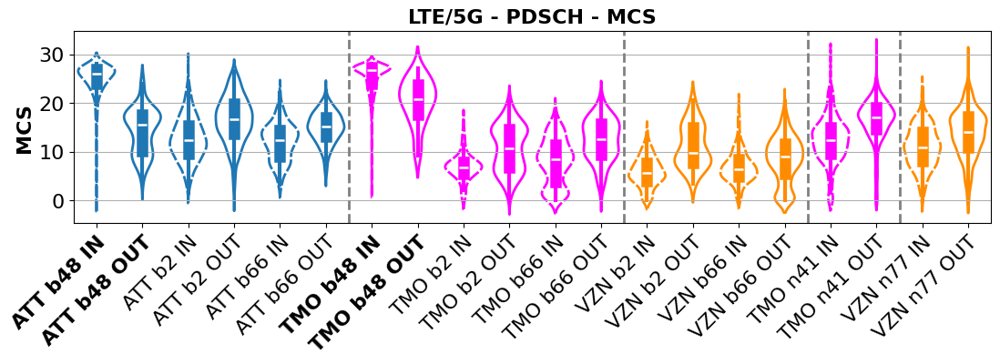

In [52]:
# LTE/5G - PDSCH - MCS
fig, ax = plt.subplots(figsize=(13, 2.75))
palette = ['tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'magenta', 'magenta', 'magenta', 'magenta', 'magenta', 'magenta', 'darkorange', 'darkorange', 'darkorange', 'darkorange', 'magenta', 'magenta', 'darkorange', 'darkorange']
data = pd.concat([
    df_lte_pdsch_att_nh_in.assign(Collection_plot='ATT b48 IN'),
    df_lte_pdsch_att_nh_out.assign(Collection_plot='ATT b48 OUT'),
    df_lte_pdsch_att_mno_in[df_lte_pdsch_att_mno_in['Band Number']==2].assign(Collection_plot='ATT b2 IN'),
    df_lte_pdsch_att_mno_out[df_lte_pdsch_att_mno_out['Band Number']==2].assign(Collection_plot='ATT b2 OUT'),
    df_lte_pdsch_att_mno_in[df_lte_pdsch_att_mno_in['Band Number']==66].assign(Collection_plot='ATT b66 IN'),
    df_lte_pdsch_att_mno_out[df_lte_pdsch_att_mno_out['Band Number']==66].assign(Collection_plot='ATT b66 OUT'),
    df_lte_pdsch_tmo_nh_in.assign(Collection_plot='TMO b48 IN'),
    df_lte_pdsch_tmo_nh_out.assign(Collection_plot='TMO b48 OUT'),
    df_lte_pdsch_tmo_mno_in[df_lte_pdsch_tmo_mno_in['Band Number']==2].assign(Collection_plot='TMO b2 IN'),
    df_lte_pdsch_tmo_mno_out[df_lte_pdsch_tmo_mno_out['Band Number']==2].assign(Collection_plot='TMO b2 OUT'),
    df_lte_pdsch_tmo_mno_in[df_lte_pdsch_tmo_mno_in['Band Number']==66].assign(Collection_plot='TMO b66 IN'),
    df_lte_pdsch_tmo_mno_out[df_lte_pdsch_tmo_mno_out['Band Number']==66].assign(Collection_plot='TMO b66 OUT'),
    df_lte_pdsch_vzn_mno_in[df_lte_pdsch_vzn_mno_in['Band Number']==2].assign(Collection_plot='VZN b2 IN'),
    df_lte_pdsch_vzn_mno_out[df_lte_pdsch_vzn_mno_out['Band Number']==2].assign(Collection_plot='VZN b2 OUT'),
    df_lte_pdsch_vzn_mno_in[df_lte_pdsch_vzn_mno_in['Band Number']==66].assign(Collection_plot='VZN b66 IN'),
    df_lte_pdsch_vzn_mno_out[df_lte_pdsch_vzn_mno_out['Band Number']==66].assign(Collection_plot='VZN b66 OUT'),
    df_5g_pdsch_tmo_mno_in[df_5g_pdsch_tmo_mno_in['Band Number']==41].assign(Collection_plot='TMO n41 IN'),
    df_5g_pdsch_tmo_mno_out[df_5g_pdsch_tmo_mno_out['Band Number']==41].assign(Collection_plot='TMO n41 OUT'),
    df_5g_pdsch_vzn_mno_in[df_5g_pdsch_vzn_mno_in['Band Number']==77].assign(Collection_plot='VZN n77 IN'),
    df_5g_pdsch_vzn_mno_out[df_5g_pdsch_vzn_mno_out['Band Number']==77].assign(Collection_plot='VZN n77 OUT'),
])
sns.violinplot(data=data.dropna(subset='MCS'), x='Collection_plot', y='MCS', hue='Collection_plot', palette=palette, fill=False, linewidth=2, ax=ax)
for i in range(0, 20, 2):
    ax.collections[i].set_linestyle((0,(5,1))) # for densly dashed lines
plt.axvline(x=5.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=11.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=15.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=17.5, color='gray', linestyle='--', linewidth=2)
plt.xticks(rotation=45, ha='right')
dx = 10 / 72
dy = 0 / 72
offset = ScaledTranslation(dx, dy, fig.dpi_scale_trans)
for label in ax.xaxis.get_majorticklabels():
    label.set_transform(label.get_transform() + offset)
labels = plt.gca().get_xticklabels()
for label in labels:
    if label.get_text() in ['ATT b48 IN', 'ATT b48 OUT', 'TMO b48 IN', 'TMO b48 OUT']:
        label.set_fontweight('bold')
plt.xlabel('')
plt.ylabel('MCS', fontsize=16, fontweight='bold')
plt.title('LTE/5G - PDSCH - MCS', fontsize=16, fontweight='bold')
plt.grid(True, axis='y')
# plt.savefig('figs/josh_dl_tput_all_plot.png', bbox_inches='tight', dpi=300)
# plt.savefig('figs/josh_dl_tput_all_plot.pdf', bbox_inches='tight')
plt.show()
del fig, ax, dx, dy, offset, label, data, palette, labels

##### print(): PCI statistics

Summary of Representative PCIs:

NH IN - AP 1 - PCI 4,7

NH OUT - AP 6 - PCI 8,15

ATT b2,66 - PCI 77

TMO b2 - PCI 231

TMO b66 - PCI 294

VZN b2,66 - PCI 357

TMO n41 - PCI 681

VZN n77 - PCI 357

In [53]:
print('LTE ATT NH IN')
print(df_lte_pdsch_att_nh_in[['Band Number', 'PCI']].value_counts().sort_index())
print('LTE ATT NH OUT')
print(df_lte_pdsch_att_nh_out[['Band Number', 'PCI']].value_counts().sort_index())
print('LTE ATT MNO IN')
print(df_lte_pdsch_att_mno_in[['Band Number', 'PCI']].value_counts().sort_index())
print('LTE ATT MNO OUT')
print(df_lte_pdsch_att_mno_out[['Band Number', 'PCI']].value_counts().sort_index())

LTE ATT NH IN
Band Number  PCI 
48.0         4.0     67
             5.0     34
             7.0     57
             8.0     43
             9.0     17
             13.0    89
             15.0    38
             16.0    78
             20.0    23
             21.0    17
             23.0    44
             25.0    22
Name: count, dtype: int64
LTE ATT NH OUT
Band Number  PCI
48.0         4.0    34
             7.0    44
Name: count, dtype: int64
LTE ATT MNO IN
Band Number  PCI  
2.0          77.0     517
             80.0      43
             422.0    162
             430.0    403
12.0         77.0     289
             81.0      68
             422.0     10
14.0         77.0      43
             80.0      38
             81.0      67
             422.0     15
30.0         77.0     382
             422.0      2
66.0         77.0     138
             80.0       8
             422.0     14
Name: count, dtype: int64
LTE ATT MNO OUT
Band Number  PCI  
2.0          77.0     505
             

In [54]:
print('LTE TMO NH IN')
print(df_lte_pdsch_tmo_nh_in[['Band Number', 'PCI']].value_counts().sort_index())
print('LTE TMO NH OUT')
print(df_lte_pdsch_tmo_nh_out[['Band Number', 'PCI']].value_counts().sort_index())
print('LTE TMO MNO IN')
print(df_lte_pdsch_tmo_mno_in[['Band Number', 'PCI']].value_counts().sort_index())
print('LTE TMO MNO OUT')
print(df_lte_pdsch_tmo_mno_out[['Band Number', 'PCI']].value_counts().sort_index())

LTE TMO NH IN
Band Number  PCI 
48.0         4.0     155
             5.0      88
             7.0     122
             8.0      44
             9.0      21
             13.0     93
             15.0     40
             16.0     70
             20.0     18
             21.0     17
             23.0    113
             25.0     21
Name: count, dtype: int64
LTE TMO NH OUT
Band Number  PCI
48.0         4.0    22
             7.0    17
Name: count, dtype: int64
LTE TMO MNO IN
Band Number  PCI  
2.0          231.0    147
             462.0     70
12.0         252.0    114
             306.0     68
66.0         294.0    263
             330.0    275
Name: count, dtype: int64
LTE TMO MNO OUT
Band Number  PCI  
2.0          231.0    141
             462.0    194
             494.0      9
12.0         252.0    133
             306.0    192
66.0         294.0    209
             311.0     10
             330.0    150
Name: count, dtype: int64


In [55]:
print('LTE VZN MNO IN')
print(df_lte_pdsch_vzn_mno_in[['Band Number', 'PCI']].value_counts().sort_index())
print('LTE VZN MNO OUT')
print(df_lte_pdsch_vzn_mno_out[['Band Number', 'PCI']].value_counts().sort_index())

LTE VZN MNO IN
Band Number  PCI  
2.0          155.0     11
             357.0    332
5.0          357.0    222
13.0         125.0    140
             155.0     23
             357.0    176
66.0         125.0     24
             155.0      9
             357.0    692
Name: count, dtype: int64
LTE VZN MNO OUT
Band Number  PCI  
2.0          357.0     58
13.0         125.0    207
             357.0     59
66.0         125.0    375
             357.0    324
Name: count, dtype: int64


In [56]:
print('5G TMO MNO IN')
print(df_5g_pdsch_tmo_mno_in[['Band Number', 'PCI']].value_counts().sort_index())
print('5G TMO MNO OUT')
print(df_5g_pdsch_tmo_mno_out[['Band Number', 'PCI']].value_counts().sort_index())
print('5G VZN MNO IN')
print(df_5g_pdsch_vzn_mno_in[['Band Number', 'PCI']].value_counts().sort_index())
print('5G VZN MNO OUT')
print(df_5g_pdsch_vzn_mno_out[['Band Number', 'PCI']].value_counts().sort_index())

5G TMO MNO IN
Band Number  PCI  
25.0         447.0      69
             585.0     936
41.0         681.0    1359
71.0         24.0      236
Name: count, dtype: int64
5G TMO MNO OUT
Band Number  PCI  
25.0         447.0     162
             585.0     883
41.0         681.0    1372
71.0         24.0      445
Name: count, dtype: int64
5G VZN MNO IN
Band Number  PCI  
77.0         357.0    460
Name: count, dtype: int64
5G VZN MNO OUT
Band Number  PCI  
77.0         357.0    631
Name: count, dtype: int64


##### Plots: PCI specific

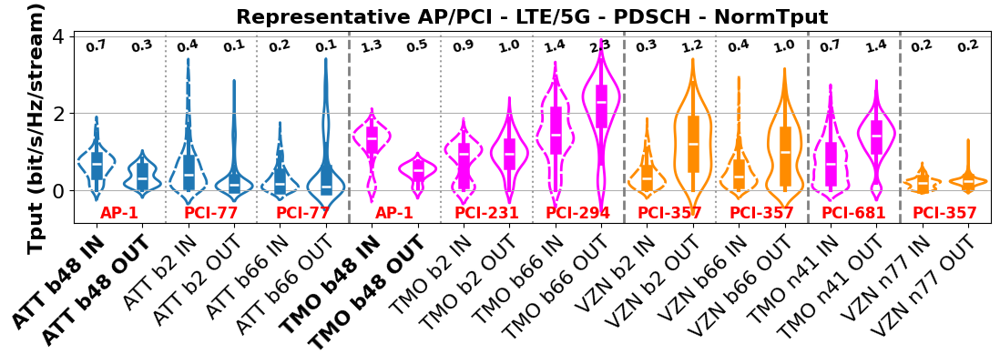

In [57]:
# LTE/5G - PDSCH - NormTput
fig, ax = plt.subplots(figsize=(13, 2.75))
palette = ['tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'magenta', 'magenta', 'magenta', 'magenta', 'magenta', 'magenta', 'darkorange', 'darkorange', 'darkorange', 'darkorange', 'magenta', 'magenta', 'darkorange', 'darkorange']
data = pd.concat([
    df_lte_pdsch_att_nh_in[df_lte_pdsch_att_nh_in['PCI'].isin([4, 7])].assign(Collection_plot='ATT b48 IN'),
    df_lte_pdsch_att_nh_out[df_lte_pdsch_att_nh_out['PCI'].isin([4, 7])].assign(Collection_plot='ATT b48 OUT'),
    df_lte_pdsch_att_mno_in[(df_lte_pdsch_att_mno_in['Band Number'] == 2) & (df_lte_pdsch_att_mno_in['PCI'] == 77)].assign(Collection_plot='ATT b2 IN'),
    df_lte_pdsch_att_mno_out[(df_lte_pdsch_att_mno_out['Band Number'] == 2) & (df_lte_pdsch_att_mno_out['PCI'] == 77)].assign(Collection_plot='ATT b2 OUT'),
    df_lte_pdsch_att_mno_in[(df_lte_pdsch_att_mno_in['Band Number'] == 66) & (df_lte_pdsch_att_mno_in['PCI'] == 77)].assign(Collection_plot='ATT b66 IN'),
    df_lte_pdsch_att_mno_out[(df_lte_pdsch_att_mno_out['Band Number'] == 66) & (df_lte_pdsch_att_mno_out['PCI'] == 77)].assign(Collection_plot='ATT b66 OUT'),
    df_lte_pdsch_tmo_nh_in[df_lte_pdsch_tmo_nh_in['PCI'].isin([4, 7])].assign(Collection_plot='TMO b48 IN'),
    df_lte_pdsch_tmo_nh_out[df_lte_pdsch_tmo_nh_out['PCI'].isin([4, 7])].assign(Collection_plot='TMO b48 OUT'),
    df_lte_pdsch_tmo_mno_in[(df_lte_pdsch_tmo_mno_in['Band Number']==2) & (df_lte_pdsch_tmo_mno_in['PCI'] == 231)].assign(Collection_plot='TMO b2 IN'),
    df_lte_pdsch_tmo_mno_out[(df_lte_pdsch_tmo_mno_out['Band Number']==2) & (df_lte_pdsch_tmo_mno_out['PCI'] == 231)].assign(Collection_plot='TMO b2 OUT'),
    df_lte_pdsch_tmo_mno_in[(df_lte_pdsch_tmo_mno_in['Band Number']==66) & (df_lte_pdsch_tmo_mno_in['PCI'] == 294)].assign(Collection_plot='TMO b66 IN'),
    df_lte_pdsch_tmo_mno_out[(df_lte_pdsch_tmo_mno_out['Band Number']==66) & (df_lte_pdsch_tmo_mno_out['PCI'] == 294)].assign(Collection_plot='TMO b66 OUT'),
    df_lte_pdsch_vzn_mno_in[(df_lte_pdsch_vzn_mno_in['Band Number'] == 2) & (df_lte_pdsch_vzn_mno_in['PCI'] == 357)].assign(Collection_plot='VZN b2 IN'),
    df_lte_pdsch_vzn_mno_out[(df_lte_pdsch_vzn_mno_out['Band Number'] == 2) & (df_lte_pdsch_vzn_mno_out['PCI'] == 357)].assign(Collection_plot='VZN b2 OUT'),
    df_lte_pdsch_vzn_mno_in[(df_lte_pdsch_vzn_mno_in['Band Number'] == 66) & (df_lte_pdsch_vzn_mno_in['PCI'] == 357)].assign(Collection_plot='VZN b66 IN'),
    df_lte_pdsch_vzn_mno_out[(df_lte_pdsch_vzn_mno_out['Band Number'] == 66) & (df_lte_pdsch_vzn_mno_out['PCI'] == 357)].assign(Collection_plot='VZN b66 OUT'),
    df_5g_pdsch_tmo_mno_in[(df_5g_pdsch_tmo_mno_in['Band Number']==41) & (df_5g_pdsch_tmo_mno_in['PCI']==681)].rename(columns={'SS-RSRP': 'RSRP'}).assign(Collection_plot='TMO n41 IN'),
    df_5g_pdsch_tmo_mno_out[(df_5g_pdsch_tmo_mno_out['Band Number']==41) & (df_5g_pdsch_tmo_mno_out['PCI']==681)].rename(columns={'SS-RSRP': 'RSRP'}).assign(Collection_plot='TMO n41 OUT'),
    df_5g_pdsch_vzn_mno_in[(df_5g_pdsch_vzn_mno_in['Band Number']==77) & (df_5g_pdsch_vzn_mno_in['PCI']==357)].rename(columns={'SS-RSRP': 'RSRP'}).assign(Collection_plot='VZN n77 IN'),
    df_5g_pdsch_vzn_mno_out[(df_5g_pdsch_vzn_mno_out['Band Number']==77) & (df_5g_pdsch_vzn_mno_out['PCI']==357)].rename(columns={'SS-RSRP': 'RSRP'}).assign(Collection_plot='VZN n77 OUT')
])
sns.violinplot(data=data, x='Collection_plot', y='Normalized Throughput', hue='Collection_plot', palette=palette, fill=False, linewidth=2, ax=ax)
for i in range(0, 20, 2):
    ax.collections[i].set_linestyle((0,(5,1))) # for densly dashed lines
plt.axvline(x=5.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=11.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=15.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=17.5, color='gray', linestyle='--', linewidth=2)

plt.axvline(x=1.5, color='gray', linestyle=':', linewidth=1.5, alpha=0.75)
plt.axvline(x=3.5, color='gray', linestyle=':', linewidth=1.5, alpha=0.75)
plt.axvline(x=7.5, color='gray', linestyle=':', linewidth=1.5, alpha=0.75)
plt.axvline(x=9.5, color='gray', linestyle=':', linewidth=1.5, alpha=0.75)
plt.axvline(x=13.5, color='gray', linestyle=':', linewidth=1.5, alpha=0.75)
ax.text(0.05, 0.05, 'AP-1', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(0.15, 0.05, 'PCI-77', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(0.25, 0.05, 'PCI-77', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(0.35, 0.05, 'AP-1', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(0.45, 0.05, 'PCI-231', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(0.55, 0.05, 'PCI-294', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(0.65, 0.05, 'PCI-357', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(0.75, 0.05, 'PCI-357', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(0.85, 0.05, 'PCI-681', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(0.95, 0.05, 'PCI-357', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
medians = data.groupby('Collection_plot')['Normalized Throughput'].median()
for i, collection in enumerate(data['Collection_plot'].unique()):
    median_value = medians[collection]
    ax.text(i, 3.6, f'{median_value:.1f}', horizontalalignment='center', color='black', fontsize=10, fontweight='bold', rotation=15)

plt.xticks(rotation=45, ha='right')
dx = 10 / 72
dy = 0 / 72
offset = ScaledTranslation(dx, dy, fig.dpi_scale_trans)
for label in ax.xaxis.get_majorticklabels():
    label.set_transform(label.get_transform() + offset)
labels = plt.gca().get_xticklabels()
for label in labels:
    if label.get_text() in ['ATT b48 IN', 'ATT b48 OUT', 'TMO b48 IN', 'TMO b48 OUT']:
        label.set_fontweight('bold')
plt.xlabel('')
plt.ylabel('Tput (bit/s/Hz/stream)', fontsize=16, fontweight='bold')
plt.title('Representative AP/PCI - LTE/5G - PDSCH - NormTput', fontsize=16, fontweight='bold')
plt.grid(True, axis='y')
# plt.savefig('figs/josh_dl_tput_all_plot.png', bbox_inches='tight', dpi=300)
# plt.savefig('figs/josh_dl_tput_all_plot.pdf', bbox_inches='tight')
plt.show()
del fig, ax, dx, dy, offset, label, data, palette, labels

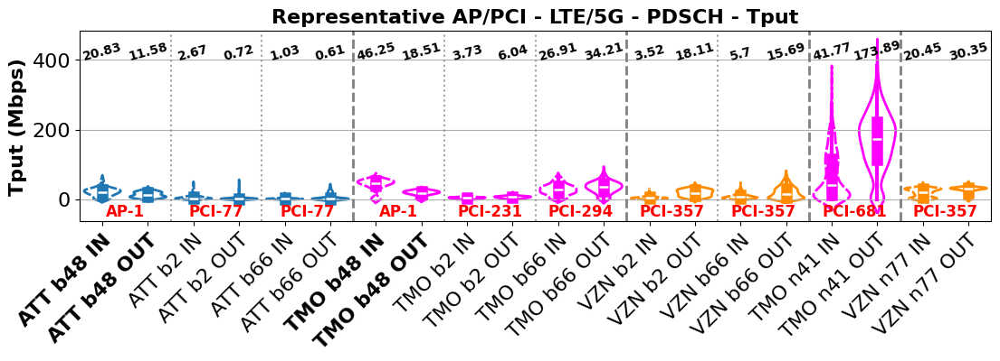

In [58]:
# LTE/5G - PDSCH - Tput
fig, ax = plt.subplots(figsize=(13, 2.75))
palette = ['tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'magenta', 'magenta', 'magenta', 'magenta', 'magenta', 'magenta', 'darkorange', 'darkorange', 'darkorange', 'darkorange', 'magenta', 'magenta', 'darkorange', 'darkorange']
data = pd.concat([
    df_lte_pdsch_att_nh_in[df_lte_pdsch_att_nh_in['PCI'].isin([4, 7])].assign(Collection_plot='ATT b48 IN'),
    df_lte_pdsch_att_nh_out[df_lte_pdsch_att_nh_out['PCI'].isin([4, 7])].assign(Collection_plot='ATT b48 OUT'),
    df_lte_pdsch_att_mno_in[(df_lte_pdsch_att_mno_in['Band Number'] == 2) & (df_lte_pdsch_att_mno_in['PCI'] == 77)].assign(Collection_plot='ATT b2 IN'),
    df_lte_pdsch_att_mno_out[(df_lte_pdsch_att_mno_out['Band Number'] == 2) & (df_lte_pdsch_att_mno_out['PCI'] == 77)].assign(Collection_plot='ATT b2 OUT'),
    df_lte_pdsch_att_mno_in[(df_lte_pdsch_att_mno_in['Band Number'] == 66) & (df_lte_pdsch_att_mno_in['PCI'] == 77)].assign(Collection_plot='ATT b66 IN'),
    df_lte_pdsch_att_mno_out[(df_lte_pdsch_att_mno_out['Band Number'] == 66) & (df_lte_pdsch_att_mno_out['PCI'] == 77)].assign(Collection_plot='ATT b66 OUT'),
    df_lte_pdsch_tmo_nh_in[df_lte_pdsch_tmo_nh_in['PCI'].isin([4, 7])].assign(Collection_plot='TMO b48 IN'),
    df_lte_pdsch_tmo_nh_out[df_lte_pdsch_tmo_nh_out['PCI'].isin([4, 7])].assign(Collection_plot='TMO b48 OUT'),
    df_lte_pdsch_tmo_mno_in[(df_lte_pdsch_tmo_mno_in['Band Number']==2) & (df_lte_pdsch_tmo_mno_in['PCI'] == 231)].assign(Collection_plot='TMO b2 IN'),
    df_lte_pdsch_tmo_mno_out[(df_lte_pdsch_tmo_mno_out['Band Number']==2) & (df_lte_pdsch_tmo_mno_out['PCI'] == 231)].assign(Collection_plot='TMO b2 OUT'),
    df_lte_pdsch_tmo_mno_in[(df_lte_pdsch_tmo_mno_in['Band Number']==66) & (df_lte_pdsch_tmo_mno_in['PCI'] == 294)].assign(Collection_plot='TMO b66 IN'),
    df_lte_pdsch_tmo_mno_out[(df_lte_pdsch_tmo_mno_out['Band Number']==66) & (df_lte_pdsch_tmo_mno_out['PCI'] == 294)].assign(Collection_plot='TMO b66 OUT'),
    df_lte_pdsch_vzn_mno_in[(df_lte_pdsch_vzn_mno_in['Band Number'] == 2) & (df_lte_pdsch_vzn_mno_in['PCI'] == 357)].assign(Collection_plot='VZN b2 IN'),
    df_lte_pdsch_vzn_mno_out[(df_lte_pdsch_vzn_mno_out['Band Number'] == 2) & (df_lte_pdsch_vzn_mno_out['PCI'] == 357)].assign(Collection_plot='VZN b2 OUT'),
    df_lte_pdsch_vzn_mno_in[(df_lte_pdsch_vzn_mno_in['Band Number'] == 66) & (df_lte_pdsch_vzn_mno_in['PCI'] == 357)].assign(Collection_plot='VZN b66 IN'),
    df_lte_pdsch_vzn_mno_out[(df_lte_pdsch_vzn_mno_out['Band Number'] == 66) & (df_lte_pdsch_vzn_mno_out['PCI'] == 357)].assign(Collection_plot='VZN b66 OUT'),
    df_5g_pdsch_tmo_mno_in[(df_5g_pdsch_tmo_mno_in['Band Number']==41) & (df_5g_pdsch_tmo_mno_in['PCI']==681)].rename(columns={'SS-RSRP': 'RSRP'}).assign(Collection_plot='TMO n41 IN'),
    df_5g_pdsch_tmo_mno_out[(df_5g_pdsch_tmo_mno_out['Band Number']==41) & (df_5g_pdsch_tmo_mno_out['PCI']==681)].rename(columns={'SS-RSRP': 'RSRP'}).assign(Collection_plot='TMO n41 OUT'),
    df_5g_pdsch_vzn_mno_in[(df_5g_pdsch_vzn_mno_in['Band Number']==77) & (df_5g_pdsch_vzn_mno_in['PCI']==357)].rename(columns={'SS-RSRP': 'RSRP'}).assign(Collection_plot='VZN n77 IN'),
    df_5g_pdsch_vzn_mno_out[(df_5g_pdsch_vzn_mno_out['Band Number']==77) & (df_5g_pdsch_vzn_mno_out['PCI']==357)].rename(columns={'SS-RSRP': 'RSRP'}).assign(Collection_plot='VZN n77 OUT')
])
sns.violinplot(data=data, x='Collection_plot', y='Net PDSCH Throughput', hue='Collection_plot', palette=palette, fill=False, linewidth=2, ax=ax)
for i in range(0, 20, 2):
    ax.collections[i].set_linestyle((0,(5,1))) # for densly dashed lines
plt.axvline(x=5.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=11.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=15.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=17.5, color='gray', linestyle='--', linewidth=2)

plt.axvline(x=1.5, color='gray', linestyle=':', linewidth=1.5, alpha=0.75)
plt.axvline(x=3.5, color='gray', linestyle=':', linewidth=1.5, alpha=0.75)
plt.axvline(x=7.5, color='gray', linestyle=':', linewidth=1.5, alpha=0.75)
plt.axvline(x=9.5, color='gray', linestyle=':', linewidth=1.5, alpha=0.75)
plt.axvline(x=13.5, color='gray', linestyle=':', linewidth=1.5, alpha=0.75)
ax.text(0.05, 0.05, 'AP-1', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(0.15, 0.05, 'PCI-77', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(0.25, 0.05, 'PCI-77', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(0.35, 0.05, 'AP-1', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(0.45, 0.05, 'PCI-231', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(0.55, 0.05, 'PCI-294', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(0.65, 0.05, 'PCI-357', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(0.75, 0.05, 'PCI-357', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(0.85, 0.05, 'PCI-681', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(0.95, 0.05, 'PCI-357', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
medians = data.groupby('Collection_plot')['Net PDSCH Throughput'].median()
for i, collection in enumerate(data['Collection_plot'].unique()):
    median_value = medians[collection]
    ax.text(i, 4e5, f'{round(median_value / 1e3, 2)}', horizontalalignment='center', color='black', fontsize=10, fontweight='bold', rotation=15)

plt.xticks(rotation=45, ha='right')
dx = 10 / 72
dy = 0 / 72
offset = ScaledTranslation(dx, dy, fig.dpi_scale_trans)
for label in ax.xaxis.get_majorticklabels():
    label.set_transform(label.get_transform() + offset)
labels = plt.gca().get_xticklabels()
for label in labels:
    if label.get_text() in ['ATT b48 IN', 'ATT b48 OUT', 'TMO b48 IN', 'TMO b48 OUT']:
        label.set_fontweight('bold')
plt.xlabel('')
plt.ylabel('Tput (Mbps)', fontsize=16, fontweight='bold')
plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{int(y/1e3)}'))
plt.title('Representative AP/PCI - LTE/5G - PDSCH - Tput', fontsize=16, fontweight='bold')
plt.grid(True, axis='y')
# plt.savefig('figs/josh_dl_tput_all_plot.png', bbox_inches='tight', dpi=300)
# plt.savefig('figs/josh_dl_tput_all_plot.pdf', bbox_inches='tight')
plt.show()
del fig, ax, dx, dy, offset, label, data, palette, labels

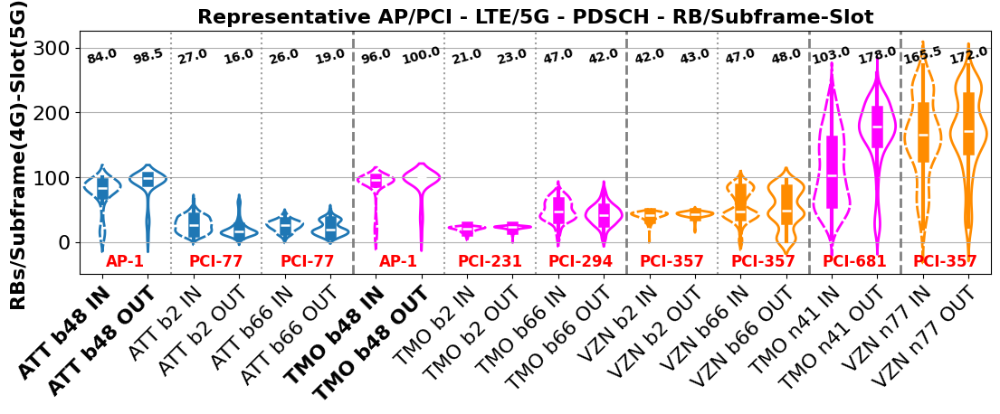

In [59]:
# LTE/5G - PDSCH - RB/Subframe-Slot
fig, ax = plt.subplots(figsize=(13, 3.5))
palette = ['tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'magenta', 'magenta', 'magenta', 'magenta', 'magenta', 'magenta', 'darkorange', 'darkorange', 'darkorange', 'darkorange', 'magenta', 'magenta', 'darkorange', 'darkorange']
data = pd.concat([
    df_lte_pdsch_att_nh_in[df_lte_pdsch_att_nh_in['PCI'].isin([4, 7])].assign(Collection_plot='ATT b48 IN'),
    df_lte_pdsch_att_nh_out[df_lte_pdsch_att_nh_out['PCI'].isin([4, 7])].assign(Collection_plot='ATT b48 OUT'),
    df_lte_pdsch_att_mno_in[(df_lte_pdsch_att_mno_in['Band Number'] == 2) & (df_lte_pdsch_att_mno_in['PCI'] == 77)].assign(Collection_plot='ATT b2 IN'),
    df_lte_pdsch_att_mno_out[(df_lte_pdsch_att_mno_out['Band Number'] == 2) & (df_lte_pdsch_att_mno_out['PCI'] == 77)].assign(Collection_plot='ATT b2 OUT'),
    df_lte_pdsch_att_mno_in[(df_lte_pdsch_att_mno_in['Band Number'] == 66) & (df_lte_pdsch_att_mno_in['PCI'] == 77)].assign(Collection_plot='ATT b66 IN'),
    df_lte_pdsch_att_mno_out[(df_lte_pdsch_att_mno_out['Band Number'] == 66) & (df_lte_pdsch_att_mno_out['PCI'] == 77)].assign(Collection_plot='ATT b66 OUT'),
    df_lte_pdsch_tmo_nh_in[df_lte_pdsch_tmo_nh_in['PCI'].isin([4, 7])].assign(Collection_plot='TMO b48 IN'),
    df_lte_pdsch_tmo_nh_out[df_lte_pdsch_tmo_nh_out['PCI'].isin([4, 7])].assign(Collection_plot='TMO b48 OUT'),
    df_lte_pdsch_tmo_mno_in[(df_lte_pdsch_tmo_mno_in['Band Number']==2) & (df_lte_pdsch_tmo_mno_in['PCI'] == 231)].assign(Collection_plot='TMO b2 IN'),
    df_lte_pdsch_tmo_mno_out[(df_lte_pdsch_tmo_mno_out['Band Number']==2) & (df_lte_pdsch_tmo_mno_out['PCI'] == 231)].assign(Collection_plot='TMO b2 OUT'),
    df_lte_pdsch_tmo_mno_in[(df_lte_pdsch_tmo_mno_in['Band Number']==66) & (df_lte_pdsch_tmo_mno_in['PCI'] == 294)].assign(Collection_plot='TMO b66 IN'),
    df_lte_pdsch_tmo_mno_out[(df_lte_pdsch_tmo_mno_out['Band Number']==66) & (df_lte_pdsch_tmo_mno_out['PCI'] == 294)].assign(Collection_plot='TMO b66 OUT'),
    df_lte_pdsch_vzn_mno_in[(df_lte_pdsch_vzn_mno_in['Band Number'] == 2) & (df_lte_pdsch_vzn_mno_in['PCI'] == 357)].assign(Collection_plot='VZN b2 IN'),
    df_lte_pdsch_vzn_mno_out[(df_lte_pdsch_vzn_mno_out['Band Number'] == 2) & (df_lte_pdsch_vzn_mno_out['PCI'] == 357)].assign(Collection_plot='VZN b2 OUT'),
    df_lte_pdsch_vzn_mno_in[(df_lte_pdsch_vzn_mno_in['Band Number'] == 66) & (df_lte_pdsch_vzn_mno_in['PCI'] == 357)].assign(Collection_plot='VZN b66 IN'),
    df_lte_pdsch_vzn_mno_out[(df_lte_pdsch_vzn_mno_out['Band Number'] == 66) & (df_lte_pdsch_vzn_mno_out['PCI'] == 357)].assign(Collection_plot='VZN b66 OUT'),
    df_5g_pdsch_tmo_mno_in[(df_5g_pdsch_tmo_mno_in['Band Number']==41) & (df_5g_pdsch_tmo_mno_in['PCI']==681)].rename(columns={'SS-RSRP': 'RSRP'}).assign(Collection_plot='TMO n41 IN'),
    df_5g_pdsch_tmo_mno_out[(df_5g_pdsch_tmo_mno_out['Band Number']==41) & (df_5g_pdsch_tmo_mno_out['PCI']==681)].rename(columns={'SS-RSRP': 'RSRP'}).assign(Collection_plot='TMO n41 OUT'),
    df_5g_pdsch_vzn_mno_in[(df_5g_pdsch_vzn_mno_in['Band Number']==77) & (df_5g_pdsch_vzn_mno_in['PCI']==357)].rename(columns={'SS-RSRP': 'RSRP'}).assign(Collection_plot='VZN n77 IN'),
    df_5g_pdsch_vzn_mno_out[(df_5g_pdsch_vzn_mno_out['Band Number']==77) & (df_5g_pdsch_vzn_mno_out['PCI']==357)].rename(columns={'SS-RSRP': 'RSRP'}).assign(Collection_plot='VZN n77 OUT')
])
sns.violinplot(data=data, x='Collection_plot', y='RB per Subframe-Slot', hue='Collection_plot', palette=palette, fill=False, linewidth=2, ax=ax)
for i in range(0, 20, 2):
    ax.collections[i].set_linestyle((0,(5,1))) # for densly dashed lines
plt.axvline(x=5.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=11.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=15.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=17.5, color='gray', linestyle='--', linewidth=2)
plt.xticks(rotation=45, ha='right')

plt.axvline(x=1.5, color='gray', linestyle=':', linewidth=1.5, alpha=0.75)
plt.axvline(x=3.5, color='gray', linestyle=':', linewidth=1.5, alpha=0.75)
plt.axvline(x=7.5, color='gray', linestyle=':', linewidth=1.5, alpha=0.75)
plt.axvline(x=9.5, color='gray', linestyle=':', linewidth=1.5, alpha=0.75)
plt.axvline(x=13.5, color='gray', linestyle=':', linewidth=1.5, alpha=0.75)
ax.text(0.05, 0.05, 'AP-1', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(0.15, 0.05, 'PCI-77', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(0.25, 0.05, 'PCI-77', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(0.35, 0.05, 'AP-1', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(0.45, 0.05, 'PCI-231', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(0.55, 0.05, 'PCI-294', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(0.65, 0.05, 'PCI-357', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(0.75, 0.05, 'PCI-357', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(0.85, 0.05, 'PCI-681', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(0.95, 0.05, 'PCI-357', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
medians = data.groupby('Collection_plot')['RB per Subframe-Slot'].median()
for i, collection in enumerate(data['Collection_plot'].unique()):
    median_value = medians[collection]
    ax.text(i, 275, f'{median_value:.1f}', horizontalalignment='center', color='black', fontsize=10, fontweight='bold', rotation=15)

dx = 10 / 72
dy = 0 / 72
offset = ScaledTranslation(dx, dy, fig.dpi_scale_trans)
for label in ax.xaxis.get_majorticklabels():
    label.set_transform(label.get_transform() + offset)
labels = plt.gca().get_xticklabels()
for label in labels:
    if label.get_text() in ['ATT b48 IN', 'ATT b48 OUT', 'TMO b48 IN', 'TMO b48 OUT']:
        label.set_fontweight('bold')
plt.xlabel('')
plt.ylabel('RBs/Subframe(4G)-Slot(5G)', fontsize=16, fontweight='bold')
plt.title('Representative AP/PCI - LTE/5G - PDSCH - RB/Subframe-Slot', fontsize=16, fontweight='bold')
plt.grid(True, axis='y')
# plt.savefig('figs/josh_dl_tput_all_plot.png', bbox_inches='tight', dpi=300)
# plt.savefig('figs/josh_dl_tput_all_plot.pdf', bbox_inches='tight')
plt.show()
del fig, ax, dx, dy, offset, label, data, palette, labels

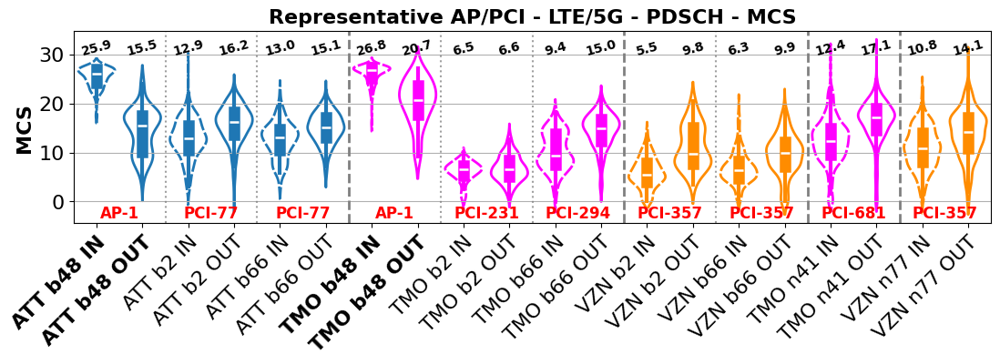

In [60]:
# LTE/5G - PDSCH - MCS
fig, ax = plt.subplots(figsize=(13, 2.75))
palette = ['tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'magenta', 'magenta', 'magenta', 'magenta', 'magenta', 'magenta', 'darkorange', 'darkorange', 'darkorange', 'darkorange', 'magenta', 'magenta', 'darkorange', 'darkorange']
data = pd.concat([
    df_lte_pdsch_att_nh_in[df_lte_pdsch_att_nh_in['PCI'].isin([4, 7])].assign(Collection_plot='ATT b48 IN'),
    df_lte_pdsch_att_nh_out[df_lte_pdsch_att_nh_out['PCI'].isin([4, 7])].assign(Collection_plot='ATT b48 OUT'),
    df_lte_pdsch_att_mno_in[(df_lte_pdsch_att_mno_in['Band Number'] == 2) & (df_lte_pdsch_att_mno_in['PCI'] == 77)].assign(Collection_plot='ATT b2 IN'),
    df_lte_pdsch_att_mno_out[(df_lte_pdsch_att_mno_out['Band Number'] == 2) & (df_lte_pdsch_att_mno_out['PCI'] == 77)].assign(Collection_plot='ATT b2 OUT'),
    df_lte_pdsch_att_mno_in[(df_lte_pdsch_att_mno_in['Band Number'] == 66) & (df_lte_pdsch_att_mno_in['PCI'] == 77)].assign(Collection_plot='ATT b66 IN'),
    df_lte_pdsch_att_mno_out[(df_lte_pdsch_att_mno_out['Band Number'] == 66) & (df_lte_pdsch_att_mno_out['PCI'] == 77)].assign(Collection_plot='ATT b66 OUT'),
    df_lte_pdsch_tmo_nh_in[df_lte_pdsch_tmo_nh_in['PCI'].isin([4, 7])].assign(Collection_plot='TMO b48 IN'),
    df_lte_pdsch_tmo_nh_out[df_lte_pdsch_tmo_nh_out['PCI'].isin([4, 7])].assign(Collection_plot='TMO b48 OUT'),
    df_lte_pdsch_tmo_mno_in[(df_lte_pdsch_tmo_mno_in['Band Number']==2) & (df_lte_pdsch_tmo_mno_in['PCI'] == 231)].assign(Collection_plot='TMO b2 IN'),
    df_lte_pdsch_tmo_mno_out[(df_lte_pdsch_tmo_mno_out['Band Number']==2) & (df_lte_pdsch_tmo_mno_out['PCI'] == 231)].assign(Collection_plot='TMO b2 OUT'),
    df_lte_pdsch_tmo_mno_in[(df_lte_pdsch_tmo_mno_in['Band Number']==66) & (df_lte_pdsch_tmo_mno_in['PCI'] == 294)].assign(Collection_plot='TMO b66 IN'),
    df_lte_pdsch_tmo_mno_out[(df_lte_pdsch_tmo_mno_out['Band Number']==66) & (df_lte_pdsch_tmo_mno_out['PCI'] == 294)].assign(Collection_plot='TMO b66 OUT'),
    df_lte_pdsch_vzn_mno_in[(df_lte_pdsch_vzn_mno_in['Band Number'] == 2) & (df_lte_pdsch_vzn_mno_in['PCI'] == 357)].assign(Collection_plot='VZN b2 IN'),
    df_lte_pdsch_vzn_mno_out[(df_lte_pdsch_vzn_mno_out['Band Number'] == 2) & (df_lte_pdsch_vzn_mno_out['PCI'] == 357)].assign(Collection_plot='VZN b2 OUT'),
    df_lte_pdsch_vzn_mno_in[(df_lte_pdsch_vzn_mno_in['Band Number'] == 66) & (df_lte_pdsch_vzn_mno_in['PCI'] == 357)].assign(Collection_plot='VZN b66 IN'),
    df_lte_pdsch_vzn_mno_out[(df_lte_pdsch_vzn_mno_out['Band Number'] == 66) & (df_lte_pdsch_vzn_mno_out['PCI'] == 357)].assign(Collection_plot='VZN b66 OUT'),
    df_5g_pdsch_tmo_mno_in[(df_5g_pdsch_tmo_mno_in['Band Number']==41) & (df_5g_pdsch_tmo_mno_in['PCI']==681)].rename(columns={'SS-RSRP': 'RSRP'}).assign(Collection_plot='TMO n41 IN'),
    df_5g_pdsch_tmo_mno_out[(df_5g_pdsch_tmo_mno_out['Band Number']==41) & (df_5g_pdsch_tmo_mno_out['PCI']==681)].rename(columns={'SS-RSRP': 'RSRP'}).assign(Collection_plot='TMO n41 OUT'),
    df_5g_pdsch_vzn_mno_in[(df_5g_pdsch_vzn_mno_in['Band Number']==77) & (df_5g_pdsch_vzn_mno_in['PCI']==357)].rename(columns={'SS-RSRP': 'RSRP'}).assign(Collection_plot='VZN n77 IN'),
    df_5g_pdsch_vzn_mno_out[(df_5g_pdsch_vzn_mno_out['Band Number']==77) & (df_5g_pdsch_vzn_mno_out['PCI']==357)].rename(columns={'SS-RSRP': 'RSRP'}).assign(Collection_plot='VZN n77 OUT')
])
sns.violinplot(data=data.dropna(subset='MCS'), x='Collection_plot', y='MCS', hue='Collection_plot', palette=palette, fill=False, linewidth=2, ax=ax)
for i in range(0, 20, 2):
    ax.collections[i].set_linestyle((0,(5,1))) # for densly dashed lines
plt.axvline(x=5.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=11.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=15.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=17.5, color='gray', linestyle='--', linewidth=2)

plt.axvline(x=1.5, color='gray', linestyle=':', linewidth=1.5, alpha=0.75)
plt.axvline(x=3.5, color='gray', linestyle=':', linewidth=1.5, alpha=0.75)
plt.axvline(x=7.5, color='gray', linestyle=':', linewidth=1.5, alpha=0.75)
plt.axvline(x=9.5, color='gray', linestyle=':', linewidth=1.5, alpha=0.75)
plt.axvline(x=13.5, color='gray', linestyle=':', linewidth=1.5, alpha=0.75)
ax.text(0.05, 0.05, 'AP-1', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(0.15, 0.05, 'PCI-77', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(0.25, 0.05, 'PCI-77', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(0.35, 0.05, 'AP-1', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(0.45, 0.05, 'PCI-231', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(0.55, 0.05, 'PCI-294', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(0.65, 0.05, 'PCI-357', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(0.75, 0.05, 'PCI-357', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(0.85, 0.05, 'PCI-681', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(0.95, 0.05, 'PCI-357', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
medians = data.groupby('Collection_plot')['MCS'].median()
for i, collection in enumerate(data['Collection_plot'].unique()):
    median_value = medians[collection]
    ax.text(i, 30, f'{median_value:.1f}', horizontalalignment='center', color='black', fontsize=10, fontweight='bold', rotation=15)

plt.xticks(rotation=45, ha='right')
dx = 10 / 72
dy = 0 / 72
offset = ScaledTranslation(dx, dy, fig.dpi_scale_trans)
for label in ax.xaxis.get_majorticklabels():
    label.set_transform(label.get_transform() + offset)
labels = plt.gca().get_xticklabels()
for label in labels:
    if label.get_text() in ['ATT b48 IN', 'ATT b48 OUT', 'TMO b48 IN', 'TMO b48 OUT']:
        label.set_fontweight('bold')
plt.xlabel('')
plt.ylabel('MCS', fontsize=16, fontweight='bold')
plt.title('Representative AP/PCI - LTE/5G - PDSCH - MCS', fontsize=16, fontweight='bold')
plt.grid(True, axis='y')
# plt.savefig('figs/josh_dl_tput_all_plot.png', bbox_inches='tight', dpi=300)
# plt.savefig('figs/josh_dl_tput_all_plot.pdf', bbox_inches='tight')
plt.show()
del fig, ax, dx, dy, offset, label, data, palette, labels

#### PUSCH

##### Data cleaning & map plotting

In [61]:
print(df_lte_pusch['Collection'].value_counts().sort_index())

Collection
Day1-ATT-MNO-DEF-IN       315
Day1-ATT-MNO-DEF-OUT      399
Day1-ATT-NH-IN            261
Day1-ATT-NH-OUT            68
Day1-TMO-MNO-DEF-IN       163
Day1-TMO-NH-IN            465
Day1-TMO-NH-OUT            64
Day2-ATT-MNO-4G-IN        335
Day2-ATT-MNO-4G-OUT       419
Day2-ATT-MNO-DEF-IN       299
Day2-ATT-MNO-DEF-OUT      364
Day2-ATT-MNO-DEF-OUTER    250
Day2-TMO-MNO-4G-IN        358
Day2-TMO-MNO-4G-OUT       335
Day2-VZN-MNO-4G-IN        256
Day2-VZN-MNO-4G-OUT       296
Day2-VZN-MNO-DEF-IN       319
Day2-VZN-MNO-DEF-OUT      336
Day2-VZN-MNO-DEF-OUTER    315
Day3_ATT-MNO-DEF-IN-L1    188
Day3_ATT-MNO-DEF-IN-L2    168
Day3_ATT-NH-IN-L1         133
Day3_ATT-NH-IN-L2         219
Day3_TMO-DEF-L1-V1         15
Day3_TMO-NH-L1            264
Day3_TMO-NH-L2            109
Day3_unnamed               44
Name: count, dtype: int64


In [62]:
df_lte_pusch_att_nh_in = df_lte_pusch[df_lte_pusch['Collection']=='Day1-ATT-NH-IN']
df_lte_pusch_att_nh_out = df_lte_pusch[df_lte_pusch['Collection']=='Day1-ATT-NH-OUT']

df_lte_pusch_att_mno_in = pd.concat([df_lte_pusch[df_lte_pusch['Collection']=='Day1-ATT-MNO-DEF-IN'],
                                    df_lte_pusch[df_lte_pusch['Collection']=='Day2-ATT-MNO-4G-IN'],
                                    df_lte_pusch[df_lte_pusch['Collection']=='Day2-ATT-MNO-DEF-IN']],
                                    ignore_index=True)
df_lte_pusch_att_mno_out = pd.concat([df_lte_pusch[df_lte_pusch['Collection']=='Day1-ATT-MNO-DEF-OUT'],
                                    df_lte_pusch[df_lte_pusch['Collection']=='Day2-ATT-MNO-4G-OUT'],
                                    df_lte_pusch[df_lte_pusch['Collection']=='Day2-ATT-MNO-DEF-OUT']],
                                    # df_lte_pusch[df_lte_pusch['Collection']=='Day2-ATT-MNO-DEF-OUTER']],
                                    ignore_index=True)

df_lte_pusch_tmo_nh_in = df_lte_pusch[df_lte_pusch['Collection']=='Day1-TMO-NH-IN']
df_lte_pusch_tmo_nh_out = df_lte_pusch[df_lte_pusch['Collection']=='Day1-TMO-NH-OUT']

df_lte_pusch_tmo_mno_in = pd.concat([df_lte_pusch[df_lte_pusch['Collection']=='Day1-TMO-MNO-DEF-IN'],
                                    df_lte_pusch[df_lte_pusch['Collection']=='Day2-TMO-MNO-4G-IN']],
                                    ignore_index=True)
df_lte_pusch_tmo_mno_out = df_lte_pusch[df_lte_pusch['Collection']=='Day2-TMO-MNO-4G-OUT']

df_lte_pusch_vzn_mno_in = pd.concat([df_lte_pusch[df_lte_pusch['Collection']=='Day2-VZN-MNO-4G-IN'],
                                    df_lte_pusch[df_lte_pusch['Collection']=='Day2-VZN-MNO-DEF-IN']],
                                    ignore_index=True)
df_lte_pusch_vzn_mno_out = pd.concat([df_lte_pusch[df_lte_pusch['Collection']=='Day2-VZN-MNO-4G-OUT'],
                                    df_lte_pusch[df_lte_pusch['Collection']=='Day2-VZN-MNO-DEF-OUT']],
                                    # df_lte_pusch[df_lte_pusch['Collection']=='Day2-VZN-MNO-DEF-OUTER']],
                                    ignore_index=True)

In [63]:
plot_geo_scatter_map(df_lte_pusch_att_nh_in, value_col="Normalized Throughput", title="LTE ATT NH IN", colorbar_title="Norm Tput", unit="")
plot_geo_scatter_map(df_lte_pusch_att_nh_out, value_col="Normalized Throughput", title="LTE ATT NH OUT", colorbar_title="Norm Tput", unit="")
plot_geo_scatter_map(df_lte_pusch_att_mno_in, value_col="Normalized Throughput", title="LTE ATT MNO IN", colorbar_title="Norm Tput", unit="")
plot_geo_scatter_map(df_lte_pusch_att_mno_out, value_col="Normalized Throughput", title="LTE ATT MNO OUT", colorbar_title="Norm Tput", unit="")

plot_geo_scatter_map(df_lte_pusch_tmo_nh_in, value_col="Normalized Throughput", title="LTE TMO NH IN", colorbar_title="Norm Tput", unit="")
plot_geo_scatter_map(df_lte_pusch_tmo_nh_out, value_col="Normalized Throughput", title="LTE TMO NH OUT", colorbar_title="Norm Tput", unit="")
plot_geo_scatter_map(df_lte_pusch_tmo_mno_in, value_col="Normalized Throughput", title="LTE TMO MNO IN", colorbar_title="Norm Tput", unit="")
plot_geo_scatter_map(df_lte_pusch_tmo_mno_out, value_col="Normalized Throughput", title="LTE TMO MNO OUT", colorbar_title="Norm Tput", unit="")

plot_geo_scatter_map(df_lte_pusch_vzn_mno_in, value_col="Normalized Throughput", title="LTE VZN MNO IN", colorbar_title="Norm Tput", unit="")
plot_geo_scatter_map(df_lte_pusch_vzn_mno_out, value_col="Normalized Throughput", title="LTE VZN MNO OUT", colorbar_title="Norm Tput", unit="")

In [64]:
print(df_5g_pusch['Collection'].value_counts().sort_index())

Collection
Day1-TMO-MNO-DEF-IN       550
Day1-TMO-MNO-DEF-OUT      443
Day2-TMO-MNO-DEF-IN       297
Day2-TMO-MNO-DEF-OUT      357
Day2-TMO-MNO-DEF-OUTER    210
Day2-VZN-MNO-DEF-IN       239
Day2-VZN-MNO-DEF-OUT      334
Day2-VZN-MNO-DEF-OUTER    314
Day3_TMO-DEF-IN-L2        147
Day3_TMO-DEF-L1-V1        135
Day3_TMO-DEF-L2           105
Name: count, dtype: int64


In [65]:
df_5g_pusch_tmo_mno_in = pd.concat([df_5g_pusch[df_5g_pusch['Collection']=='Day1-TMO-MNO-DEF-IN'],
                                    df_5g_pusch[df_5g_pusch['Collection']=='Day2-TMO-MNO-DEF-IN']],
                                    ignore_index=True)
df_5g_pusch_tmo_mno_out = pd.concat([df_5g_pusch[df_5g_pusch['Collection']=='Day1-TMO-MNO-DEF-OUT'],
                                    df_5g_pusch[df_5g_pusch['Collection']=='Day2-TMO-MNO-DEF-OUT']],
                                    # df_5g_pusch[df_5g_pusch['Collection']=='Day2-TMO-MNO-DEF-OUTER']],
                                    ignore_index=True)

df_5g_pusch_vzn_mno_in = df_5g_pusch[df_5g_pusch['Collection']=='Day2-VZN-MNO-DEF-IN']
df_5g_pusch_vzn_mno_out = pd.concat([df_5g_pusch[df_5g_pusch['Collection']=='Day2-VZN-MNO-DEF-OUT']],
                                    # df_5g_pusch[df_5g_pusch['Collection']=='Day2-VZN-MNO-DEF-OUTER']],
                                    ignore_index=True)

In [66]:
plot_geo_scatter_map(df_5g_pusch_tmo_mno_in, value_col="Normalized Throughput", title="5G TMO MNO IN", colorbar_title="Norm Tput", unit="")
plot_geo_scatter_map(df_5g_pusch_tmo_mno_out, value_col="Normalized Throughput", title="5G TMO MNO OUT", colorbar_title="Norm Tput", unit="")

plot_geo_scatter_map(df_5g_pusch_vzn_mno_in, value_col="Normalized Throughput", title="5G VZN MNO IN", colorbar_title="Norm Tput", unit="")
plot_geo_scatter_map(df_5g_pusch_vzn_mno_out, value_col="Normalized Throughput", title="5G VZN MNO OUT", colorbar_title="Norm Tput", unit="")

##### print(): Statistics summary

In [67]:
print('LTE ATT NH IN')
print(df_lte_pusch_att_nh_in[['Band Number', 'UL Bandwidth']].value_counts().sort_index())
print('LTE ATT NH OUT')
print(df_lte_pusch_att_nh_out[['Band Number', 'UL Bandwidth']].value_counts().sort_index())
print('LTE ATT MNO IN')
print(df_lte_pusch_att_mno_in[['Band Number', 'UL Bandwidth']].value_counts().sort_index())
print('LTE ATT MNO OUT')
print(df_lte_pusch_att_mno_out[['Band Number', 'UL Bandwidth']].value_counts().sort_index())

LTE ATT NH IN
Band Number  UL Bandwidth
48           20              261
Name: count, dtype: int64
LTE ATT NH OUT
Band Number  UL Bandwidth
48           20              68
Name: count, dtype: int64
LTE ATT MNO IN
Band Number  UL Bandwidth
2            10               68
             15              419
12           10              128
14           10               63
30           10              271
Name: count, dtype: int64
LTE ATT MNO OUT
Band Number  UL Bandwidth
2            10              213
             15              818
30           10              151
Name: count, dtype: int64


In [68]:
print('LTE TMO NH IN')
print(df_lte_pusch_tmo_nh_in[['Band Number', 'UL Bandwidth']].value_counts().sort_index())
print('LTE TMO NH OUT')
print(df_lte_pusch_tmo_nh_out[['Band Number', 'UL Bandwidth']].value_counts().sort_index())
print('LTE TMO MNO IN')
print(df_lte_pusch_tmo_mno_in[['Band Number', 'UL Bandwidth']].value_counts().sort_index())
print('LTE TMO MNO OUT')
print(df_lte_pusch_tmo_mno_out[['Band Number', 'UL Bandwidth']].value_counts().sort_index())

LTE TMO NH IN
Band Number  UL Bandwidth
48           20              465
Name: count, dtype: int64
LTE TMO NH OUT
Band Number  UL Bandwidth
48           20              64
Name: count, dtype: int64
LTE TMO MNO IN
Band Number  UL Bandwidth
2            5                 9
66           20              512
Name: count, dtype: int64
LTE TMO MNO OUT
Band Number  UL Bandwidth
66           20              335
Name: count, dtype: int64


In [69]:
print('LTE VZN MNO IN')
print(df_lte_pusch_vzn_mno_in[['Band Number', 'UL Bandwidth']].value_counts().sort_index())
print('LTE VZN MNO OUT')
print(df_lte_pusch_vzn_mno_out[['Band Number', 'UL Bandwidth']].value_counts().sort_index())

LTE VZN MNO IN
Band Number  UL Bandwidth
5            10              235
13           10              298
66           10               42
Name: count, dtype: int64
LTE VZN MNO OUT
Band Number  UL Bandwidth
66           20              632
Name: count, dtype: int64


In [70]:
print('5G TMO MNO IN')
print(df_5g_pusch_tmo_mno_in[['Band Number', 'UL Bandwidth']].value_counts().sort_index())
print('5G TMO MNO OUT')
print(df_5g_pusch_tmo_mno_out[['Band Number', 'UL Bandwidth']].value_counts().sort_index())
print('5G VZN MNO IN')
print(df_5g_pusch_vzn_mno_in[['Band Number', 'UL Bandwidth']].value_counts().sort_index())
print('5G VZN MNO OUT')
print(df_5g_pusch_vzn_mno_out[['Band Number', 'UL Bandwidth']].value_counts().sort_index())

5G TMO MNO IN
Band Number  UL Bandwidth
25.0         14.0            525
41.0         88.0              2
             98.0            309
Name: count, dtype: int64
5G TMO MNO OUT
Band Number  UL Bandwidth
25.0         14.0            188
41.0         88.0             63
             98.0            549
Name: count, dtype: int64
5G VZN MNO IN
Band Number  UL Bandwidth
77.0         98.0            239
Name: count, dtype: int64
5G VZN MNO OUT
Band Number  UL Bandwidth
77.0         98.0            334
Name: count, dtype: int64


##### Plots: All Meas

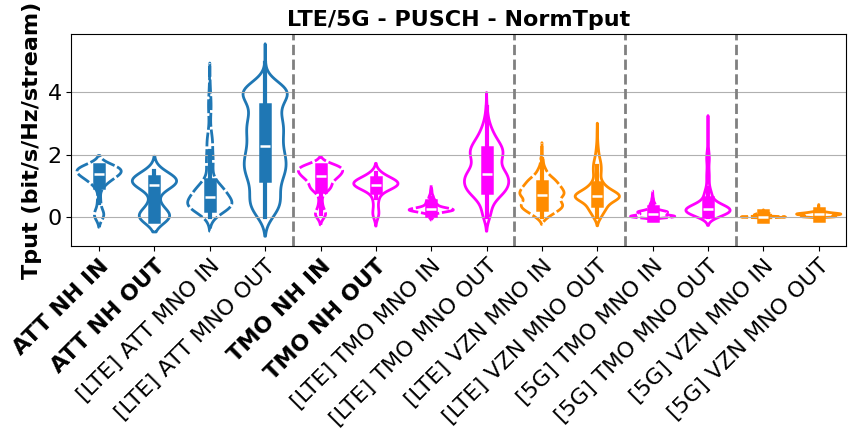

In [71]:
# LTE/5G - PUSCH - NormTput
fig, ax = plt.subplots(figsize=(10, 2.75))
palette = ['tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'magenta', 'magenta', 'magenta', 'magenta', 'darkorange', 'darkorange', 'magenta', 'magenta', 'darkorange', 'darkorange']
data = pd.concat([
    df_lte_pusch_att_nh_in.assign(Collection_plot='ATT NH IN'),
    df_lte_pusch_att_nh_out.assign(Collection_plot='ATT NH OUT'),
    df_lte_pusch_att_mno_in.assign(Collection_plot='[LTE] ATT MNO IN'),
    df_lte_pusch_att_mno_out.assign(Collection_plot='[LTE] ATT MNO OUT'),
    df_lte_pusch_tmo_nh_in.assign(Collection_plot='TMO NH IN'),
    df_lte_pusch_tmo_nh_out.assign(Collection_plot='TMO NH OUT'),
    df_lte_pusch_tmo_mno_in.assign(Collection_plot='[LTE] TMO MNO IN'),
    df_lte_pusch_tmo_mno_out.assign(Collection_plot='[LTE] TMO MNO OUT'),
    df_lte_pusch_vzn_mno_in.assign(Collection_plot='[LTE] VZN MNO IN'),
    df_lte_pusch_vzn_mno_out.assign(Collection_plot='[LTE] VZN MNO OUT'),
    df_5g_pusch_tmo_mno_in.assign(Collection_plot='[5G] TMO MNO IN'),
    df_5g_pusch_tmo_mno_out.assign(Collection_plot='[5G] TMO MNO OUT'),
    df_5g_pusch_vzn_mno_in.assign(Collection_plot='[5G] VZN MNO IN'),
    df_5g_pusch_vzn_mno_out.assign(Collection_plot='[5G] VZN MNO OUT')
])
sns.violinplot(data=data, x='Collection_plot', y='Normalized Throughput', hue='Collection_plot', palette=palette, fill=False, linewidth=2, ax=ax)
for i in range(0, 14, 2):
    ax.collections[i].set_linestyle((0,(5,1))) # for densly dashed lines
plt.axvline(x=3.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=7.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=9.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=11.5, color='gray', linestyle='--', linewidth=2)
plt.xticks(rotation=45, ha='right')
dx = 10 / 72
dy = 0 / 72
offset = ScaledTranslation(dx, dy, fig.dpi_scale_trans)
for label in ax.xaxis.get_majorticklabels():
    label.set_transform(label.get_transform() + offset)
labels = plt.gca().get_xticklabels()
for label in labels:
    if label.get_text() in ['ATT NH IN', 'ATT NH OUT', 'TMO NH IN', 'TMO NH OUT']:
        label.set_fontweight('bold')
plt.xlabel('')
plt.ylabel('Tput (bit/s/Hz/stream)', fontsize=16, fontweight='bold')
plt.title('LTE/5G - PUSCH - NormTput', fontsize=16, fontweight='bold')
plt.grid(True, axis='y')
# plt.savefig('figs/josh_dl_tput_all_plot.png', bbox_inches='tight', dpi=300)
# plt.savefig('figs/josh_dl_tput_all_plot.pdf', bbox_inches='tight')
plt.show()
del fig, ax, dx, dy, offset, label, data, labels

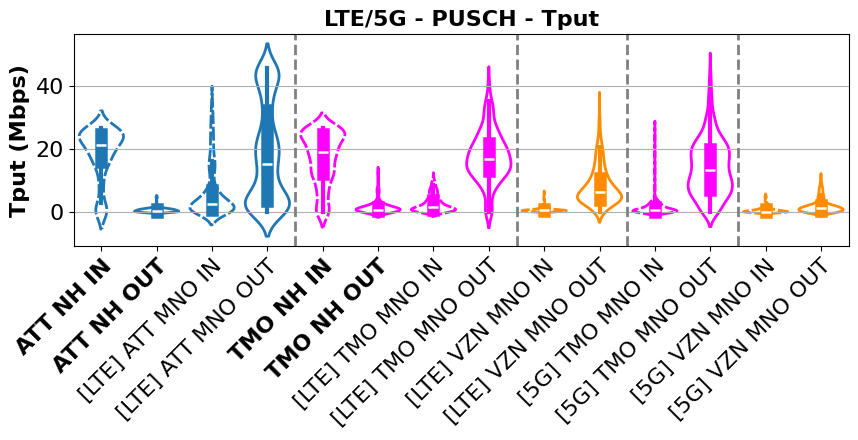

In [72]:
# LTE/5G - PUSCH - Tput
fig, ax = plt.subplots(figsize=(10, 2.75))
palette = ['tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'magenta', 'magenta', 'magenta', 'magenta', 'darkorange', 'darkorange', 'magenta', 'magenta', 'darkorange', 'darkorange']
data = pd.concat([
    df_lte_pusch_att_nh_in.assign(Collection_plot='ATT NH IN'),
    df_lte_pusch_att_nh_out.assign(Collection_plot='ATT NH OUT'),
    df_lte_pusch_att_mno_in.assign(Collection_plot='[LTE] ATT MNO IN'),
    df_lte_pusch_att_mno_out.assign(Collection_plot='[LTE] ATT MNO OUT'),
    df_lte_pusch_tmo_nh_in.assign(Collection_plot='TMO NH IN'),
    df_lte_pusch_tmo_nh_out.assign(Collection_plot='TMO NH OUT'),
    df_lte_pusch_tmo_mno_in.assign(Collection_plot='[LTE] TMO MNO IN'),
    df_lte_pusch_tmo_mno_out.assign(Collection_plot='[LTE] TMO MNO OUT'),
    df_lte_pusch_vzn_mno_in.assign(Collection_plot='[LTE] VZN MNO IN'),
    df_lte_pusch_vzn_mno_out.assign(Collection_plot='[LTE] VZN MNO OUT'),
    df_5g_pusch_tmo_mno_in.assign(Collection_plot='[5G] TMO MNO IN'),
    df_5g_pusch_tmo_mno_out.assign(Collection_plot='[5G] TMO MNO OUT'),
    df_5g_pusch_vzn_mno_in.assign(Collection_plot='[5G] VZN MNO IN'),
    df_5g_pusch_vzn_mno_out.assign(Collection_plot='[5G] VZN MNO OUT')
])
sns.violinplot(data=data, x='Collection_plot', y='Net PUSCH Throughput', hue='Collection_plot', palette=palette, fill=False, linewidth=2, ax=ax)
for i in range(0, 14, 2):
    ax.collections[i].set_linestyle((0,(5,1))) # for densly dashed lines
plt.axvline(x=3.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=7.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=9.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=11.5, color='gray', linestyle='--', linewidth=2)
plt.xticks(rotation=45, ha='right')
dx = 10 / 72
dy = 0 / 72
offset = ScaledTranslation(dx, dy, fig.dpi_scale_trans)
for label in ax.xaxis.get_majorticklabels():
    label.set_transform(label.get_transform() + offset)
labels = plt.gca().get_xticklabels()
for label in labels:
    if label.get_text() in ['ATT NH IN', 'ATT NH OUT', 'TMO NH IN', 'TMO NH OUT']:
        label.set_fontweight('bold')
plt.xlabel('')
plt.ylabel('Tput (Mbps)', fontsize=16, fontweight='bold')
plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{int(y/1e3)}'))
plt.title('LTE/5G - PUSCH - Tput', fontsize=16, fontweight='bold')
plt.grid(True, axis='y')
# plt.savefig('figs/josh_dl_tput_all_plot.png', bbox_inches='tight', dpi=300)
# plt.savefig('figs/josh_dl_tput_all_plot.pdf', bbox_inches='tight')
plt.show()
del fig, ax, dx, dy, offset, label, data, labels

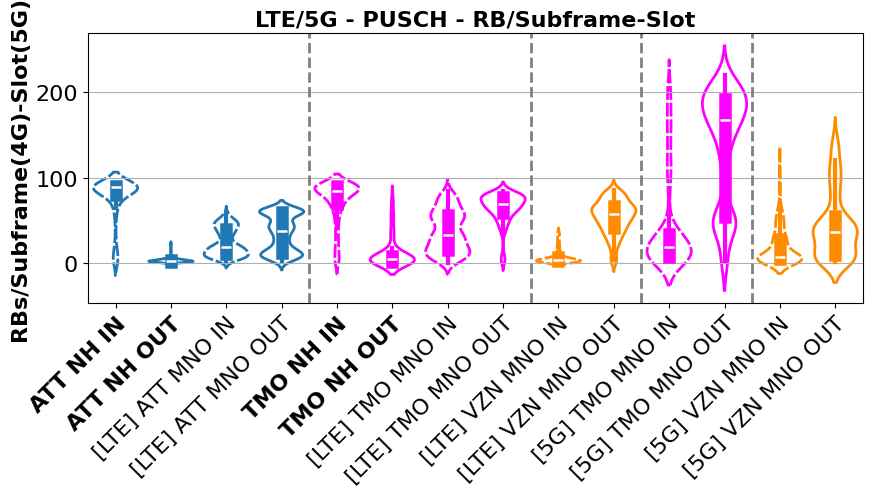

In [73]:
# LTE/5G - PUSCH - RB/Subframe-Slot
fig, ax = plt.subplots(figsize=(10, 3.5))
palette = ['tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'magenta', 'magenta', 'magenta', 'magenta', 'darkorange', 'darkorange', 'magenta', 'magenta', 'darkorange', 'darkorange']
data = pd.concat([
    df_lte_pusch_att_nh_in.assign(Collection_plot='ATT NH IN'),
    df_lte_pusch_att_nh_out.assign(Collection_plot='ATT NH OUT'),
    df_lte_pusch_att_mno_in.assign(Collection_plot='[LTE] ATT MNO IN'),
    df_lte_pusch_att_mno_out.assign(Collection_plot='[LTE] ATT MNO OUT'),
    df_lte_pusch_tmo_nh_in.assign(Collection_plot='TMO NH IN'),
    df_lte_pusch_tmo_nh_out.assign(Collection_plot='TMO NH OUT'),
    df_lte_pusch_tmo_mno_in.assign(Collection_plot='[LTE] TMO MNO IN'),
    df_lte_pusch_tmo_mno_out.assign(Collection_plot='[LTE] TMO MNO OUT'),
    df_lte_pusch_vzn_mno_in.assign(Collection_plot='[LTE] VZN MNO IN'),
    df_lte_pusch_vzn_mno_out.assign(Collection_plot='[LTE] VZN MNO OUT'),
    df_5g_pusch_tmo_mno_in.assign(Collection_plot='[5G] TMO MNO IN'),
    df_5g_pusch_tmo_mno_out.assign(Collection_plot='[5G] TMO MNO OUT'),
    df_5g_pusch_vzn_mno_in.assign(Collection_plot='[5G] VZN MNO IN'),
    df_5g_pusch_vzn_mno_out.assign(Collection_plot='[5G] VZN MNO OUT')
])
sns.violinplot(data=data, x='Collection_plot', y='RB per Subframe-Slot', hue='Collection_plot', palette=palette, fill=False, linewidth=2, ax=ax)
for i in range(0, 14, 2):
    ax.collections[i].set_linestyle((0,(5,1))) # for densly dashed lines
plt.axvline(x=3.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=7.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=9.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=11.5, color='gray', linestyle='--', linewidth=2)
plt.xticks(rotation=45, ha='right')
dx = 10 / 72
dy = 0 / 72
offset = ScaledTranslation(dx, dy, fig.dpi_scale_trans)
for label in ax.xaxis.get_majorticklabels():
    label.set_transform(label.get_transform() + offset)
labels = plt.gca().get_xticklabels()
for label in labels:
    if label.get_text() in ['ATT NH IN', 'ATT NH OUT', 'TMO NH IN', 'TMO NH OUT']:
        label.set_fontweight('bold')
plt.xlabel('')
plt.ylabel('RBs/Subframe(4G)-Slot(5G)', fontsize=16, fontweight='bold')
plt.title('LTE/5G - PUSCH - RB/Subframe-Slot', fontsize=16, fontweight='bold')
plt.grid(True, axis='y')
# plt.savefig('figs/josh_dl_tput_all_plot.png', bbox_inches='tight', dpi=300)
# plt.savefig('figs/josh_dl_tput_all_plot.pdf', bbox_inches='tight')
plt.show()
del fig, ax, dx, dy, offset, label, data, labels

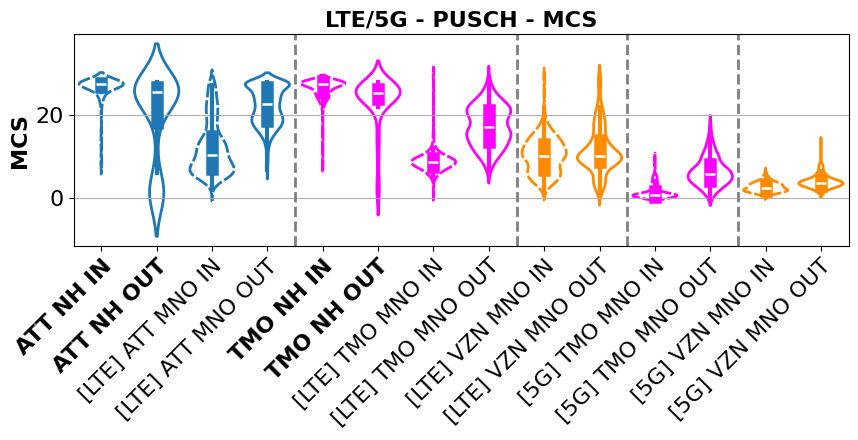

In [74]:
# LTE/5G - PUSCH - MCS
fig, ax = plt.subplots(figsize=(10, 2.75))
palette = ['tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'magenta', 'magenta', 'magenta', 'magenta', 'darkorange', 'darkorange', 'magenta', 'magenta', 'darkorange', 'darkorange']
data = pd.concat([
    df_lte_pusch_att_nh_in.assign(Collection_plot='ATT NH IN'),
    df_lte_pusch_att_nh_out.assign(Collection_plot='ATT NH OUT'),
    df_lte_pusch_att_mno_in.assign(Collection_plot='[LTE] ATT MNO IN'),
    df_lte_pusch_att_mno_out.assign(Collection_plot='[LTE] ATT MNO OUT'),
    df_lte_pusch_tmo_nh_in.assign(Collection_plot='TMO NH IN'),
    df_lte_pusch_tmo_nh_out.assign(Collection_plot='TMO NH OUT'),
    df_lte_pusch_tmo_mno_in.assign(Collection_plot='[LTE] TMO MNO IN'),
    df_lte_pusch_tmo_mno_out.assign(Collection_plot='[LTE] TMO MNO OUT'),
    df_lte_pusch_vzn_mno_in.assign(Collection_plot='[LTE] VZN MNO IN'),
    df_lte_pusch_vzn_mno_out.assign(Collection_plot='[LTE] VZN MNO OUT'),
    df_5g_pusch_tmo_mno_in.assign(Collection_plot='[5G] TMO MNO IN'),
    df_5g_pusch_tmo_mno_out.assign(Collection_plot='[5G] TMO MNO OUT'),
    df_5g_pusch_vzn_mno_in.assign(Collection_plot='[5G] VZN MNO IN'),
    df_5g_pusch_vzn_mno_out.assign(Collection_plot='[5G] VZN MNO OUT')
])
sns.violinplot(data=data.dropna(subset=['MCS']), x='Collection_plot', y='MCS', hue='Collection_plot', palette=palette, fill=False, linewidth=2, ax=ax)
for i in range(0, 14, 2):
    ax.collections[i].set_linestyle((0,(5,1))) # for densly dashed lines
plt.axvline(x=3.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=7.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=9.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=11.5, color='gray', linestyle='--', linewidth=2)
plt.xticks(rotation=45, ha='right')
dx = 10 / 72
dy = 0 / 72
offset = ScaledTranslation(dx, dy, fig.dpi_scale_trans)
for label in ax.xaxis.get_majorticklabels():
    label.set_transform(label.get_transform() + offset)
labels = plt.gca().get_xticklabels()
for label in labels:
    if label.get_text() in ['ATT NH IN', 'ATT NH OUT', 'TMO NH IN', 'TMO NH OUT']:
        label.set_fontweight('bold')
plt.xlabel('')
plt.ylabel('MCS', fontsize=16, fontweight='bold')
plt.title('LTE/5G - PUSCH - MCS', fontsize=16, fontweight='bold')
plt.grid(True, axis='y')
# plt.savefig('figs/josh_dl_tput_all_plot.png', bbox_inches='tight', dpi=300)
# plt.savefig('figs/josh_dl_tput_all_plot.pdf', bbox_inches='tight')
plt.show()
del fig, ax, dx, dy, offset, label, data, labels

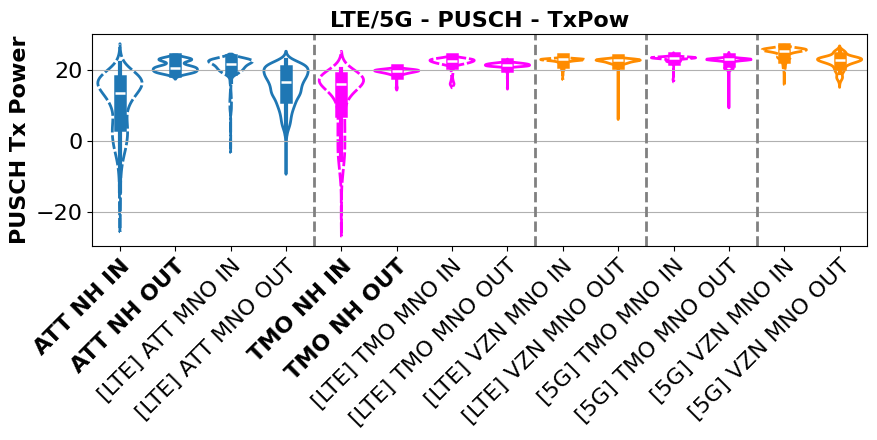

In [75]:
# LTE/5G - PUSCH - TX Power
fig, ax = plt.subplots(figsize=(10, 2.75))
palette = ['tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'magenta', 'magenta', 'magenta', 'magenta', 'darkorange', 'darkorange', 'magenta', 'magenta', 'darkorange', 'darkorange']
data = pd.concat([
    df_lte_pusch_att_nh_in.assign(Collection_plot='ATT NH IN'),
    df_lte_pusch_att_nh_out.assign(Collection_plot='ATT NH OUT'),
    df_lte_pusch_att_mno_in.assign(Collection_plot='[LTE] ATT MNO IN'),
    df_lte_pusch_att_mno_out.assign(Collection_plot='[LTE] ATT MNO OUT'),
    df_lte_pusch_tmo_nh_in.assign(Collection_plot='TMO NH IN'),
    df_lte_pusch_tmo_nh_out.assign(Collection_plot='TMO NH OUT'),
    df_lte_pusch_tmo_mno_in.assign(Collection_plot='[LTE] TMO MNO IN'),
    df_lte_pusch_tmo_mno_out.assign(Collection_plot='[LTE] TMO MNO OUT'),
    df_lte_pusch_vzn_mno_in.assign(Collection_plot='[LTE] VZN MNO IN'),
    df_lte_pusch_vzn_mno_out.assign(Collection_plot='[LTE] VZN MNO OUT'),
    df_5g_pusch_tmo_mno_in.assign(Collection_plot='[5G] TMO MNO IN'),
    df_5g_pusch_tmo_mno_out.assign(Collection_plot='[5G] TMO MNO OUT'),
    df_5g_pusch_vzn_mno_in.assign(Collection_plot='[5G] VZN MNO IN'),
    df_5g_pusch_vzn_mno_out.assign(Collection_plot='[5G] VZN MNO OUT')
])
sns.violinplot(data=data.dropna(subset=['PUSCH Tx Power']), x='Collection_plot', y='PUSCH Tx Power', hue='Collection_plot', palette=palette, fill=False, linewidth=2, ax=ax)
for i in range(0, 14, 2):
    ax.collections[i].set_linestyle((0,(5,1))) # for densly dashed lines
plt.axvline(x=3.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=7.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=9.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=11.5, color='gray', linestyle='--', linewidth=2)
plt.xticks(rotation=45, ha='right')
dx = 10 / 72
dy = 0 / 72
offset = ScaledTranslation(dx, dy, fig.dpi_scale_trans)
for label in ax.xaxis.get_majorticklabels():
    label.set_transform(label.get_transform() + offset)
labels = plt.gca().get_xticklabels()
for label in labels:
    if label.get_text() in ['ATT NH IN', 'ATT NH OUT', 'TMO NH IN', 'TMO NH OUT']:
        label.set_fontweight('bold')
plt.xlabel('')
plt.ylabel('PUSCH Tx Power', fontsize=16, fontweight='bold')
plt.title('LTE/5G - PUSCH - TxPow', fontsize=16, fontweight='bold')
plt.grid(True, axis='y')
# plt.savefig('figs/josh_dl_tput_all_plot.png', bbox_inches='tight', dpi=300)
# plt.savefig('figs/josh_dl_tput_all_plot.pdf', bbox_inches='tight')
plt.show()
del fig, ax, dx, dy, offset, label, data, labels

##### Plots: NH - In vs Out

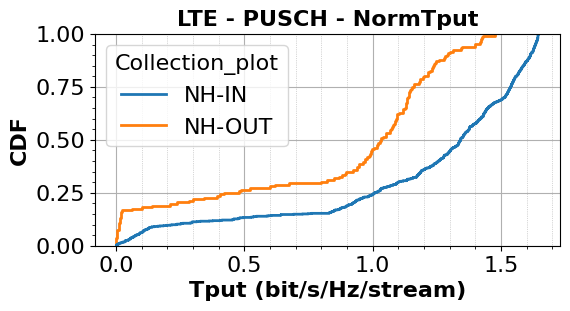

In [222]:
# LTE - PUSCH - NormTput
fig, ax = plt.subplots(figsize=(6, 2.75))
data = pd.concat([
    df_lte_pusch_att_nh_in.assign(Collection_plot='NH-IN'),
    df_lte_pusch_att_nh_out.assign(Collection_plot='NH-OUT'),
    df_lte_pusch_tmo_nh_in.assign(Collection_plot='NH-IN'),
    df_lte_pusch_tmo_nh_out.assign(Collection_plot='NH-OUT'),
])
sns.ecdfplot(data=data, x='Normalized Throughput', hue='Collection_plot', ax=ax, linewidth=2)
plt.ylabel('CDF', fontsize=16, fontweight='bold')
plt.xlabel('Tput (bit/s/Hz/stream)', fontsize=16, fontweight='bold')
plt.title('LTE - PUSCH - NormTput', fontsize=16, fontweight='bold')
plt.grid(True)
ax.minorticks_on()
ax.xaxis.grid(True, which='minor', linestyle=':', linewidth=0.5)
# plt.savefig('figs/josh_dl_tput_all_plot.png', bbox_inches='tight', dpi=300)
# plt.savefig('figs/josh_dl_tput_all_plot.pdf', bbox_inches='tight')
plt.show()
del fig, ax, data

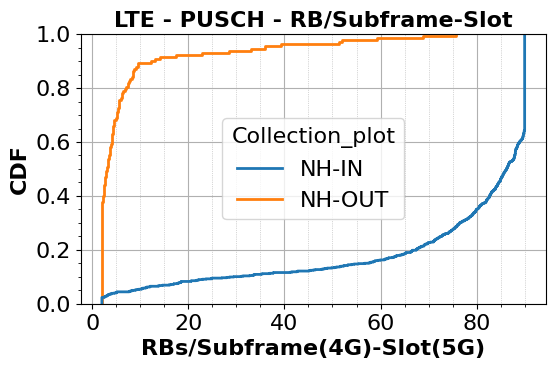

In [223]:
# LTE - PUSCH - RB/Subframe-Slot
fig, ax = plt.subplots(figsize=(6, 3.5))
data = pd.concat([
    df_lte_pusch_att_nh_in.assign(Collection_plot='NH-IN'),
    df_lte_pusch_att_nh_out.assign(Collection_plot='NH-OUT'),
    df_lte_pusch_tmo_nh_in.assign(Collection_plot='NH-IN'),
    df_lte_pusch_tmo_nh_out.assign(Collection_plot='NH-OUT'),
])
sns.ecdfplot(data=data, x='RB per Subframe-Slot', hue='Collection_plot', ax=ax, linewidth=2)
plt.ylabel('CDF', fontsize=16, fontweight='bold')
plt.xlabel('RBs/Subframe(4G)-Slot(5G)', fontsize=16, fontweight='bold')
plt.title('LTE - PUSCH - RB/Subframe-Slot', fontsize=16, fontweight='bold')
plt.grid(True)
ax.minorticks_on()
ax.xaxis.grid(True, which='minor', linestyle=':', linewidth=0.5)
# plt.savefig('figs/josh_dl_tput_all_plot.png', bbox_inches='tight', dpi=300)
# plt.savefig('figs/josh_dl_tput_all_plot.pdf', bbox_inches='tight')
plt.show()
del fig, ax, data

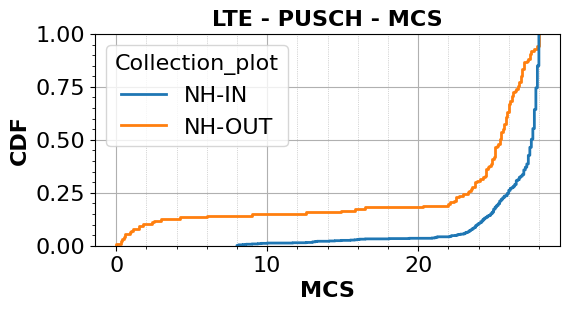

In [224]:
# LTE - PUSCH - MCS
fig, ax = plt.subplots(figsize=(6, 2.75))
data = pd.concat([
    df_lte_pusch_att_nh_in.assign(Collection_plot='NH-IN'),
    df_lte_pusch_att_nh_out.assign(Collection_plot='NH-OUT'),
    df_lte_pusch_tmo_nh_in.assign(Collection_plot='NH-IN'),
    df_lte_pusch_tmo_nh_out.assign(Collection_plot='NH-OUT'),
])
sns.ecdfplot(data=data, x='MCS', hue='Collection_plot', ax=ax, linewidth=2)
plt.ylabel('CDF', fontsize=16, fontweight='bold')
plt.xlabel('MCS', fontsize=16, fontweight='bold')
plt.title('LTE - PUSCH - MCS', fontsize=16, fontweight='bold')
plt.grid(True)
ax.minorticks_on()
ax.xaxis.grid(True, which='minor', linestyle=':', linewidth=0.5)
# plt.savefig('figs/josh_dl_tput_all_plot.png', bbox_inches='tight', dpi=300)
# plt.savefig('figs/josh_dl_tput_all_plot.pdf', bbox_inches='tight')
plt.show()
del fig, ax, data

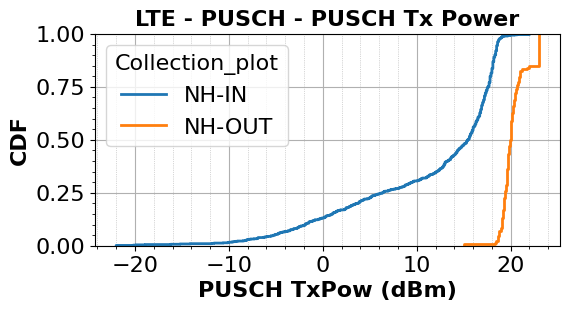

In [225]:
# LTE - PUSCH - PUSCH Tx Power
fig, ax = plt.subplots(figsize=(6, 2.75))
data = pd.concat([
    df_lte_pusch_att_nh_in.assign(Collection_plot='NH-IN'),
    df_lte_pusch_att_nh_out.assign(Collection_plot='NH-OUT'),
    df_lte_pusch_tmo_nh_in.assign(Collection_plot='NH-IN'),
    df_lte_pusch_tmo_nh_out.assign(Collection_plot='NH-OUT'),
])
sns.ecdfplot(data=data, x='PUSCH Tx Power', hue='Collection_plot', ax=ax, linewidth=2)
plt.ylabel('CDF', fontsize=16, fontweight='bold')
plt.xlabel('PUSCH TxPow (dBm)', fontsize=16, fontweight='bold')
plt.title('LTE - PUSCH - PUSCH Tx Power', fontsize=16, fontweight='bold')
plt.grid(True)
ax.minorticks_on()
ax.xaxis.grid(True, which='minor', linestyle=':', linewidth=0.5)
# plt.savefig('figs/josh_dl_tput_all_plot.png', bbox_inches='tight', dpi=300)
# plt.savefig('figs/josh_dl_tput_all_plot.pdf', bbox_inches='tight')
plt.show()
del fig, ax, data

##### Plots: Band specific

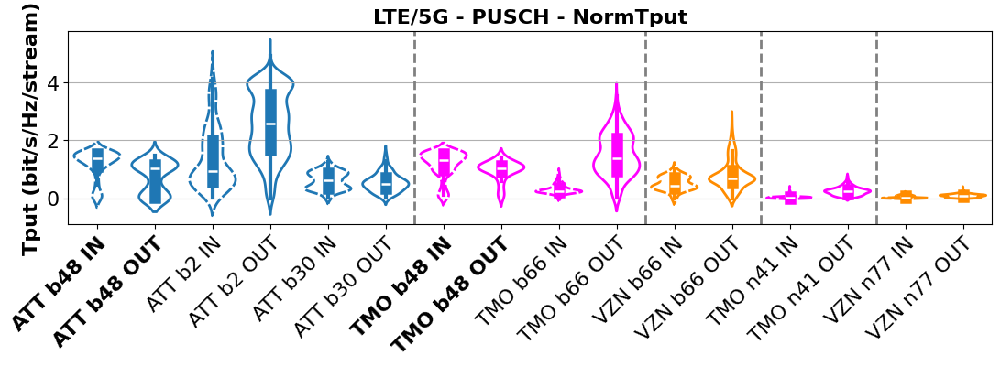

In [226]:
# LTE/5G - PUSCH - NormTput
fig, ax = plt.subplots(figsize=(13, 2.75))
palette = ['tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'magenta', 'magenta', 'magenta', 'magenta', 'darkorange', 'darkorange', 'magenta', 'magenta', 'darkorange', 'darkorange']
data = pd.concat([
    df_lte_pusch_att_nh_in.assign(Collection_plot='ATT b48 IN'),
    df_lte_pusch_att_nh_out.assign(Collection_plot='ATT b48 OUT'),
    df_lte_pusch_att_mno_in[df_lte_pusch_att_mno_in['Band Number']==2].assign(Collection_plot='ATT b2 IN'),
    df_lte_pusch_att_mno_out[df_lte_pusch_att_mno_out['Band Number']==2].assign(Collection_plot='ATT b2 OUT'),
    df_lte_pusch_att_mno_in[df_lte_pusch_att_mno_in['Band Number']==30].assign(Collection_plot='ATT b30 IN'),
    df_lte_pusch_att_mno_out[df_lte_pusch_att_mno_out['Band Number']==30].assign(Collection_plot='ATT b30 OUT'),
    df_lte_pusch_tmo_nh_in.assign(Collection_plot='TMO b48 IN'),
    df_lte_pusch_tmo_nh_out.assign(Collection_plot='TMO b48 OUT'),
    # df_lte_pusch_tmo_mno_in[df_lte_pusch_tmo_mno_in['Band Number']==2].assign(Collection_plot='TMO b2 IN'),
    df_lte_pusch_tmo_mno_in[df_lte_pusch_tmo_mno_in['Band Number']==66].assign(Collection_plot='TMO b66 IN'),
    # df_lte_pusch_tmo_mno_out[df_lte_pusch_tmo_mno_out['Band Number']==2].assign(Collection_plot='TMO b2 OUT'),
    df_lte_pusch_tmo_mno_out[df_lte_pusch_tmo_mno_out['Band Number']==66].assign(Collection_plot='TMO b66 OUT'),
    # df_lte_pusch_vzn_mno_in[df_lte_pusch_vzn_mno_in['Band Number']==2].assign(Collection_plot='VZN b2 IN'),
    df_lte_pusch_vzn_mno_in[df_lte_pusch_vzn_mno_in['Band Number']==66].assign(Collection_plot='VZN b66 IN'),
    # df_lte_pusch_vzn_mno_out[df_lte_pusch_vzn_mno_out['Band Number']==2].assign(Collection_plot='VZN b2 OUT'),
    df_lte_pusch_vzn_mno_out[df_lte_pusch_vzn_mno_out['Band Number']==66].assign(Collection_plot='VZN b66 OUT'),
    df_5g_pusch_tmo_mno_in[df_5g_pusch_tmo_mno_in['Band Number']==41].assign(Collection_plot='TMO n41 IN'),
    df_5g_pusch_tmo_mno_out[df_5g_pusch_tmo_mno_out['Band Number']==41].assign(Collection_plot='TMO n41 OUT'),
    df_5g_pusch_vzn_mno_in[df_5g_pusch_vzn_mno_in['Band Number']==77].assign(Collection_plot='VZN n77 IN'),
    df_5g_pusch_vzn_mno_out[df_5g_pusch_vzn_mno_out['Band Number']==77].assign(Collection_plot='VZN n77 OUT'),
])
sns.violinplot(data=data, x='Collection_plot', y='Normalized Throughput', hue='Collection_plot', palette=palette, fill=False, linewidth=2, ax=ax)
for i in range(0, 16, 2):
    ax.collections[i].set_linestyle((0,(5,1))) # for densly dashed lines
plt.axvline(x=5.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=9.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=11.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=13.5, color='gray', linestyle='--', linewidth=2)
plt.xticks(rotation=45, ha='right')
dx = 10 / 72
dy = 0 / 72
offset = ScaledTranslation(dx, dy, fig.dpi_scale_trans)
for label in ax.xaxis.get_majorticklabels():
    label.set_transform(label.get_transform() + offset)
labels = plt.gca().get_xticklabels()
for label in labels:
    if label.get_text() in ['ATT b48 IN', 'ATT b48 OUT', 'TMO b48 IN', 'TMO b48 OUT']:
        label.set_fontweight('bold')
plt.xlabel('')
plt.ylabel('Tput (bit/s/Hz/stream)', fontsize=16, fontweight='bold')
plt.title('LTE/5G - PUSCH - NormTput', fontsize=16, fontweight='bold')
plt.grid(True, axis='y')
# plt.savefig('figs/josh_dl_tput_all_plot.png', bbox_inches='tight', dpi=300)
# plt.savefig('figs/josh_dl_tput_all_plot.pdf', bbox_inches='tight')
plt.show()
del fig, ax, dx, dy, offset, label, data, palette, labels

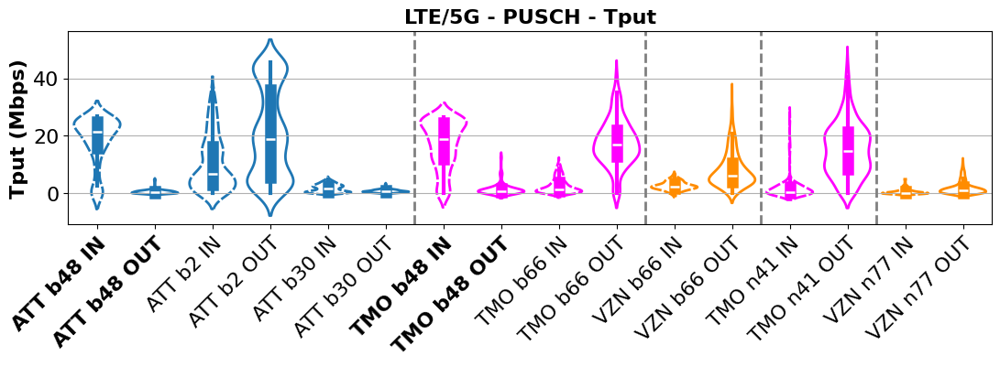

In [227]:
# LTE/5G - PUSCH - Tput
fig, ax = plt.subplots(figsize=(13, 2.75))
palette = ['tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'magenta', 'magenta', 'magenta', 'magenta', 'darkorange', 'darkorange', 'magenta', 'magenta', 'darkorange', 'darkorange']
data = pd.concat([
    df_lte_pusch_att_nh_in.assign(Collection_plot='ATT b48 IN'),
    df_lte_pusch_att_nh_out.assign(Collection_plot='ATT b48 OUT'),
    df_lte_pusch_att_mno_in[df_lte_pusch_att_mno_in['Band Number']==2].assign(Collection_plot='ATT b2 IN'),
    df_lte_pusch_att_mno_out[df_lte_pusch_att_mno_out['Band Number']==2].assign(Collection_plot='ATT b2 OUT'),
    df_lte_pusch_att_mno_in[df_lte_pusch_att_mno_in['Band Number']==30].assign(Collection_plot='ATT b30 IN'),
    df_lte_pusch_att_mno_out[df_lte_pusch_att_mno_out['Band Number']==30].assign(Collection_plot='ATT b30 OUT'),
    df_lte_pusch_tmo_nh_in.assign(Collection_plot='TMO b48 IN'),
    df_lte_pusch_tmo_nh_out.assign(Collection_plot='TMO b48 OUT'),
    # df_lte_pusch_tmo_mno_in[df_lte_pusch_tmo_mno_in['Band Number']==2].assign(Collection_plot='TMO b2 IN'),
    df_lte_pusch_tmo_mno_in[df_lte_pusch_tmo_mno_in['Band Number']==66].assign(Collection_plot='TMO b66 IN'),
    # df_lte_pusch_tmo_mno_out[df_lte_pusch_tmo_mno_out['Band Number']==2].assign(Collection_plot='TMO b2 OUT'),
    df_lte_pusch_tmo_mno_out[df_lte_pusch_tmo_mno_out['Band Number']==66].assign(Collection_plot='TMO b66 OUT'),
    # df_lte_pusch_vzn_mno_in[df_lte_pusch_vzn_mno_in['Band Number']==2].assign(Collection_plot='VZN b2 IN'),
    df_lte_pusch_vzn_mno_in[df_lte_pusch_vzn_mno_in['Band Number']==66].assign(Collection_plot='VZN b66 IN'),
    # df_lte_pusch_vzn_mno_out[df_lte_pusch_vzn_mno_out['Band Number']==2].assign(Collection_plot='VZN b2 OUT'),
    df_lte_pusch_vzn_mno_out[df_lte_pusch_vzn_mno_out['Band Number']==66].assign(Collection_plot='VZN b66 OUT'),
    df_5g_pusch_tmo_mno_in[df_5g_pusch_tmo_mno_in['Band Number']==41].assign(Collection_plot='TMO n41 IN'),
    df_5g_pusch_tmo_mno_out[df_5g_pusch_tmo_mno_out['Band Number']==41].assign(Collection_plot='TMO n41 OUT'),
    df_5g_pusch_vzn_mno_in[df_5g_pusch_vzn_mno_in['Band Number']==77].assign(Collection_plot='VZN n77 IN'),
    df_5g_pusch_vzn_mno_out[df_5g_pusch_vzn_mno_out['Band Number']==77].assign(Collection_plot='VZN n77 OUT'),
])
sns.violinplot(data=data, x='Collection_plot', y='Net PUSCH Throughput', hue='Collection_plot', palette=palette, fill=False, linewidth=2, ax=ax)
for i in range(0, 16, 2):
    ax.collections[i].set_linestyle((0,(5,1))) # for densly dashed lines
plt.axvline(x=5.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=9.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=11.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=13.5, color='gray', linestyle='--', linewidth=2)
plt.xticks(rotation=45, ha='right')
dx = 10 / 72
dy = 0 / 72
offset = ScaledTranslation(dx, dy, fig.dpi_scale_trans)
for label in ax.xaxis.get_majorticklabels():
    label.set_transform(label.get_transform() + offset)
labels = plt.gca().get_xticklabels()
for label in labels:
    if label.get_text() in ['ATT b48 IN', 'ATT b48 OUT', 'TMO b48 IN', 'TMO b48 OUT']:
        label.set_fontweight('bold')
plt.xlabel('')
plt.ylabel('Tput (Mbps)', fontsize=16, fontweight='bold')
plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{int(y/1e3)}'))
plt.title('LTE/5G - PUSCH - Tput', fontsize=16, fontweight='bold')
plt.grid(True, axis='y')
# plt.savefig('figs/josh_dl_tput_all_plot.png', bbox_inches='tight', dpi=300)
# plt.savefig('figs/josh_dl_tput_all_plot.pdf', bbox_inches='tight')
plt.show()
del fig, ax, dx, dy, offset, label, data, palette, labels

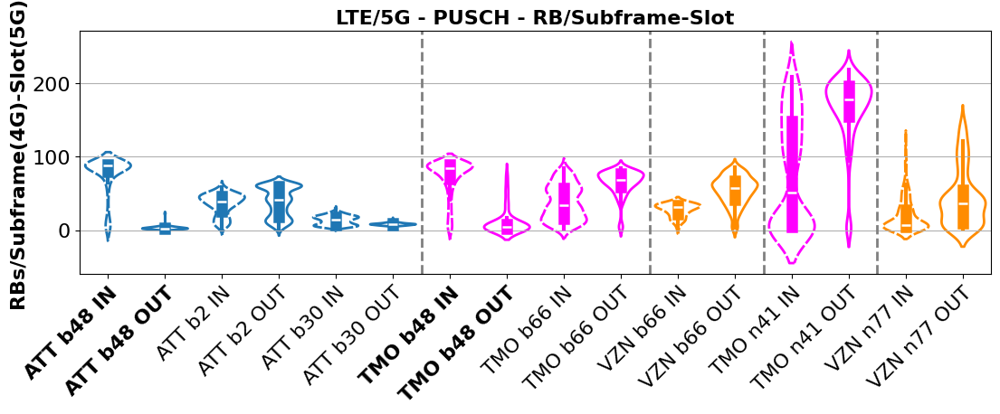

In [228]:
# LTE/5G - PUSCH - RB/Subframe-Slot
fig, ax = plt.subplots(figsize=(13, 3.5))
palette = ['tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'magenta', 'magenta', 'magenta', 'magenta', 'darkorange', 'darkorange', 'magenta', 'magenta', 'darkorange', 'darkorange']
data = pd.concat([
    df_lte_pusch_att_nh_in.assign(Collection_plot='ATT b48 IN'),
    df_lte_pusch_att_nh_out.assign(Collection_plot='ATT b48 OUT'),
    df_lte_pusch_att_mno_in[df_lte_pusch_att_mno_in['Band Number']==2].assign(Collection_plot='ATT b2 IN'),
    df_lte_pusch_att_mno_out[df_lte_pusch_att_mno_out['Band Number']==2].assign(Collection_plot='ATT b2 OUT'),
    df_lte_pusch_att_mno_in[df_lte_pusch_att_mno_in['Band Number']==30].assign(Collection_plot='ATT b30 IN'),
    df_lte_pusch_att_mno_out[df_lte_pusch_att_mno_out['Band Number']==30].assign(Collection_plot='ATT b30 OUT'),
    df_lte_pusch_tmo_nh_in.assign(Collection_plot='TMO b48 IN'),
    df_lte_pusch_tmo_nh_out.assign(Collection_plot='TMO b48 OUT'),
    # df_lte_pusch_tmo_mno_in[df_lte_pusch_tmo_mno_in['Band Number']==2].assign(Collection_plot='TMO b2 IN'),
    df_lte_pusch_tmo_mno_in[df_lte_pusch_tmo_mno_in['Band Number']==66].assign(Collection_plot='TMO b66 IN'),
    # df_lte_pusch_tmo_mno_out[df_lte_pusch_tmo_mno_out['Band Number']==2].assign(Collection_plot='TMO b2 OUT'),
    df_lte_pusch_tmo_mno_out[df_lte_pusch_tmo_mno_out['Band Number']==66].assign(Collection_plot='TMO b66 OUT'),
    # df_lte_pusch_vzn_mno_in[df_lte_pusch_vzn_mno_in['Band Number']==2].assign(Collection_plot='VZN b2 IN'),
    df_lte_pusch_vzn_mno_in[df_lte_pusch_vzn_mno_in['Band Number']==66].assign(Collection_plot='VZN b66 IN'),
    # df_lte_pusch_vzn_mno_out[df_lte_pusch_vzn_mno_out['Band Number']==2].assign(Collection_plot='VZN b2 OUT'),
    df_lte_pusch_vzn_mno_out[df_lte_pusch_vzn_mno_out['Band Number']==66].assign(Collection_plot='VZN b66 OUT'),
    df_5g_pusch_tmo_mno_in[df_5g_pusch_tmo_mno_in['Band Number']==41].assign(Collection_plot='TMO n41 IN'),
    df_5g_pusch_tmo_mno_out[df_5g_pusch_tmo_mno_out['Band Number']==41].assign(Collection_plot='TMO n41 OUT'),
    df_5g_pusch_vzn_mno_in[df_5g_pusch_vzn_mno_in['Band Number']==77].assign(Collection_plot='VZN n77 IN'),
    df_5g_pusch_vzn_mno_out[df_5g_pusch_vzn_mno_out['Band Number']==77].assign(Collection_plot='VZN n77 OUT'),
])
sns.violinplot(data=data, x='Collection_plot', y='RB per Subframe-Slot', hue='Collection_plot', palette=palette, fill=False, linewidth=2, ax=ax)
for i in range(0, 16, 2):
    ax.collections[i].set_linestyle((0,(5,1))) # for densly dashed lines
plt.axvline(x=5.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=9.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=11.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=13.5, color='gray', linestyle='--', linewidth=2)
plt.xticks(rotation=45, ha='right')
dx = 10 / 72
dy = 0 / 72
offset = ScaledTranslation(dx, dy, fig.dpi_scale_trans)
for label in ax.xaxis.get_majorticklabels():
    label.set_transform(label.get_transform() + offset)
labels = plt.gca().get_xticklabels()
for label in labels:
    if label.get_text() in ['ATT b48 IN', 'ATT b48 OUT', 'TMO b48 IN', 'TMO b48 OUT']:
        label.set_fontweight('bold')
plt.xlabel('')
plt.ylabel('RBs/Subframe(4G)-Slot(5G)', fontsize=16, fontweight='bold')
plt.title('LTE/5G - PUSCH - RB/Subframe-Slot', fontsize=16, fontweight='bold')
plt.grid(True, axis='y')
# plt.savefig('figs/josh_dl_tput_all_plot.png', bbox_inches='tight', dpi=300)
# plt.savefig('figs/josh_dl_tput_all_plot.pdf', bbox_inches='tight')
plt.show()
del fig, ax, dx, dy, offset, label, data, palette, labels

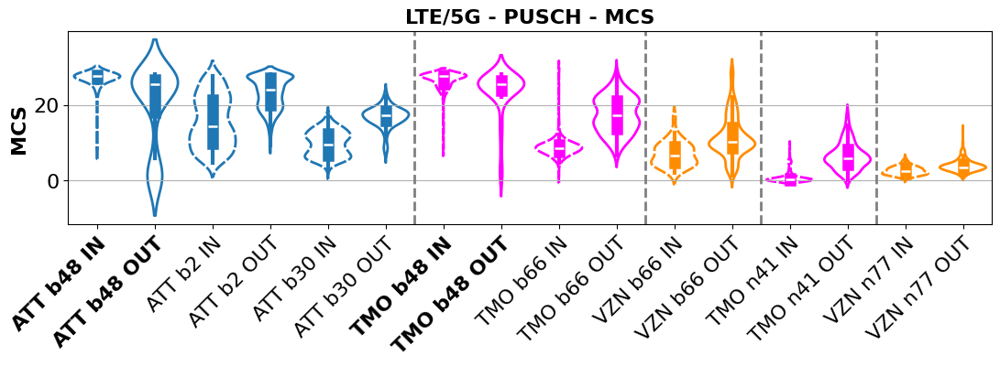

In [229]:
# LTE/5G - PUSCH - MCS
fig, ax = plt.subplots(figsize=(13, 2.75))
palette = ['tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'magenta', 'magenta', 'magenta', 'magenta', 'darkorange', 'darkorange', 'magenta', 'magenta', 'darkorange', 'darkorange']
data = pd.concat([
    df_lte_pusch_att_nh_in.assign(Collection_plot='ATT b48 IN'),
    df_lte_pusch_att_nh_out.assign(Collection_plot='ATT b48 OUT'),
    df_lte_pusch_att_mno_in[df_lte_pusch_att_mno_in['Band Number']==2].assign(Collection_plot='ATT b2 IN'),
    df_lte_pusch_att_mno_out[df_lte_pusch_att_mno_out['Band Number']==2].assign(Collection_plot='ATT b2 OUT'),
    df_lte_pusch_att_mno_in[df_lte_pusch_att_mno_in['Band Number']==30].assign(Collection_plot='ATT b30 IN'),
    df_lte_pusch_att_mno_out[df_lte_pusch_att_mno_out['Band Number']==30].assign(Collection_plot='ATT b30 OUT'),
    df_lte_pusch_tmo_nh_in.assign(Collection_plot='TMO b48 IN'),
    df_lte_pusch_tmo_nh_out.assign(Collection_plot='TMO b48 OUT'),
    # df_lte_pusch_tmo_mno_in[df_lte_pusch_tmo_mno_in['Band Number']==2].assign(Collection_plot='TMO b2 IN'),
    df_lte_pusch_tmo_mno_in[df_lte_pusch_tmo_mno_in['Band Number']==66].assign(Collection_plot='TMO b66 IN'),
    # df_lte_pusch_tmo_mno_out[df_lte_pusch_tmo_mno_out['Band Number']==2].assign(Collection_plot='TMO b2 OUT'),
    df_lte_pusch_tmo_mno_out[df_lte_pusch_tmo_mno_out['Band Number']==66].assign(Collection_plot='TMO b66 OUT'),
    # df_lte_pusch_vzn_mno_in[df_lte_pusch_vzn_mno_in['Band Number']==2].assign(Collection_plot='VZN b2 IN'),
    df_lte_pusch_vzn_mno_in[df_lte_pusch_vzn_mno_in['Band Number']==66].assign(Collection_plot='VZN b66 IN'),
    # df_lte_pusch_vzn_mno_out[df_lte_pusch_vzn_mno_out['Band Number']==2].assign(Collection_plot='VZN b2 OUT'),
    df_lte_pusch_vzn_mno_out[df_lte_pusch_vzn_mno_out['Band Number']==66].assign(Collection_plot='VZN b66 OUT'),
    df_5g_pusch_tmo_mno_in[df_5g_pusch_tmo_mno_in['Band Number']==41].assign(Collection_plot='TMO n41 IN'),
    df_5g_pusch_tmo_mno_out[df_5g_pusch_tmo_mno_out['Band Number']==41].assign(Collection_plot='TMO n41 OUT'),
    df_5g_pusch_vzn_mno_in[df_5g_pusch_vzn_mno_in['Band Number']==77].assign(Collection_plot='VZN n77 IN'),
    df_5g_pusch_vzn_mno_out[df_5g_pusch_vzn_mno_out['Band Number']==77].assign(Collection_plot='VZN n77 OUT'),
])
sns.violinplot(data=data.dropna(subset='MCS'), x='Collection_plot', y='MCS', hue='Collection_plot', palette=palette, fill=False, linewidth=2, ax=ax)
for i in range(0, 16, 2):
    ax.collections[i].set_linestyle((0,(5,1))) # for densly dashed lines
plt.axvline(x=5.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=9.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=11.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=13.5, color='gray', linestyle='--', linewidth=2)
plt.xticks(rotation=45, ha='right')
dx = 10 / 72
dy = 0 / 72
offset = ScaledTranslation(dx, dy, fig.dpi_scale_trans)
for label in ax.xaxis.get_majorticklabels():
    label.set_transform(label.get_transform() + offset)
labels = plt.gca().get_xticklabels()
for label in labels:
    if label.get_text() in ['ATT b48 IN', 'ATT b48 OUT', 'TMO b48 IN', 'TMO b48 OUT']:
        label.set_fontweight('bold')
plt.xlabel('')
plt.ylabel('MCS', fontsize=16, fontweight='bold')
plt.title('LTE/5G - PUSCH - MCS', fontsize=16, fontweight='bold')
plt.grid(True, axis='y')
# plt.savefig('figs/josh_dl_tput_all_plot.png', bbox_inches='tight', dpi=300)
# plt.savefig('figs/josh_dl_tput_all_plot.pdf', bbox_inches='tight')
plt.show()
del fig, ax, dx, dy, offset, label, data, palette, labels

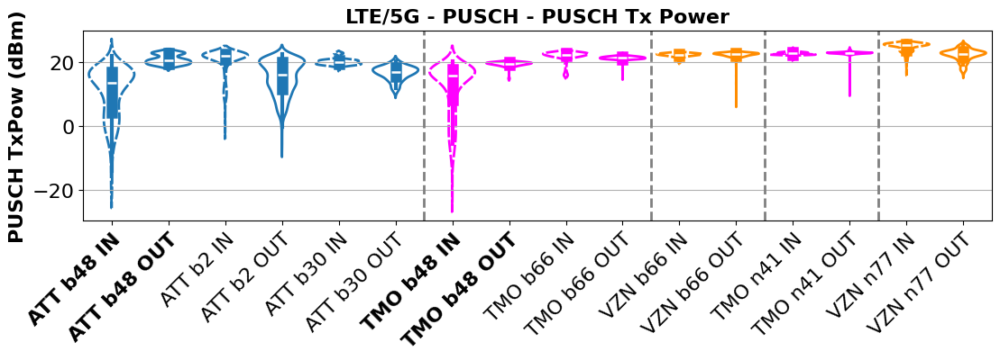

In [230]:
# LTE/5G - PUSCH - PUSCH Tx Power
fig, ax = plt.subplots(figsize=(13, 2.75))
palette = ['tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'magenta', 'magenta', 'magenta', 'magenta', 'darkorange', 'darkorange', 'magenta', 'magenta', 'darkorange', 'darkorange']
data = pd.concat([
    df_lte_pusch_att_nh_in.assign(Collection_plot='ATT b48 IN'),
    df_lte_pusch_att_nh_out.assign(Collection_plot='ATT b48 OUT'),
    df_lte_pusch_att_mno_in[df_lte_pusch_att_mno_in['Band Number']==2].assign(Collection_plot='ATT b2 IN'),
    df_lte_pusch_att_mno_out[df_lte_pusch_att_mno_out['Band Number']==2].assign(Collection_plot='ATT b2 OUT'),
    df_lte_pusch_att_mno_in[df_lte_pusch_att_mno_in['Band Number']==30].assign(Collection_plot='ATT b30 IN'),
    df_lte_pusch_att_mno_out[df_lte_pusch_att_mno_out['Band Number']==30].assign(Collection_plot='ATT b30 OUT'),
    df_lte_pusch_tmo_nh_in.assign(Collection_plot='TMO b48 IN'),
    df_lte_pusch_tmo_nh_out.assign(Collection_plot='TMO b48 OUT'),
    # df_lte_pusch_tmo_mno_in[df_lte_pusch_tmo_mno_in['Band Number']==2].assign(Collection_plot='TMO b2 IN'),
    df_lte_pusch_tmo_mno_in[df_lte_pusch_tmo_mno_in['Band Number']==66].assign(Collection_plot='TMO b66 IN'),
    # df_lte_pusch_tmo_mno_out[df_lte_pusch_tmo_mno_out['Band Number']==2].assign(Collection_plot='TMO b2 OUT'),
    df_lte_pusch_tmo_mno_out[df_lte_pusch_tmo_mno_out['Band Number']==66].assign(Collection_plot='TMO b66 OUT'),
    # df_lte_pusch_vzn_mno_in[df_lte_pusch_vzn_mno_in['Band Number']==2].assign(Collection_plot='VZN b2 IN'),
    df_lte_pusch_vzn_mno_in[df_lte_pusch_vzn_mno_in['Band Number']==66].assign(Collection_plot='VZN b66 IN'),
    # df_lte_pusch_vzn_mno_out[df_lte_pusch_vzn_mno_out['Band Number']==2].assign(Collection_plot='VZN b2 OUT'),
    df_lte_pusch_vzn_mno_out[df_lte_pusch_vzn_mno_out['Band Number']==66].assign(Collection_plot='VZN b66 OUT'),
    df_5g_pusch_tmo_mno_in[df_5g_pusch_tmo_mno_in['Band Number']==41].assign(Collection_plot='TMO n41 IN'),
    df_5g_pusch_tmo_mno_out[df_5g_pusch_tmo_mno_out['Band Number']==41].assign(Collection_plot='TMO n41 OUT'),
    df_5g_pusch_vzn_mno_in[df_5g_pusch_vzn_mno_in['Band Number']==77].assign(Collection_plot='VZN n77 IN'),
    df_5g_pusch_vzn_mno_out[df_5g_pusch_vzn_mno_out['Band Number']==77].assign(Collection_plot='VZN n77 OUT'),
])
sns.violinplot(data=data.dropna(subset='PUSCH Tx Power'), x='Collection_plot', y='PUSCH Tx Power', hue='Collection_plot', palette=palette, fill=False, linewidth=2, ax=ax)
for i in range(0, 16, 2):
    ax.collections[i].set_linestyle((0,(5,1))) # for densly dashed lines
plt.axvline(x=5.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=9.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=11.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=13.5, color='gray', linestyle='--', linewidth=2)
plt.xticks(rotation=45, ha='right')
dx = 10 / 72
dy = 0 / 72
offset = ScaledTranslation(dx, dy, fig.dpi_scale_trans)
for label in ax.xaxis.get_majorticklabels():
    label.set_transform(label.get_transform() + offset)
labels = plt.gca().get_xticklabels()
for label in labels:
    if label.get_text() in ['ATT b48 IN', 'ATT b48 OUT', 'TMO b48 IN', 'TMO b48 OUT']:
        label.set_fontweight('bold')
plt.xlabel('')
plt.ylabel('PUSCH TxPow (dBm)', fontsize=16, fontweight='bold')
plt.title('LTE/5G - PUSCH - PUSCH Tx Power', fontsize=16, fontweight='bold')
plt.grid(True, axis='y')
# plt.savefig('figs/josh_dl_tput_all_plot.png', bbox_inches='tight', dpi=300)
# plt.savefig('figs/josh_dl_tput_all_plot.pdf', bbox_inches='tight')
plt.show()
del fig, ax, dx, dy, offset, label, data, palette, labels

##### print(): PCI statistics

Summary of Representative PCIs:

NH IN - AP 1 - PCI 4,7

NH OUT - AP 6 - PCI 8,15

ATT b2,30 - PCI 77

TMO b66 - PCI 294

VZN b66 - PCI 357

TMO n41 - PCI 681

VZN n77 - PCI 357

In [223]:
print('LTE ATT NH IN')
print(df_lte_pusch_att_nh_in[['Band Number', 'PCI']].value_counts().sort_index())
print('LTE ATT NH OUT')
print(df_lte_pusch_att_nh_out[['Band Number', 'PCI']].value_counts().sort_index())
print('LTE ATT MNO IN')
print(df_lte_pusch_att_mno_in[['Band Number', 'PCI']].value_counts().sort_index())
print('LTE ATT MNO OUT')
print(df_lte_pusch_att_mno_out[['Band Number', 'PCI']].value_counts().sort_index())

LTE ATT NH IN
Band Number  PCI
48           4      66
             8      22
             9       3
             13     69
             20     11
             23     63
             25     27
Name: count, dtype: int64
LTE ATT NH OUT
Band Number  PCI
48           7      46
             8      22
Name: count, dtype: int64
LTE ATT MNO IN
Band Number  PCI
2            77      61
             80       4
             422     27
             430    395
12           77      64
             80      17
             81      43
             149      4
14           81      63
30           77     271
Name: count, dtype: int64
LTE ATT MNO OUT
Band Number  PCI
2            77     308
             430    723
30           77     151
Name: count, dtype: int64


In [224]:
print('LTE TMO NH IN')
print(df_lte_pusch_tmo_nh_in[['Band Number', 'PCI']].value_counts().sort_index())
print('LTE TMO NH OUT')
print(df_lte_pusch_tmo_nh_out[['Band Number', 'PCI']].value_counts().sort_index())
print('LTE TMO MNO IN')
print(df_lte_pusch_tmo_mno_in[['Band Number', 'PCI']].value_counts().sort_index())
print('LTE TMO MNO OUT')
print(df_lte_pusch_tmo_mno_out[['Band Number', 'PCI']].value_counts().sort_index())

LTE TMO NH IN
Band Number  PCI
48           4      160
             8       44
             9       22
             13     124
             23      88
             25      27
Name: count, dtype: int64
LTE TMO NH OUT
Band Number  PCI
48           4      43
             8      21
Name: count, dtype: int64
LTE TMO MNO IN
Band Number  PCI
2            462      9
66           294    232
             330    280
Name: count, dtype: int64
LTE TMO MNO OUT
Band Number  PCI
66           294    173
             330    162
Name: count, dtype: int64


In [225]:
print('LTE VZN MNO IN')
print(df_lte_pusch_vzn_mno_in[['Band Number', 'PCI']].value_counts().sort_index())
print('LTE VZN MNO OUT')
print(df_lte_pusch_vzn_mno_out[['Band Number', 'PCI']].value_counts().sort_index())

LTE VZN MNO IN
Band Number  PCI
5            357    235
13           125     92
             155     37
             318     22
             357    147
66           357     42
Name: count, dtype: int64
LTE VZN MNO OUT
Band Number  PCI
66           125    375
             357    257
Name: count, dtype: int64


In [226]:
print('5G TMO MNO IN')
print(df_5g_pusch_tmo_mno_in[['Band Number', 'PCI']].value_counts().sort_index())
print('5G TMO MNO OUT')
print(df_5g_pusch_tmo_mno_out[['Band Number', 'PCI']].value_counts().sort_index())
print('5G VZN MNO IN')
print(df_5g_pusch_vzn_mno_in[['Band Number', 'PCI']].value_counts().sort_index())
print('5G VZN MNO OUT')
print(df_5g_pusch_vzn_mno_out[['Band Number', 'PCI']].value_counts().sort_index())

5G TMO MNO IN
Band Number  PCI  
25.0         447.0     95
             585.0    430
41.0         681.0    321
Name: count, dtype: int64
5G TMO MNO OUT
Band Number  PCI  
25.0         447.0    167
             585.0     21
41.0         681.0    612
Name: count, dtype: int64
5G VZN MNO IN
Band Number  PCI  
77.0         357.0    239
Name: count, dtype: int64
5G VZN MNO OUT
Band Number  PCI  
77.0         357.0    334
Name: count, dtype: int64


##### Plots: PCI specific

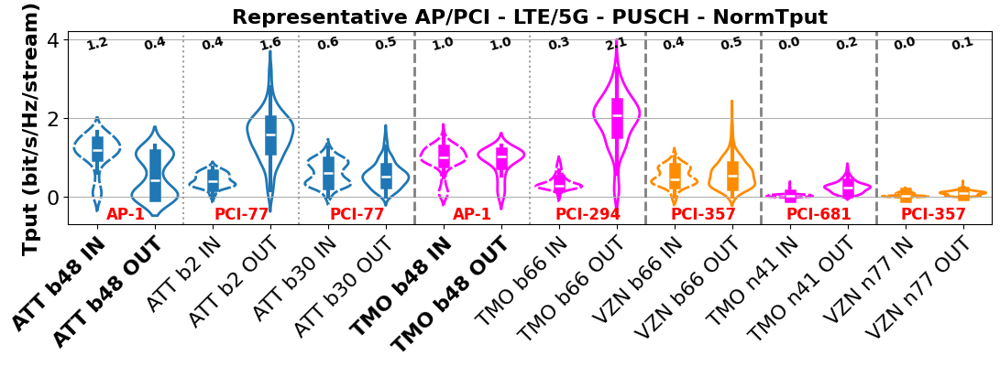

In [235]:
# LTE/5G - PUSCH - NormTput
fig, ax = plt.subplots(figsize=(13, 2.75))
palette = ['tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'magenta', 'magenta', 'magenta', 'magenta', 'darkorange', 'darkorange', 'magenta', 'magenta', 'darkorange', 'darkorange']
data = pd.concat([
    df_lte_pusch_att_nh_in[df_lte_pusch_att_nh_in['PCI'].isin([4, 7])].assign(Collection_plot='ATT b48 IN'),
    df_lte_pusch_att_nh_out[df_lte_pusch_att_nh_out['PCI'].isin([4, 7])].assign(Collection_plot='ATT b48 OUT'),
    df_lte_pusch_att_mno_in[(df_lte_pusch_att_mno_in['Band Number'] == 2) & (df_lte_pusch_att_mno_in['PCI'] == 77)].assign(Collection_plot='ATT b2 IN'),
    df_lte_pusch_att_mno_out[(df_lte_pusch_att_mno_out['Band Number'] == 2) & (df_lte_pusch_att_mno_out['PCI'] == 77)].assign(Collection_plot='ATT b2 OUT'),
    df_lte_pusch_att_mno_in[(df_lte_pusch_att_mno_in['Band Number'] == 30) & (df_lte_pusch_att_mno_in['PCI'] == 77)].assign(Collection_plot='ATT b30 IN'),
    df_lte_pusch_att_mno_out[(df_lte_pusch_att_mno_out['Band Number'] == 30) & (df_lte_pusch_att_mno_out['PCI'] == 77)].assign(Collection_plot='ATT b30 OUT'),
    df_lte_pusch_tmo_nh_in[df_lte_pusch_tmo_nh_in['PCI'].isin([4, 7])].assign(Collection_plot='TMO b48 IN'),
    df_lte_pusch_tmo_nh_out[df_lte_pusch_tmo_nh_out['PCI'].isin([4, 7])].assign(Collection_plot='TMO b48 OUT'),
    df_lte_pusch_tmo_mno_in[(df_lte_pusch_tmo_mno_in['Band Number']==66) & (df_lte_pusch_tmo_mno_in['PCI'] == 294)].assign(Collection_plot='TMO b66 IN'),
    df_lte_pusch_tmo_mno_out[(df_lte_pusch_tmo_mno_out['Band Number']==66) & (df_lte_pusch_tmo_mno_out['PCI'] == 294)].assign(Collection_plot='TMO b66 OUT'),
    df_lte_pusch_vzn_mno_in[(df_lte_pusch_vzn_mno_in['Band Number'] == 66) & (df_lte_pusch_vzn_mno_in['PCI'] == 357)].assign(Collection_plot='VZN b66 IN'),
    df_lte_pusch_vzn_mno_out[(df_lte_pusch_vzn_mno_out['Band Number'] == 66) & (df_lte_pusch_vzn_mno_out['PCI'] == 357)].assign(Collection_plot='VZN b66 OUT'),
    df_5g_pusch_tmo_mno_in[(df_5g_pusch_tmo_mno_in['Band Number']==41) & (df_5g_pusch_tmo_mno_in['PCI']==681)].rename(columns={'SS-RSRP': 'RSRP'}).assign(Collection_plot='TMO n41 IN'),
    df_5g_pusch_tmo_mno_out[(df_5g_pusch_tmo_mno_out['Band Number']==41) & (df_5g_pusch_tmo_mno_out['PCI']==681)].rename(columns={'SS-RSRP': 'RSRP'}).assign(Collection_plot='TMO n41 OUT'),
    df_5g_pusch_vzn_mno_in[(df_5g_pusch_vzn_mno_in['Band Number']==77) & (df_5g_pusch_vzn_mno_in['PCI']==357)].rename(columns={'SS-RSRP': 'RSRP'}).assign(Collection_plot='VZN n77 IN'),
    df_5g_pusch_vzn_mno_out[(df_5g_pusch_vzn_mno_out['Band Number']==77) & (df_5g_pusch_vzn_mno_out['PCI']==357)].rename(columns={'SS-RSRP': 'RSRP'}).assign(Collection_plot='VZN n77 OUT')
])
sns.violinplot(data=data, x='Collection_plot', y='Normalized Throughput', hue='Collection_plot', palette=palette, fill=False, linewidth=2, ax=ax)
for i in range(0, 16, 2):
    ax.collections[i].set_linestyle((0,(5,1))) # for densly dashed lines
plt.axvline(x=5.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=9.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=11.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=13.5, color='gray', linestyle='--', linewidth=2)

plt.axvline(x=1.5, color='gray', linestyle=':', linewidth=1.5, alpha=0.75)
plt.axvline(x=3.5, color='gray', linestyle=':', linewidth=1.5, alpha=0.75)
plt.axvline(x=7.5, color='gray', linestyle=':', linewidth=1.5, alpha=0.75)
ax.text(1/16, 0.05, 'AP-1', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(3/16, 0.05, 'PCI-77', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(5/16, 0.05, 'PCI-77', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(7/16, 0.05, 'AP-1', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(9/16, 0.05, 'PCI-294', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(11/16, 0.05, 'PCI-357', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(13/16, 0.05, 'PCI-681', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(15/16, 0.05, 'PCI-357', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
medians = data.groupby('Collection_plot')['Normalized Throughput'].median()
for i, collection in enumerate(data['Collection_plot'].unique()):
    median_value = medians[collection]
    ax.text(i, 3.75, f'{median_value:.1f}', horizontalalignment='center', color='black', fontsize=10, fontweight='bold', rotation=15)

plt.xticks(rotation=45, ha='right')
dx = 10 / 72
dy = 0 / 72
offset = ScaledTranslation(dx, dy, fig.dpi_scale_trans)
for label in ax.xaxis.get_majorticklabels():
    label.set_transform(label.get_transform() + offset)
labels = plt.gca().get_xticklabels()
for label in labels:
    if label.get_text() in ['ATT b48 IN', 'ATT b48 OUT', 'TMO b48 IN', 'TMO b48 OUT']:
        label.set_fontweight('bold')
plt.xlabel('')
plt.ylabel('Tput (bit/s/Hz/stream)', fontsize=16, fontweight='bold')
plt.title('Representative AP/PCI - LTE/5G - PUSCH - NormTput', fontsize=16, fontweight='bold')
plt.grid(True, axis='y')
# plt.savefig('figs/josh_dl_tput_all_plot.png', bbox_inches='tight', dpi=300)
# plt.savefig('figs/josh_dl_tput_all_plot.pdf', bbox_inches='tight')
plt.show()
del fig, ax, dx, dy, offset, label, data, palette, labels

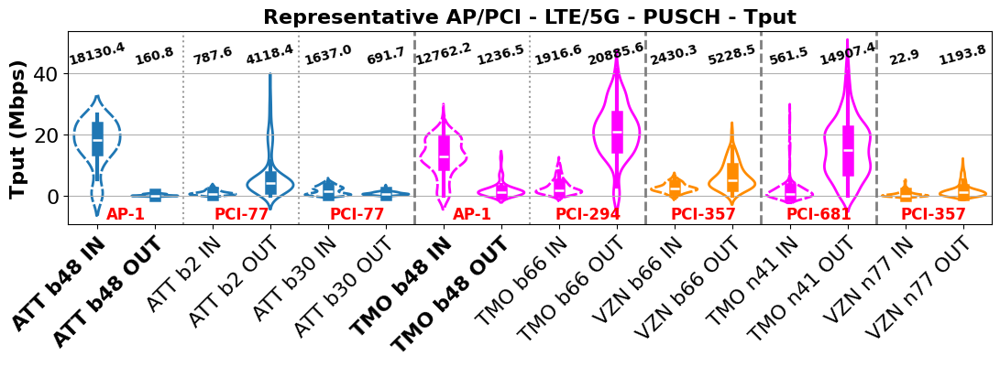

In [239]:
# LTE/5G - PUSCH - Tput
fig, ax = plt.subplots(figsize=(13, 2.75))
palette = ['tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'magenta', 'magenta', 'magenta', 'magenta', 'darkorange', 'darkorange', 'magenta', 'magenta', 'darkorange', 'darkorange']
data = pd.concat([
    df_lte_pusch_att_nh_in[df_lte_pusch_att_nh_in['PCI'].isin([4, 7])].assign(Collection_plot='ATT b48 IN'),
    df_lte_pusch_att_nh_out[df_lte_pusch_att_nh_out['PCI'].isin([4, 7])].assign(Collection_plot='ATT b48 OUT'),
    df_lte_pusch_att_mno_in[(df_lte_pusch_att_mno_in['Band Number'] == 2) & (df_lte_pusch_att_mno_in['PCI'] == 77)].assign(Collection_plot='ATT b2 IN'),
    df_lte_pusch_att_mno_out[(df_lte_pusch_att_mno_out['Band Number'] == 2) & (df_lte_pusch_att_mno_out['PCI'] == 77)].assign(Collection_plot='ATT b2 OUT'),
    df_lte_pusch_att_mno_in[(df_lte_pusch_att_mno_in['Band Number'] == 30) & (df_lte_pusch_att_mno_in['PCI'] == 77)].assign(Collection_plot='ATT b30 IN'),
    df_lte_pusch_att_mno_out[(df_lte_pusch_att_mno_out['Band Number'] == 30) & (df_lte_pusch_att_mno_out['PCI'] == 77)].assign(Collection_plot='ATT b30 OUT'),
    df_lte_pusch_tmo_nh_in[df_lte_pusch_tmo_nh_in['PCI'].isin([4, 7])].assign(Collection_plot='TMO b48 IN'),
    df_lte_pusch_tmo_nh_out[df_lte_pusch_tmo_nh_out['PCI'].isin([4, 7])].assign(Collection_plot='TMO b48 OUT'),
    df_lte_pusch_tmo_mno_in[(df_lte_pusch_tmo_mno_in['Band Number']==66) & (df_lte_pusch_tmo_mno_in['PCI'] == 294)].assign(Collection_plot='TMO b66 IN'),
    df_lte_pusch_tmo_mno_out[(df_lte_pusch_tmo_mno_out['Band Number']==66) & (df_lte_pusch_tmo_mno_out['PCI'] == 294)].assign(Collection_plot='TMO b66 OUT'),
    df_lte_pusch_vzn_mno_in[(df_lte_pusch_vzn_mno_in['Band Number'] == 66) & (df_lte_pusch_vzn_mno_in['PCI'] == 357)].assign(Collection_plot='VZN b66 IN'),
    df_lte_pusch_vzn_mno_out[(df_lte_pusch_vzn_mno_out['Band Number'] == 66) & (df_lte_pusch_vzn_mno_out['PCI'] == 357)].assign(Collection_plot='VZN b66 OUT'),
    df_5g_pusch_tmo_mno_in[(df_5g_pusch_tmo_mno_in['Band Number']==41) & (df_5g_pusch_tmo_mno_in['PCI']==681)].rename(columns={'SS-RSRP': 'RSRP'}).assign(Collection_plot='TMO n41 IN'),
    df_5g_pusch_tmo_mno_out[(df_5g_pusch_tmo_mno_out['Band Number']==41) & (df_5g_pusch_tmo_mno_out['PCI']==681)].rename(columns={'SS-RSRP': 'RSRP'}).assign(Collection_plot='TMO n41 OUT'),
    df_5g_pusch_vzn_mno_in[(df_5g_pusch_vzn_mno_in['Band Number']==77) & (df_5g_pusch_vzn_mno_in['PCI']==357)].rename(columns={'SS-RSRP': 'RSRP'}).assign(Collection_plot='VZN n77 IN'),
    df_5g_pusch_vzn_mno_out[(df_5g_pusch_vzn_mno_out['Band Number']==77) & (df_5g_pusch_vzn_mno_out['PCI']==357)].rename(columns={'SS-RSRP': 'RSRP'}).assign(Collection_plot='VZN n77 OUT')
])
sns.violinplot(data=data, x='Collection_plot', y='Net PUSCH Throughput', hue='Collection_plot', palette=palette, fill=False, linewidth=2, ax=ax)
for i in range(0, 16, 2):
    ax.collections[i].set_linestyle((0,(5,1))) # for densly dashed lines
plt.axvline(x=5.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=9.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=11.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=13.5, color='gray', linestyle='--', linewidth=2)

plt.axvline(x=1.5, color='gray', linestyle=':', linewidth=1.5, alpha=0.75)
plt.axvline(x=3.5, color='gray', linestyle=':', linewidth=1.5, alpha=0.75)
plt.axvline(x=7.5, color='gray', linestyle=':', linewidth=1.5, alpha=0.75)
ax.text(1/16, 0.05, 'AP-1', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(3/16, 0.05, 'PCI-77', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(5/16, 0.05, 'PCI-77', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(7/16, 0.05, 'AP-1', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(9/16, 0.05, 'PCI-294', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(11/16, 0.05, 'PCI-357', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(13/16, 0.05, 'PCI-681', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(15/16, 0.05, 'PCI-357', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
medians = data.groupby('Collection_plot')['Net PUSCH Throughput'].median()
for i, collection in enumerate(data['Collection_plot'].unique()):
    median_value = medians[collection]
    ax.text(i, 43e3, f'{median_value:.1f}', horizontalalignment='center', color='black', fontsize=10, fontweight='bold', rotation=15)

plt.xticks(rotation=45, ha='right')
dx = 10 / 72
dy = 0 / 72
offset = ScaledTranslation(dx, dy, fig.dpi_scale_trans)
for label in ax.xaxis.get_majorticklabels():
    label.set_transform(label.get_transform() + offset)
labels = plt.gca().get_xticklabels()
for label in labels:
    if label.get_text() in ['ATT b48 IN', 'ATT b48 OUT', 'TMO b48 IN', 'TMO b48 OUT']:
        label.set_fontweight('bold')
plt.xlabel('')
plt.ylabel('Tput (Mbps)', fontsize=16, fontweight='bold')
plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{int(y/1e3)}'))
plt.title('Representative AP/PCI - LTE/5G - PUSCH - Tput', fontsize=16, fontweight='bold')
plt.grid(True, axis='y')
# plt.savefig('figs/josh_dl_tput_all_plot.png', bbox_inches='tight', dpi=300)
# plt.savefig('figs/josh_dl_tput_all_plot.pdf', bbox_inches='tight')
plt.show()
del fig, ax, dx, dy, offset, label, data, palette, labels

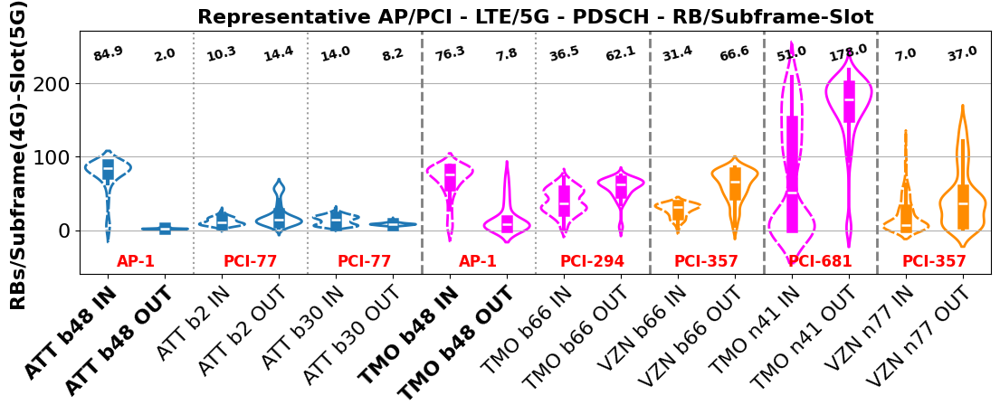

In [242]:
# LTE/5G - PDSCH - RB/Subframe-Slot
fig, ax = plt.subplots(figsize=(13, 3.5))
palette = ['tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'magenta', 'magenta', 'magenta', 'magenta', 'darkorange', 'darkorange', 'magenta', 'magenta', 'darkorange', 'darkorange']
data = pd.concat([
    df_lte_pusch_att_nh_in[df_lte_pusch_att_nh_in['PCI'].isin([4, 7])].assign(Collection_plot='ATT b48 IN'),
    df_lte_pusch_att_nh_out[df_lte_pusch_att_nh_out['PCI'].isin([4, 7])].assign(Collection_plot='ATT b48 OUT'),
    df_lte_pusch_att_mno_in[(df_lte_pusch_att_mno_in['Band Number'] == 2) & (df_lte_pusch_att_mno_in['PCI'] == 77)].assign(Collection_plot='ATT b2 IN'),
    df_lte_pusch_att_mno_out[(df_lte_pusch_att_mno_out['Band Number'] == 2) & (df_lte_pusch_att_mno_out['PCI'] == 77)].assign(Collection_plot='ATT b2 OUT'),
    df_lte_pusch_att_mno_in[(df_lte_pusch_att_mno_in['Band Number'] == 30) & (df_lte_pusch_att_mno_in['PCI'] == 77)].assign(Collection_plot='ATT b30 IN'),
    df_lte_pusch_att_mno_out[(df_lte_pusch_att_mno_out['Band Number'] == 30) & (df_lte_pusch_att_mno_out['PCI'] == 77)].assign(Collection_plot='ATT b30 OUT'),
    df_lte_pusch_tmo_nh_in[df_lte_pusch_tmo_nh_in['PCI'].isin([4, 7])].assign(Collection_plot='TMO b48 IN'),
    df_lte_pusch_tmo_nh_out[df_lte_pusch_tmo_nh_out['PCI'].isin([4, 7])].assign(Collection_plot='TMO b48 OUT'),
    df_lte_pusch_tmo_mno_in[(df_lte_pusch_tmo_mno_in['Band Number']==66) & (df_lte_pusch_tmo_mno_in['PCI'] == 294)].assign(Collection_plot='TMO b66 IN'),
    df_lte_pusch_tmo_mno_out[(df_lte_pusch_tmo_mno_out['Band Number']==66) & (df_lte_pusch_tmo_mno_out['PCI'] == 294)].assign(Collection_plot='TMO b66 OUT'),
    df_lte_pusch_vzn_mno_in[(df_lte_pusch_vzn_mno_in['Band Number'] == 66) & (df_lte_pusch_vzn_mno_in['PCI'] == 357)].assign(Collection_plot='VZN b66 IN'),
    df_lte_pusch_vzn_mno_out[(df_lte_pusch_vzn_mno_out['Band Number'] == 66) & (df_lte_pusch_vzn_mno_out['PCI'] == 357)].assign(Collection_plot='VZN b66 OUT'),
    df_5g_pusch_tmo_mno_in[(df_5g_pusch_tmo_mno_in['Band Number']==41) & (df_5g_pusch_tmo_mno_in['PCI']==681)].rename(columns={'SS-RSRP': 'RSRP'}).assign(Collection_plot='TMO n41 IN'),
    df_5g_pusch_tmo_mno_out[(df_5g_pusch_tmo_mno_out['Band Number']==41) & (df_5g_pusch_tmo_mno_out['PCI']==681)].rename(columns={'SS-RSRP': 'RSRP'}).assign(Collection_plot='TMO n41 OUT'),
    df_5g_pusch_vzn_mno_in[(df_5g_pusch_vzn_mno_in['Band Number']==77) & (df_5g_pusch_vzn_mno_in['PCI']==357)].rename(columns={'SS-RSRP': 'RSRP'}).assign(Collection_plot='VZN n77 IN'),
    df_5g_pusch_vzn_mno_out[(df_5g_pusch_vzn_mno_out['Band Number']==77) & (df_5g_pusch_vzn_mno_out['PCI']==357)].rename(columns={'SS-RSRP': 'RSRP'}).assign(Collection_plot='VZN n77 OUT')
])
sns.violinplot(data=data, x='Collection_plot', y='RB per Subframe-Slot', hue='Collection_plot', palette=palette, fill=False, linewidth=2, ax=ax)
for i in range(0, 16, 2):
    ax.collections[i].set_linestyle((0,(5,1))) # for densly dashed lines
plt.axvline(x=5.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=9.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=11.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=13.5, color='gray', linestyle='--', linewidth=2)

plt.axvline(x=1.5, color='gray', linestyle=':', linewidth=1.5, alpha=0.75)
plt.axvline(x=3.5, color='gray', linestyle=':', linewidth=1.5, alpha=0.75)
plt.axvline(x=7.5, color='gray', linestyle=':', linewidth=1.5, alpha=0.75)
ax.text(1/16, 0.05, 'AP-1', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(3/16, 0.05, 'PCI-77', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(5/16, 0.05, 'PCI-77', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(7/16, 0.05, 'AP-1', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(9/16, 0.05, 'PCI-294', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(11/16, 0.05, 'PCI-357', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(13/16, 0.05, 'PCI-681', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(15/16, 0.05, 'PCI-357', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
medians = data.groupby('Collection_plot')['RB per Subframe-Slot'].median()
for i, collection in enumerate(data['Collection_plot'].unique()):
    median_value = medians[collection]
    ax.text(i, 230, f'{median_value:.1f}', horizontalalignment='center', color='black', fontsize=10, fontweight='bold', rotation=15)

plt.xticks(rotation=45, ha='right')
dx = 10 / 72
dy = 0 / 72
offset = ScaledTranslation(dx, dy, fig.dpi_scale_trans)
for label in ax.xaxis.get_majorticklabels():
    label.set_transform(label.get_transform() + offset)
labels = plt.gca().get_xticklabels()
for label in labels:
    if label.get_text() in ['ATT b48 IN', 'ATT b48 OUT', 'TMO b48 IN', 'TMO b48 OUT']:
        label.set_fontweight('bold')
plt.xlabel('')
plt.ylabel('RBs/Subframe(4G)-Slot(5G)', fontsize=16, fontweight='bold')
plt.title('Representative AP/PCI - LTE/5G - PDSCH - RB/Subframe-Slot', fontsize=16, fontweight='bold')
plt.grid(True, axis='y')
# plt.savefig('figs/josh_dl_tput_all_plot.png', bbox_inches='tight', dpi=300)
# plt.savefig('figs/josh_dl_tput_all_plot.pdf', bbox_inches='tight')
plt.show()
del fig, ax, dx, dy, offset, label, data, palette, labels

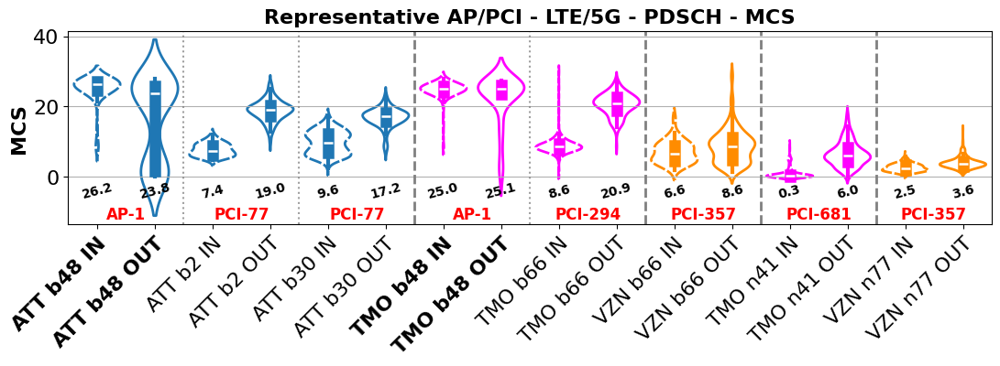

In [246]:
# LTE/5G - PDSCH - MCS
fig, ax = plt.subplots(figsize=(13, 2.75))
palette = ['tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'magenta', 'magenta', 'magenta', 'magenta', 'darkorange', 'darkorange', 'magenta', 'magenta', 'darkorange', 'darkorange']
data = pd.concat([
    df_lte_pusch_att_nh_in[df_lte_pusch_att_nh_in['PCI'].isin([4, 7])].assign(Collection_plot='ATT b48 IN'),
    df_lte_pusch_att_nh_out[df_lte_pusch_att_nh_out['PCI'].isin([4, 7])].assign(Collection_plot='ATT b48 OUT'),
    df_lte_pusch_att_mno_in[(df_lte_pusch_att_mno_in['Band Number'] == 2) & (df_lte_pusch_att_mno_in['PCI'] == 77)].assign(Collection_plot='ATT b2 IN'),
    df_lte_pusch_att_mno_out[(df_lte_pusch_att_mno_out['Band Number'] == 2) & (df_lte_pusch_att_mno_out['PCI'] == 77)].assign(Collection_plot='ATT b2 OUT'),
    df_lte_pusch_att_mno_in[(df_lte_pusch_att_mno_in['Band Number'] == 30) & (df_lte_pusch_att_mno_in['PCI'] == 77)].assign(Collection_plot='ATT b30 IN'),
    df_lte_pusch_att_mno_out[(df_lte_pusch_att_mno_out['Band Number'] == 30) & (df_lte_pusch_att_mno_out['PCI'] == 77)].assign(Collection_plot='ATT b30 OUT'),
    df_lte_pusch_tmo_nh_in[df_lte_pusch_tmo_nh_in['PCI'].isin([4, 7])].assign(Collection_plot='TMO b48 IN'),
    df_lte_pusch_tmo_nh_out[df_lte_pusch_tmo_nh_out['PCI'].isin([4, 7])].assign(Collection_plot='TMO b48 OUT'),
    df_lte_pusch_tmo_mno_in[(df_lte_pusch_tmo_mno_in['Band Number']==66) & (df_lte_pusch_tmo_mno_in['PCI'] == 294)].assign(Collection_plot='TMO b66 IN'),
    df_lte_pusch_tmo_mno_out[(df_lte_pusch_tmo_mno_out['Band Number']==66) & (df_lte_pusch_tmo_mno_out['PCI'] == 294)].assign(Collection_plot='TMO b66 OUT'),
    df_lte_pusch_vzn_mno_in[(df_lte_pusch_vzn_mno_in['Band Number'] == 66) & (df_lte_pusch_vzn_mno_in['PCI'] == 357)].assign(Collection_plot='VZN b66 IN'),
    df_lte_pusch_vzn_mno_out[(df_lte_pusch_vzn_mno_out['Band Number'] == 66) & (df_lte_pusch_vzn_mno_out['PCI'] == 357)].assign(Collection_plot='VZN b66 OUT'),
    df_5g_pusch_tmo_mno_in[(df_5g_pusch_tmo_mno_in['Band Number']==41) & (df_5g_pusch_tmo_mno_in['PCI']==681)].rename(columns={'SS-RSRP': 'RSRP'}).assign(Collection_plot='TMO n41 IN'),
    df_5g_pusch_tmo_mno_out[(df_5g_pusch_tmo_mno_out['Band Number']==41) & (df_5g_pusch_tmo_mno_out['PCI']==681)].rename(columns={'SS-RSRP': 'RSRP'}).assign(Collection_plot='TMO n41 OUT'),
    df_5g_pusch_vzn_mno_in[(df_5g_pusch_vzn_mno_in['Band Number']==77) & (df_5g_pusch_vzn_mno_in['PCI']==357)].rename(columns={'SS-RSRP': 'RSRP'}).assign(Collection_plot='VZN n77 IN'),
    df_5g_pusch_vzn_mno_out[(df_5g_pusch_vzn_mno_out['Band Number']==77) & (df_5g_pusch_vzn_mno_out['PCI']==357)].rename(columns={'SS-RSRP': 'RSRP'}).assign(Collection_plot='VZN n77 OUT')
])
sns.violinplot(data=data.dropna(subset='MCS'), x='Collection_plot', y='MCS', hue='Collection_plot', palette=palette, fill=False, linewidth=2, ax=ax)
for i in range(0, 16, 2):
    ax.collections[i].set_linestyle((0,(5,1))) # for densly dashed lines
plt.axvline(x=5.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=9.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=11.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=13.5, color='gray', linestyle='--', linewidth=2)

plt.axvline(x=1.5, color='gray', linestyle=':', linewidth=1.5, alpha=0.75)
plt.axvline(x=3.5, color='gray', linestyle=':', linewidth=1.5, alpha=0.75)
plt.axvline(x=7.5, color='gray', linestyle=':', linewidth=1.5, alpha=0.75)
ax.text(1/16, 0.05, 'AP-1', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(3/16, 0.05, 'PCI-77', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(5/16, 0.05, 'PCI-77', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(7/16, 0.05, 'AP-1', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(9/16, 0.05, 'PCI-294', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(11/16, 0.05, 'PCI-357', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(13/16, 0.05, 'PCI-681', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(15/16, 0.05, 'PCI-357', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
medians = data.groupby('Collection_plot')['MCS'].median()
for i, collection in enumerate(data['Collection_plot'].unique()):
    median_value = medians[collection]
    ax.text(i, -6, f'{median_value:.1f}', horizontalalignment='center', color='black', fontsize=10, fontweight='bold', rotation=15)

plt.xticks(rotation=45, ha='right')
dx = 10 / 72
dy = 0 / 72
offset = ScaledTranslation(dx, dy, fig.dpi_scale_trans)
for label in ax.xaxis.get_majorticklabels():
    label.set_transform(label.get_transform() + offset)
labels = plt.gca().get_xticklabels()
for label in labels:
    if label.get_text() in ['ATT b48 IN', 'ATT b48 OUT', 'TMO b48 IN', 'TMO b48 OUT']:
        label.set_fontweight('bold')
plt.xlabel('')
plt.ylabel('MCS', fontsize=16, fontweight='bold')
plt.title('Representative AP/PCI - LTE/5G - PDSCH - MCS', fontsize=16, fontweight='bold')
plt.grid(True, axis='y')
# plt.savefig('figs/josh_dl_tput_all_plot.png', bbox_inches='tight', dpi=300)
# plt.savefig('figs/josh_dl_tput_all_plot.pdf', bbox_inches='tight')
plt.show()
del fig, ax, dx, dy, offset, label, data, palette, labels

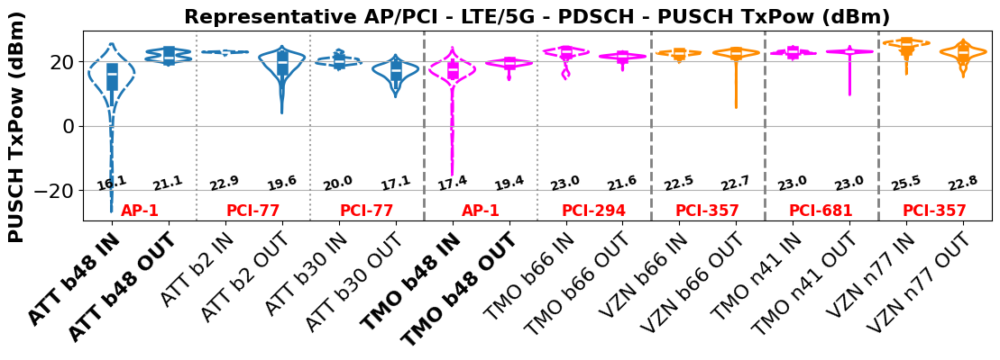

In [247]:
# LTE/5G - PDSCH - PUSCH Tx Power
fig, ax = plt.subplots(figsize=(13, 2.75))
palette = ['tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'tab:blue', 'magenta', 'magenta', 'magenta', 'magenta', 'darkorange', 'darkorange', 'magenta', 'magenta', 'darkorange', 'darkorange']
data = pd.concat([
    df_lte_pusch_att_nh_in[df_lte_pusch_att_nh_in['PCI'].isin([4, 7])].assign(Collection_plot='ATT b48 IN'),
    df_lte_pusch_att_nh_out[df_lte_pusch_att_nh_out['PCI'].isin([4, 7])].assign(Collection_plot='ATT b48 OUT'),
    df_lte_pusch_att_mno_in[(df_lte_pusch_att_mno_in['Band Number'] == 2) & (df_lte_pusch_att_mno_in['PCI'] == 77)].assign(Collection_plot='ATT b2 IN'),
    df_lte_pusch_att_mno_out[(df_lte_pusch_att_mno_out['Band Number'] == 2) & (df_lte_pusch_att_mno_out['PCI'] == 77)].assign(Collection_plot='ATT b2 OUT'),
    df_lte_pusch_att_mno_in[(df_lte_pusch_att_mno_in['Band Number'] == 30) & (df_lte_pusch_att_mno_in['PCI'] == 77)].assign(Collection_plot='ATT b30 IN'),
    df_lte_pusch_att_mno_out[(df_lte_pusch_att_mno_out['Band Number'] == 30) & (df_lte_pusch_att_mno_out['PCI'] == 77)].assign(Collection_plot='ATT b30 OUT'),
    df_lte_pusch_tmo_nh_in[df_lte_pusch_tmo_nh_in['PCI'].isin([4, 7])].assign(Collection_plot='TMO b48 IN'),
    df_lte_pusch_tmo_nh_out[df_lte_pusch_tmo_nh_out['PCI'].isin([4, 7])].assign(Collection_plot='TMO b48 OUT'),
    df_lte_pusch_tmo_mno_in[(df_lte_pusch_tmo_mno_in['Band Number']==66) & (df_lte_pusch_tmo_mno_in['PCI'] == 294)].assign(Collection_plot='TMO b66 IN'),
    df_lte_pusch_tmo_mno_out[(df_lte_pusch_tmo_mno_out['Band Number']==66) & (df_lte_pusch_tmo_mno_out['PCI'] == 294)].assign(Collection_plot='TMO b66 OUT'),
    df_lte_pusch_vzn_mno_in[(df_lte_pusch_vzn_mno_in['Band Number'] == 66) & (df_lte_pusch_vzn_mno_in['PCI'] == 357)].assign(Collection_plot='VZN b66 IN'),
    df_lte_pusch_vzn_mno_out[(df_lte_pusch_vzn_mno_out['Band Number'] == 66) & (df_lte_pusch_vzn_mno_out['PCI'] == 357)].assign(Collection_plot='VZN b66 OUT'),
    df_5g_pusch_tmo_mno_in[(df_5g_pusch_tmo_mno_in['Band Number']==41) & (df_5g_pusch_tmo_mno_in['PCI']==681)].rename(columns={'SS-RSRP': 'RSRP'}).assign(Collection_plot='TMO n41 IN'),
    df_5g_pusch_tmo_mno_out[(df_5g_pusch_tmo_mno_out['Band Number']==41) & (df_5g_pusch_tmo_mno_out['PCI']==681)].rename(columns={'SS-RSRP': 'RSRP'}).assign(Collection_plot='TMO n41 OUT'),
    df_5g_pusch_vzn_mno_in[(df_5g_pusch_vzn_mno_in['Band Number']==77) & (df_5g_pusch_vzn_mno_in['PCI']==357)].rename(columns={'SS-RSRP': 'RSRP'}).assign(Collection_plot='VZN n77 IN'),
    df_5g_pusch_vzn_mno_out[(df_5g_pusch_vzn_mno_out['Band Number']==77) & (df_5g_pusch_vzn_mno_out['PCI']==357)].rename(columns={'SS-RSRP': 'RSRP'}).assign(Collection_plot='VZN n77 OUT')
])
sns.violinplot(data=data.dropna(subset='PUSCH Tx Power'), x='Collection_plot', y='PUSCH Tx Power', hue='Collection_plot', palette=palette, fill=False, linewidth=2, ax=ax)
for i in range(0, 16, 2):
    ax.collections[i].set_linestyle((0,(5,1))) # for densly dashed lines
plt.axvline(x=5.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=9.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=11.5, color='gray', linestyle='--', linewidth=2)
plt.axvline(x=13.5, color='gray', linestyle='--', linewidth=2)

plt.axvline(x=1.5, color='gray', linestyle=':', linewidth=1.5, alpha=0.75)
plt.axvline(x=3.5, color='gray', linestyle=':', linewidth=1.5, alpha=0.75)
plt.axvline(x=7.5, color='gray', linestyle=':', linewidth=1.5, alpha=0.75)
ax.text(1/16, 0.05, 'AP-1', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(3/16, 0.05, 'PCI-77', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(5/16, 0.05, 'PCI-77', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(7/16, 0.05, 'AP-1', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(9/16, 0.05, 'PCI-294', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(11/16, 0.05, 'PCI-357', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(13/16, 0.05, 'PCI-681', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
ax.text(15/16, 0.05, 'PCI-357', transform=ax.transAxes, fontsize=12, fontweight='bold', color='red', verticalalignment='center', horizontalalignment='center')
medians = data.groupby('Collection_plot')['PUSCH Tx Power'].median()
for i, collection in enumerate(data['Collection_plot'].unique()):
    median_value = medians[collection]
    ax.text(i, -20, f'{median_value:.1f}', horizontalalignment='center', color='black', fontsize=10, fontweight='bold', rotation=15)

plt.xticks(rotation=45, ha='right')
dx = 10 / 72
dy = 0 / 72
offset = ScaledTranslation(dx, dy, fig.dpi_scale_trans)
for label in ax.xaxis.get_majorticklabels():
    label.set_transform(label.get_transform() + offset)
labels = plt.gca().get_xticklabels()
for label in labels:
    if label.get_text() in ['ATT b48 IN', 'ATT b48 OUT', 'TMO b48 IN', 'TMO b48 OUT']:
        label.set_fontweight('bold')
plt.xlabel('')
plt.ylabel('PUSCH TxPow (dBm)', fontsize=16, fontweight='bold')
plt.title('Representative AP/PCI - LTE/5G - PDSCH - PUSCH TxPow (dBm)', fontsize=16, fontweight='bold')
plt.grid(True, axis='y')
# plt.savefig('figs/josh_dl_tput_all_plot.png', bbox_inches='tight', dpi=300)
# plt.savefig('figs/josh_dl_tput_all_plot.pdf', bbox_inches='tight')
plt.show()
del fig, ax, dx, dy, offset, label, data, palette, labels